#Cash Ratio Optimization
Kurangnya efisiensi dalam pengelolaan uang tunai yang beredar di lapangan, baik di unit kerja, mesin CRM (Cash Recycle Machine) dan mesin ATM (Automated Teller Machine) meningkatkan biaya operasional dan hilangnya potensi penggunaan uang tunai untuk bisnis perbankan BRI.

Dalam kategori use case Cash Optimization Ratio, peserta diminta untuk membangun model berbasiskan Machine Learning yang dapat memberikan rekomendasi pengelolaan uang tunai dengan akurat sehingga diharapkan mampu menekan biaya operasional dan mengurangi hilangnya kesempatan bisnis BRI dalam penggunaan uang tunai.

#Task
Menggunakan data yang ada, prediksi nilai kas_kantor dan kas_echannel untuk 31 hari kedepan (1 Oktober 2020 - 31 Oktober 2020), dimana nilai kas_kantor dan kas_echannel untuk waktu t didefiniskan sebagai berikut:


---


###kas_kantort=kas_kantort−1+cash_in_kantort+cash_out_kantort
###kas_echannelt=kas_echannelt−1+cash_in_echannelt+cash_out_echannelt

#Evaluation Metric
Metrik evaluasi yang akan digunakan adalah RMSLE (Root Mean Squared Logaritmic Error)

Dimana Rumus dari RMSLE adalah sebagai berikut:

##RMSLE
Keterangan:

* n : banyaknya observasi pada dataset
* p_i : prediksi data ke-i
* a_i : target asli data ke-i


##Submission
Submission dari task ini berisi 62 baris dengan 2 kolom id dan value dengan ketentuan:

* 31 Baris pertama berisi prediksi kas_kantor dari tanggal 1-31 Oktober 2020
* 31 Baris kedua berisi prediksi kas_echannel dari tanggal 1-31 Oktober 2020
Berikut adalah ilustrasi dari submission yang diminta (contoh submission dapat dilihat pada file sample_submission.csv)

Fields Descriptions
Deskripsi variable dapat dilihat pada data_description.csv

* cash_in_echannel: Total Kas Masuk pada kas eChannel (ATM dan CRM)
* cash_out_echannel: Total Kas keluar pada kas eChannel (ATM dan CRM)
* cash_in_kantor: Total kas masuk pada kas kantor
* cash_out_kantor: Total kas keluar pada kas kantor
* cr_ketetapan_total_bkn_sum: Maksimum cash ratio yang dii tetapkan kantor pusat
* giro: Total simpanan giro
* deposito: Total simpanan deposito
* kewajiban_lain: Simpanan selain giro tabungan dan deposito ,salah satunya adalah surat berharga yang diterbitkan
* tabungan: Total simpanan tabungan
* rata_dpk_mingguan: rata - rata saldo DPK mingguan
* kas_kantor: Total Dari kas kantor
* kas_echannel: Total dari kas eChannel

### Load Dataset

In [ ]:
from google.colab import drive

In [ ]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import sys

In [ ]:
np.set_printoptions(threshold=sys.maxsize)

In [ ]:
train_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/dataset/BRI-Hackathon/cash-optimization/train.csv')
test_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/dataset/BRI-Hackathon/cash-optimization/test.csv')

### Visualize Data

In [ ]:
train_df.head()

,periode,cash_in_echannel,cash_out_echannel,cash_in_kantor,cash_out_kantor,cr_ketetapan_total_bkn_sum,giro,deposito,kewajiban_lain,tabungan,rata_dpk_mingguan,kas_kantor,kas_echannel
0,2019-07-31,7.303000e+08,-1.304400e+09,1.436722e+11,-1.106104e+11,3.0,9.867358e+11,8.048153e+11,1.419685e+10,7.072647e+11,3.135744e+11,1.928940e+09,2.939100e+09
1,2019-08-01,7.322000e+08,-8.321500e+08,3.144131e+11,-6.710987e+10,3.0,8.962459e+11,8.125611e+11,1.234062e+10,7.011995e+11,3.135744e+11,2.492322e+11,2.839150e+09
2,2019-08-02,1.169800e+09,-6.214000e+08,1.251294e+09,-1.142332e+09,3.0,9.059714e+11,8.127225e+11,1.182022e+10,6.922787e+11,3.135744e+11,2.493411e+11,3.387550e+09
3,2019-08-03,9.134500e+08,-4.240500e+08,0.000000e+00,0.000000e+00,3.0,9.057127e+11,8.127253e+11,1.199640e+10,6.867224e+11,3.135744e+11,2.493411e+11,3.876950e+09
4,2019-08-04,7.752500e+08,-7.779500e+08,9.883331e+10,-8.729274e+10,3.0,9.788347e+11,8.124711e+11,1.232962e+10,6.813438e+11,3.135744e+11,2.608817e+11,3.874250e+09


In [ ]:
train_df.tail()

,periode,cash_in_echannel,cash_out_echannel,cash_in_kantor,cash_out_kantor,cr_ketetapan_total_bkn_sum,giro,deposito,kewajiban_lain,tabungan,rata_dpk_mingguan,kas_kantor,kas_echannel
420,2020-09-26,4.692000e+08,-226400000.0,0.000000e+00,0.000000e+00,3.0,6.770562e+11,7.984164e+11,1.234267e+10,7.260305e+11,2.978684e+11,1.123736e+13,5.085800e+09
421,2020-09-27,5.272500e+08,-618750000.0,6.466720e+10,-7.829833e+10,3.0,8.005756e+11,7.979421e+11,1.226298e+10,7.243814e+11,2.978684e+11,1.122373e+13,4.994300e+09
422,2020-09-28,7.438000e+08,-556200000.0,1.264345e+11,-8.203374e+10,3.0,1.531154e+12,7.961238e+11,1.521195e+10,7.234264e+11,2.978684e+11,1.126813e+13,5.181900e+09
423,2020-09-29,1.009250e+09,-772100000.0,1.548627e+11,-7.443120e+10,3.0,8.638740e+11,7.731039e+11,1.320539e+10,7.201773e+11,2.978684e+11,1.134856e+13,5.419050e+09
424,2020-09-30,6.861000e+08,-833250000.0,1.487817e+11,-8.860700e+10,3.0,7.373418e+11,7.743742e+11,1.311528e+10,7.540607e+11,2.759476e+11,1.140874e+13,5.271900e+09


In [ ]:
train_df.describe()

,cash_in_echannel,cash_out_echannel,cash_in_kantor,cash_out_kantor,cr_ketetapan_total_bkn_sum,giro,deposito,kewajiban_lain,tabungan,rata_dpk_mingguan,kas_kantor,kas_echannel
count,4.250000e+02,4.250000e+02,4.250000e+02,4.250000e+02,425.0,4.250000e+02,4.250000e+02,4.250000e+02,4.250000e+02,4.250000e+02,4.250000e+02,4.250000e+02
mean,7.033414e+08,-6.992033e+08,8.977969e+10,-6.286235e+10,3.0,8.812831e+11,9.006301e+11,1.376502e+10,6.781954e+11,3.092173e+11,5.749233e+12,3.755702e+09
std,3.421859e+08,3.735076e+08,9.260369e+10,5.224739e+10,0.0,3.866041e+11,1.915942e+11,3.401930e+09,1.093638e+11,3.761426e+10,3.252305e+12,1.024274e+09
min,0.000000e+00,-2.670100e+09,0.000000e+00,-3.447494e+11,3.0,3.820936e+11,7.293214e+11,1.008030e+10,6.170567e+11,2.544115e+11,1.928940e+09,1.834650e+09
25%,4.731000e+08,-8.321500e+08,0.000000e+00,-9.581374e+10,3.0,6.132331e+11,8.071794e+11,1.172827e+10,6.432508e+11,2.801590e+11,2.992979e+12,3.093200e+09
50%,6.357000e+08,-6.359000e+08,7.930647e+10,-6.712278e+10,3.0,8.192550e+11,8.559837e+11,1.281586e+10,6.670075e+11,3.061373e+11,5.488568e+12,3.533750e+09
75%,8.567000e+08,-4.792500e+08,1.264345e+11,0.000000e+00,3.0,1.027486e+12,9.102288e+11,1.521910e+10,6.962898e+11,3.306770e+11,8.453749e+12,4.087700e+09
max,3.744400e+09,0.000000e+00,6.569255e+11,0.000000e+00,3.0,4.678342e+12,3.464395e+12,4.759059e+10,2.794601e+12,4.516209e+11,1.140874e+13,9.070650e+09


In [ ]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 425 entries, 0 to 424
Data columns (total 13 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   periode                     425 non-null    object 
 1   cash_in_echannel            425 non-null    float64
 2   cash_out_echannel           425 non-null    float64
 3   cash_in_kantor              425 non-null    float64
 4   cash_out_kantor             425 non-null    float64
 5   cr_ketetapan_total_bkn_sum  425 non-null    float64
 6   giro                        425 non-null    float64
 7   deposito                    425 non-null    float64
 8   kewajiban_lain              425 non-null    float64
 9   tabungan                    425 non-null    float64
 10  rata_dpk_mingguan           425 non-null    float64
 11  kas_kantor                  425 non-null    float64
 12  kas_echannel                425 non-null    float64
dtypes: float64(12), object(1)
memory us

In [ ]:
train_df.corr()

,cash_in_echannel,cash_out_echannel,cash_in_kantor,cash_out_kantor,cr_ketetapan_total_bkn_sum,giro,deposito,kewajiban_lain,tabungan,rata_dpk_mingguan,kas_kantor,kas_echannel
cash_in_echannel,1.000000,-0.210472,-0.002351,0.081556,NaN,0.293176,0.368464,0.350298,0.432227,0.072501,-0.023307,0.254406
cash_out_echannel,-0.210472,1.000000,-0.364140,0.504223,NaN,-0.129807,-0.034798,-0.206838,-0.050726,-0.075039,0.041362,0.038900
cash_in_kantor,-0.002351,-0.364140,1.000000,-0.650046,NaN,-0.029609,-0.094920,-0.031262,-0.027887,-0.046646,-0.030120,-0.163533
cash_out_kantor,0.081556,0.504223,-0.650046,1.000000,NaN,-0.048249,0.152127,0.012012,0.058386,-0.018638,0.060684,0.128508
cr_ketetapan_total_bkn_sum,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
giro,0.293176,-0.129807,-0.029609,-0.048249,NaN,1.000000,0.342436,0.436531,0.383923,0.213791,-0.340332,-0.050334
deposito,0.368464,-0.034798,-0.094920,0.152127,NaN,0.342436,1.000000,0.532540,0.587138,0.241533,-0.047539,-0.063379
kewajiban_lain,0.350298,-0.206838,-0.031262,0.012012,NaN,0.436531,0.532540,1.000000,0.479758,0.229246,0.076751,0.208822
tabungan,0.432227,-0.050726,-0.027887,0.058386,NaN,0.383923,0.587138,0.479758,1.000000,-0.164086,0.309455,0.188962
rata_dpk_mingguan,0.072501,-0.075039,-0.046646,-0.018638,NaN,0.213791,0.241533,0.229246,-0.164086,1.000000,-0.432738,0.036299


In [ ]:
train_df = train_df.drop(['cr_ketetapan_total_bkn_sum'], axis = 1)

### Missing Values

In [ ]:
m_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/dataset/BRI-Hackathon/cash-optimization/train.csv', index_col=[0], parse_dates=[0])
m_df.head()


,cash_in_echannel,cash_out_echannel,cash_in_kantor,cash_out_kantor,cr_ketetapan_total_bkn_sum,giro,deposito,kewajiban_lain,tabungan,rata_dpk_mingguan,kas_kantor,kas_echannel
periode,,,,,,,,,,,,
2019-07-31,7.303000e+08,-1.304400e+09,1.436722e+11,-1.106104e+11,3.0,9.867358e+11,8.048153e+11,1.419685e+10,7.072647e+11,3.135744e+11,1.928940e+09,2.939100e+09
2019-08-01,7.322000e+08,-8.321500e+08,3.144131e+11,-6.710987e+10,3.0,8.962459e+11,8.125611e+11,1.234062e+10,7.011995e+11,3.135744e+11,2.492322e+11,2.839150e+09
2019-08-02,1.169800e+09,-6.214000e+08,1.251294e+09,-1.142332e+09,3.0,9.059714e+11,8.127225e+11,1.182022e+10,6.922787e+11,3.135744e+11,2.493411e+11,3.387550e+09
2019-08-03,9.134500e+08,-4.240500e+08,0.000000e+00,0.000000e+00,3.0,9.057127e+11,8.127253e+11,1.199640e+10,6.867224e+11,3.135744e+11,2.493411e+11,3.876950e+09
2019-08-04,7.752500e+08,-7.779500e+08,9.883331e+10,-8.729274e+10,3.0,9.788347e+11,8.124711e+11,1.232962e+10,6.813438e+11,3.135744e+11,2.608817e+11,3.874250e+09


In [ ]:
start = m_df.index[0]
end = m_df.index[-1]
ll = pd.date_range(start, end).tolist()
missing = [(i,j) for i,j in enumerate(ll) if j not in m_df.index]
missing

[(325, Timestamp('2020-06-20 00:00:00', freq='D')),
 (329, Timestamp('2020-06-24 00:00:00', freq='D')),
 (393, Timestamp('2020-08-27 00:00:00', freq='D'))]

In [ ]:
# impute missing dates with middle values
for d in missing:
    # get middle value between 2 data
    tmp = (m_df.iloc[d[0]] + m_df.iloc[d[0]-1]) / 2
    # give timestamp for the index
    tmp.name = d[1]
    # append new data into the dataframe
    m_df = m_df.append(tmp)
m_df.sort_index(inplace=True)

In [ ]:
train_df = m_df.reset_index()

#### Check target formula

In [ ]:
kas_kantor = train_df['kas_kantor'].shift(1) + train_df['cash_in_kantor'] + train_df[ 'cash_out_kantor']
kas_echannel = train_df['kas_echannel'].shift(1) + train_df['cash_in_echannel'] + train_df['cash_out_echannel']

In [ ]:
(kas_kantor - train_df['kas_kantor']).value_counts()

 0.000000e+00    416
 3.807327e+10      1
 8.848205e+10      1
-4.424102e+10      1
-1.869455e+10      1
-1.598005e+08      1
 1.953125e-03      1
-1.953125e-03      1
 2.441406e-04      1
-2.441406e-04      1
 1.220703e-04      1
-6.103516e-05      1
dtype: int64

In [ ]:
(kas_echannel - train_df['kas_echannel']).value_counts()

 0.000000e+00    421
-8.682500e+07      1
 1.296850e+09      1
-1.109100e+09      1
-3.517500e+07      1
 9.315000e+07      1
 3.775000e+06      1
dtype: int64

#### Outlier Detection

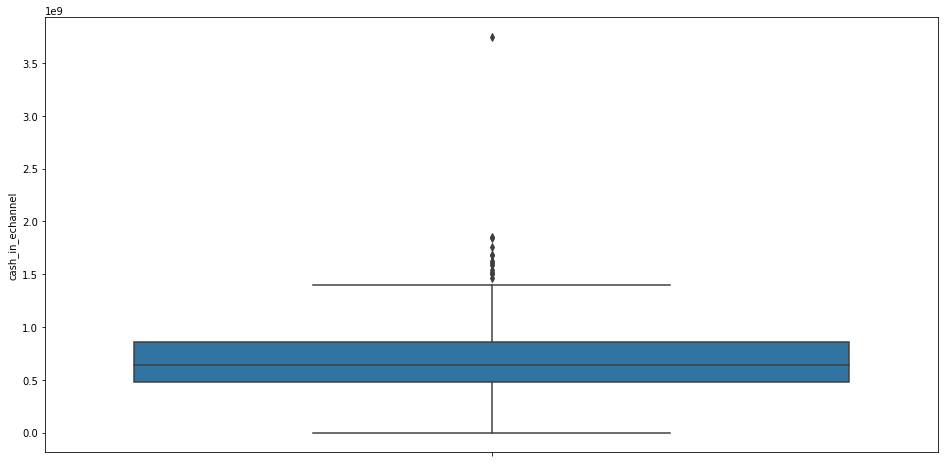

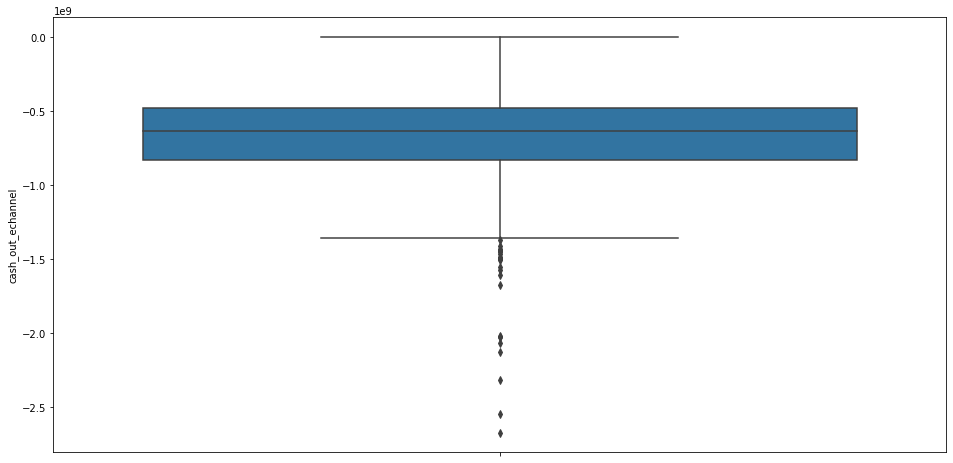

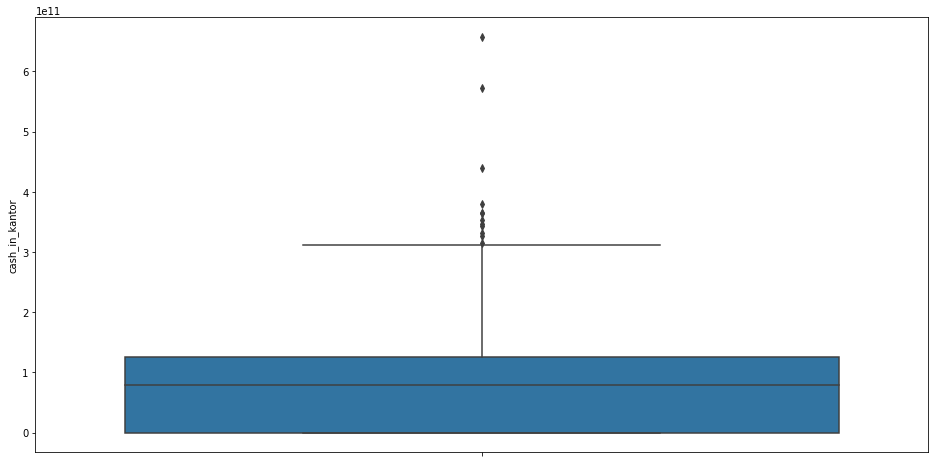

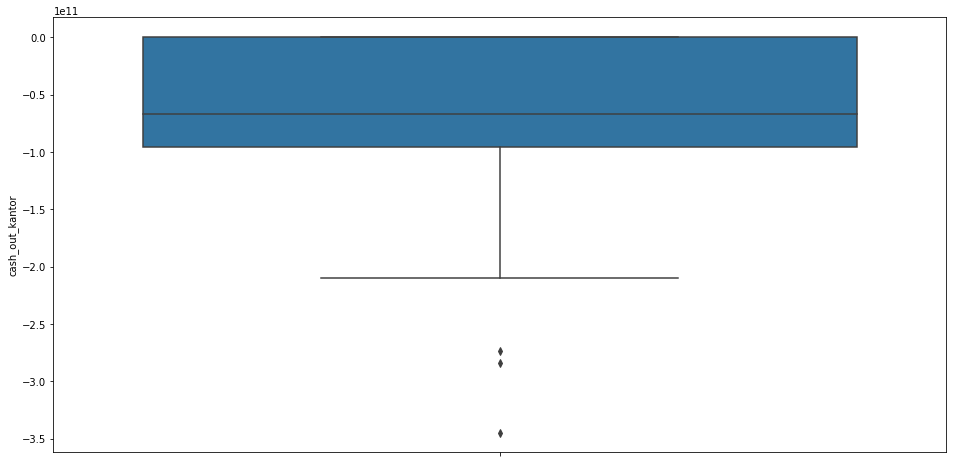

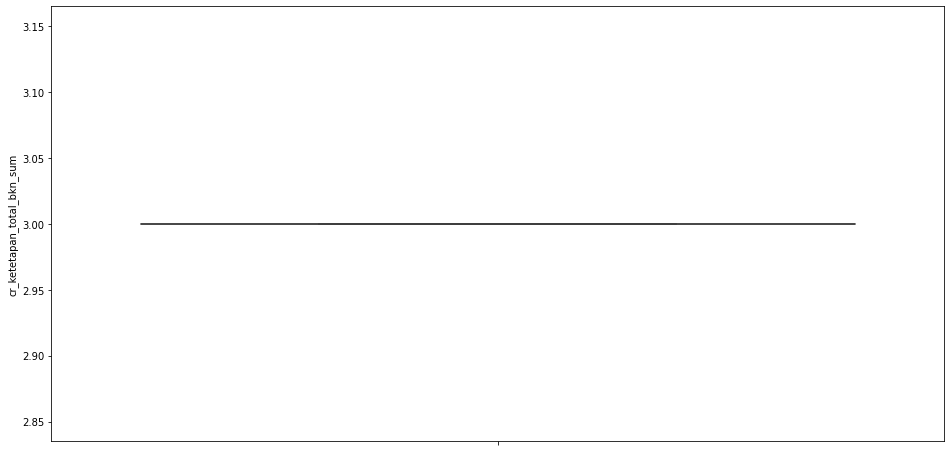

...

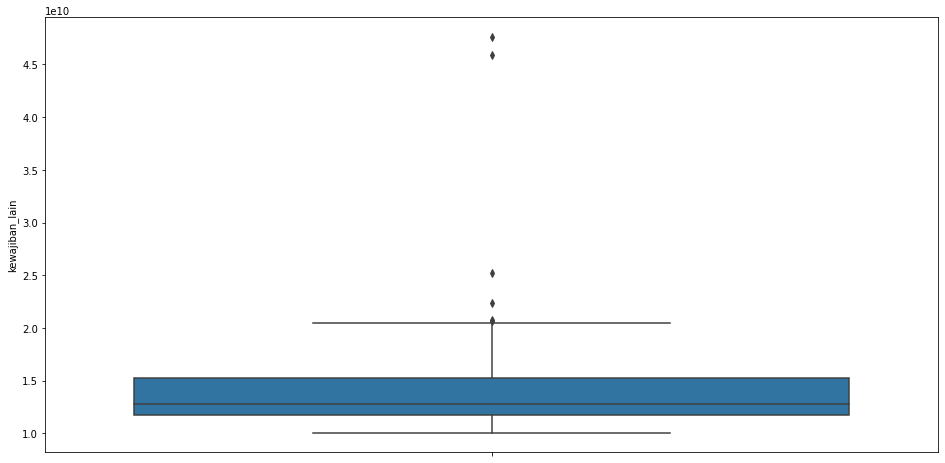

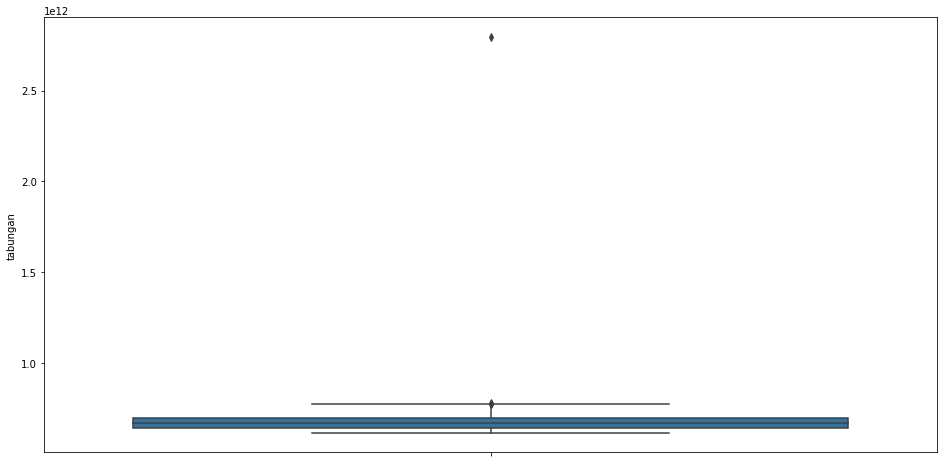

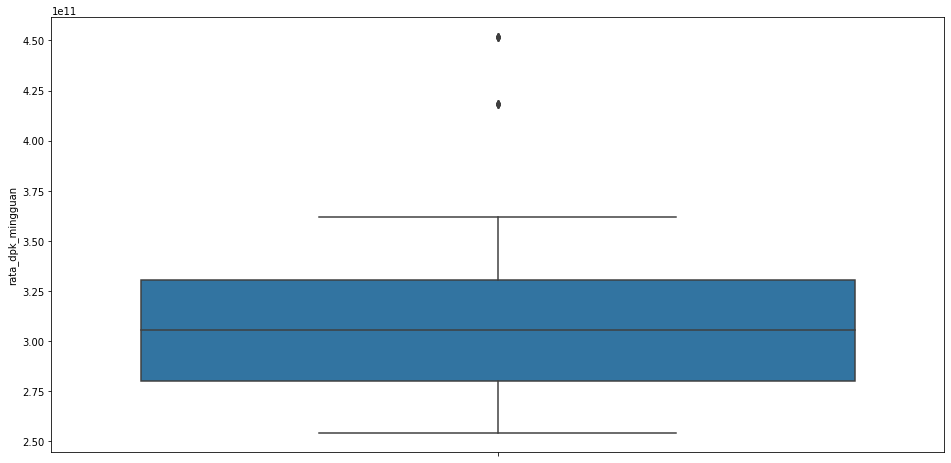

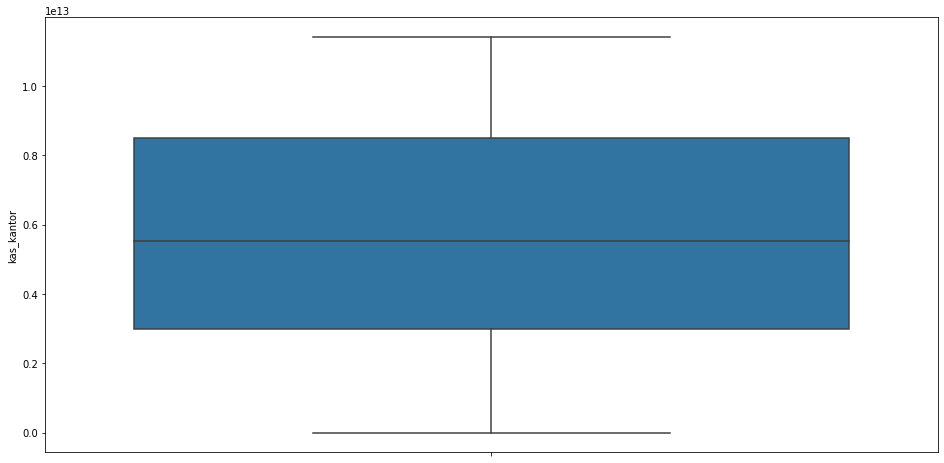

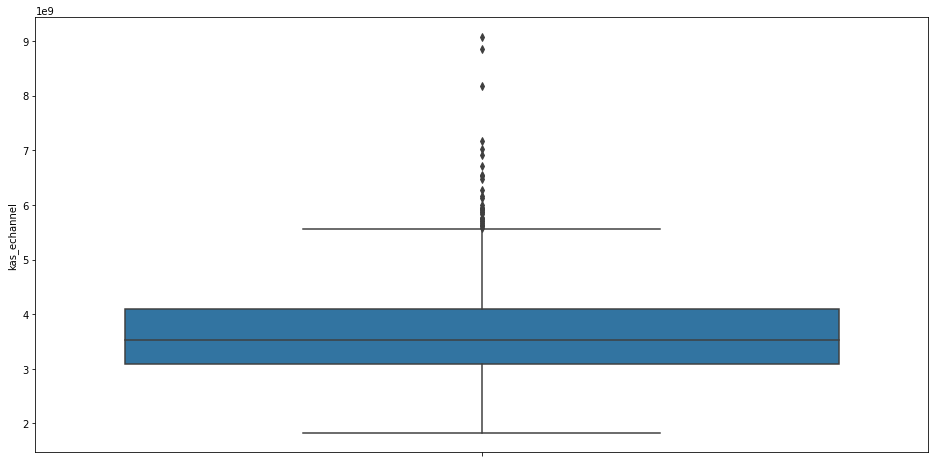

In [ ]:
for col in train_df.columns:
    if col != 'periode':
        plt.figure(figsize=(16, 8))
        sns.boxplot(y=train_df[col])
        plt.show()

In [ ]:
def show_data_proportion(df):
    for col in df.columns:
        if col != 'periode':
            print(col)
            q1 = df[col].quantile(0.25)
            q3 = df[col].quantile(0.75)
            iqr = q3 - q1
            lb = q1 - 1.5 * iqr
            ub = q3 + 1.5 * iqr

            num_inlier = len(df[df[col].between(lb, ub, inclusive=True)])
            num_outlier = len(df[~df[col].between(lb, ub, inclusive=True)])

            inlier_frac = num_inlier / len(df)
            outlier_frac = num_outlier / len(df)

            print(f'lower bound: {lb}')
            print(f'upper bound: {ub}')
            print(f'inlier frac: {inlier_frac}')
            print(f'num inlier: {num_inlier}')
            print(f'outleir frac: {outlier_frac}')
            print(f'num outlier: {num_outlier}')
            print('-'*100)

In [ ]:
show_data_proportion(train_df)

cash_in_echannel
lower bound: -98381250.0
upper bound: 1430168750.0
inlier frac: 0.9672897196261683
num inlier: 414
outleir frac: 0.03271028037383177
num outlier: 14
----------------------------------------------------------------------------------------------------
cash_out_echannel
lower bound: -1361906250.0
upper bound: 50043750.0
inlier frac: 0.9439252336448598
num inlier: 404
outleir frac: 0.056074766355140186
num outlier: 24
----------------------------------------------------------------------------------------------------
cash_in_kantor
lower bound: -188218305151.8
upper bound: 313697175253.0
inlier frac: 0.9719626168224299
num inlier: 416
outleir frac: 0.028037383177570093
num outlier: 12
----------------------------------------------------------------------------------------------------
cash_out_kantor
lower bound: -239525502352.5
upper bound: 143715301411.5
inlier frac: 0.9929906542056075
num inlier: 425
outleir frac: 0.007009345794392523
num outlier: 3
---------------------

In [ ]:
def replace_outliers(df, std_thres):
    new_df = df.copy()
    for col in new_df.columns:
        if col != 'periode' and col !='cr_ketetapan_total_bkn_sum':
            global_std = new_df[col].std()
            global_med = new_df[col].median()
            # thresholds
            thres_up = global_med + std_thres*global_std
            thres_dw = global_med - std_thres*global_std
            # get middle values (y(t-1) + y(t+1)) / 2
            new_df['mid'] = (new_df[col].shift(-1) + new_df[col].shift(1)) / 2
            new_df['mid'].iloc[0] = new_df['mid'].iloc[1]
            new_df['mid'].iloc[-1] = new_df['mid'].iloc[-2]
            # replace outliers with middle values
            new_df[col] = np.where(new_df[col] > thres_up, new_df['mid'], new_df[col])
            new_df[col] = np.where(new_df[col] < thres_dw, new_df['mid'], new_df[col])
    return new_df.drop(['mid'], axis=1)

In [ ]:
# std_thres = 3.7
# global_std = train_diff_df['kas_echannel_diff'].std()
# global_med = train_diff_df['kas_echannel_diff'].median()
# # thresholds
# thres_up = global_med + std_thres*global_std
# thres_dw = global_med - std_thres*global_std
# print(thres_up)
# print(thres_dw)

In [ ]:
t = 1
train_diff_df = pd.DataFrame()
for col in train_df:
    if col != 'periode':
        train_diff_df[col+'_diff'] = train_df[col] - train_df[col].shift(t)
train_diff_df['periode'] = train_df['periode']

In [ ]:
# train_diff_df = replace_outliers(train_diff_df, std_thres=3.7)

#### Value Distribution

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


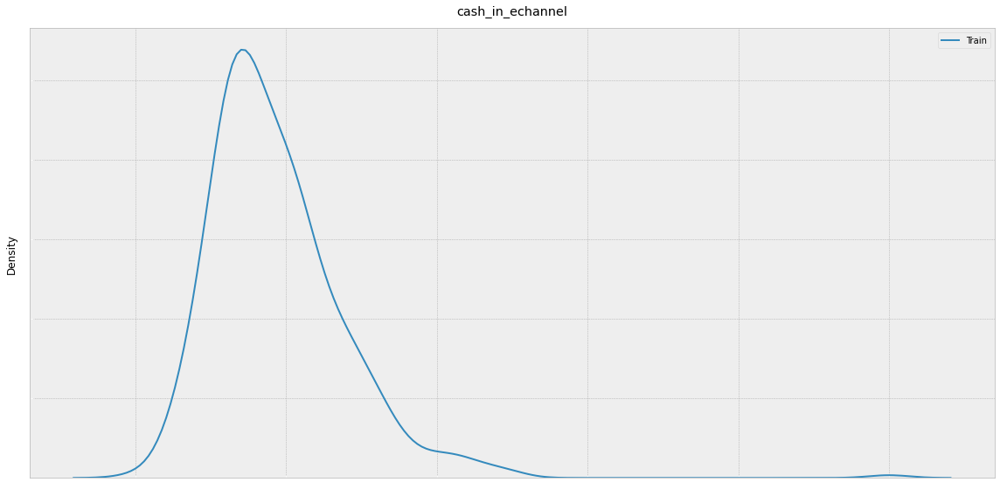

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


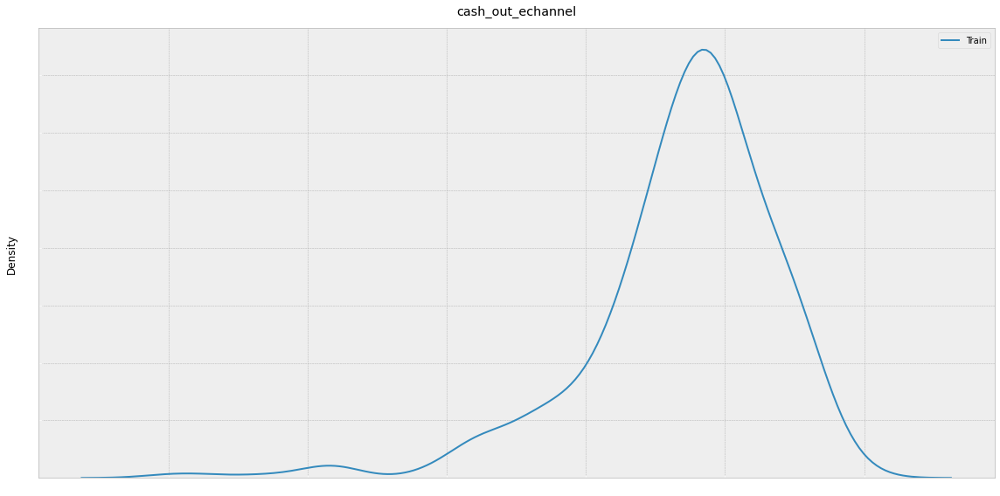

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


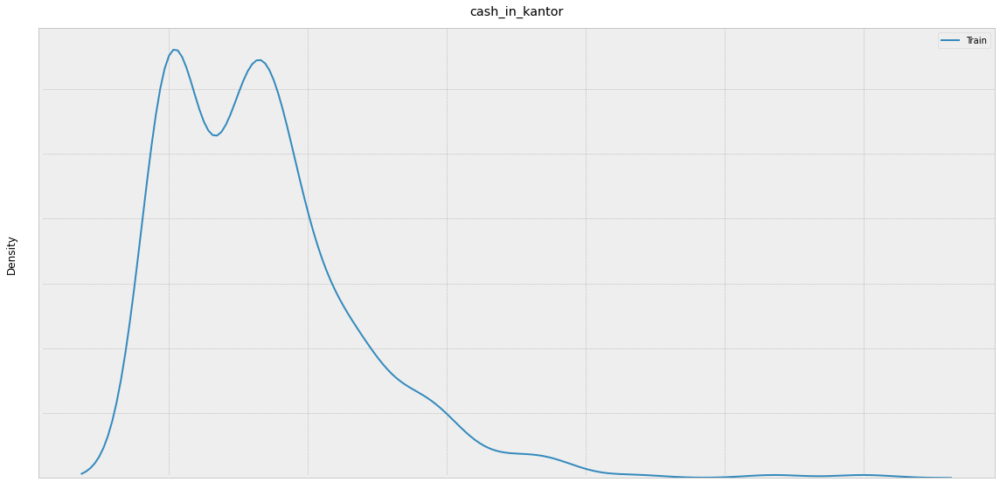

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


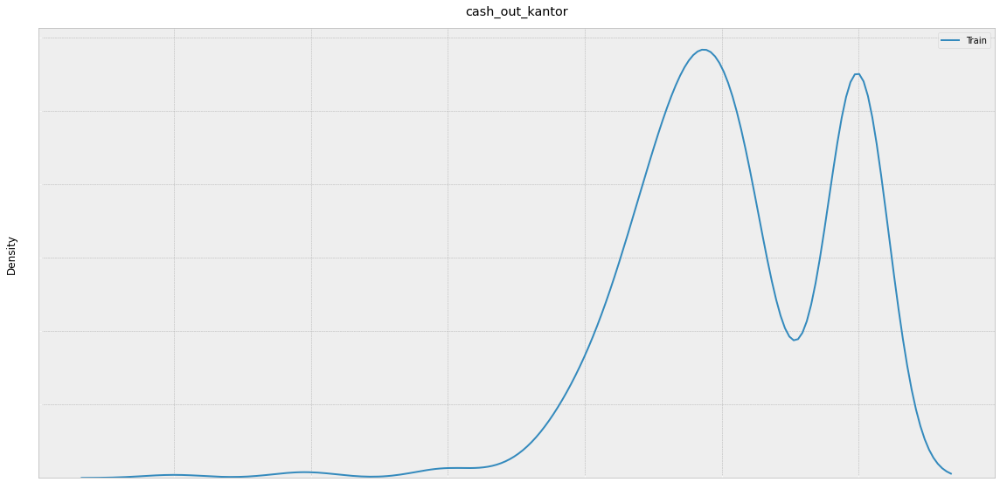

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)
/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:306: UserWarning: Dataset has 0 variance; skipping density estimate.
  warnings.warn(msg, UserWarning)
No handles with labels found to put in legend.


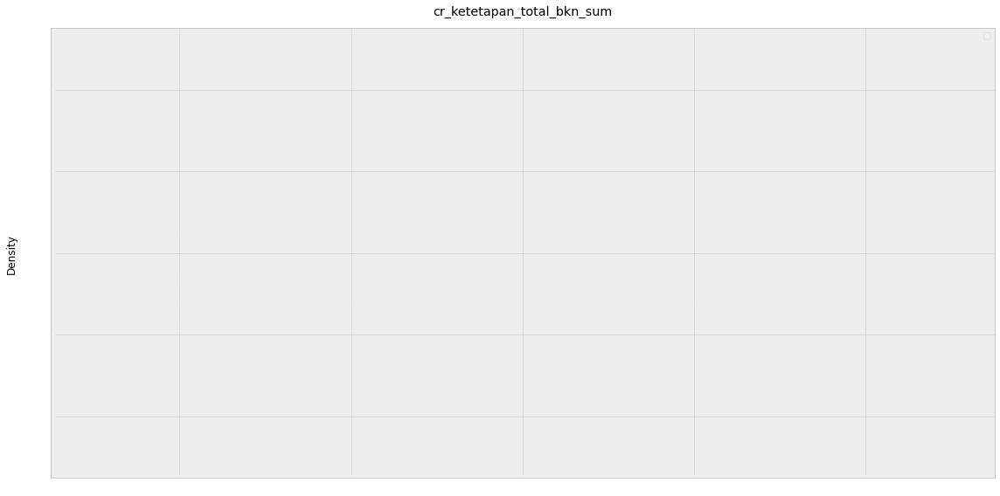

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


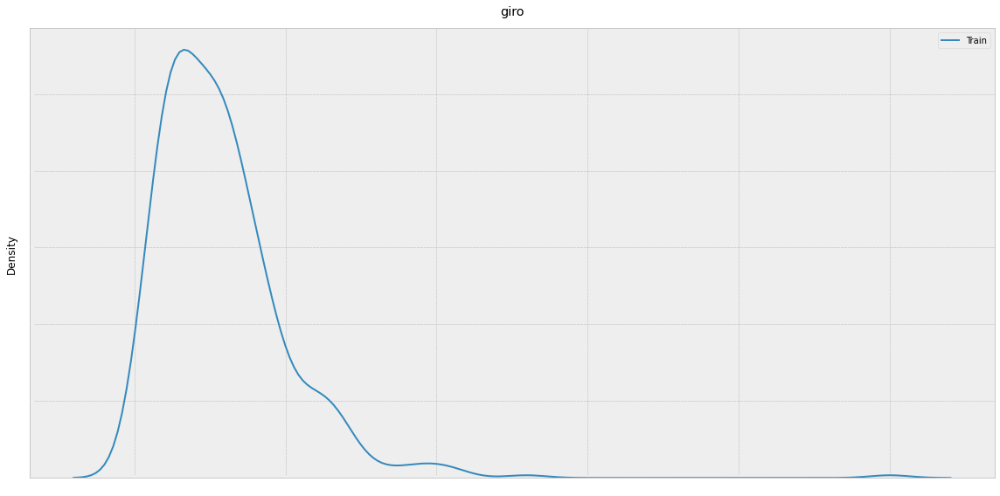

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


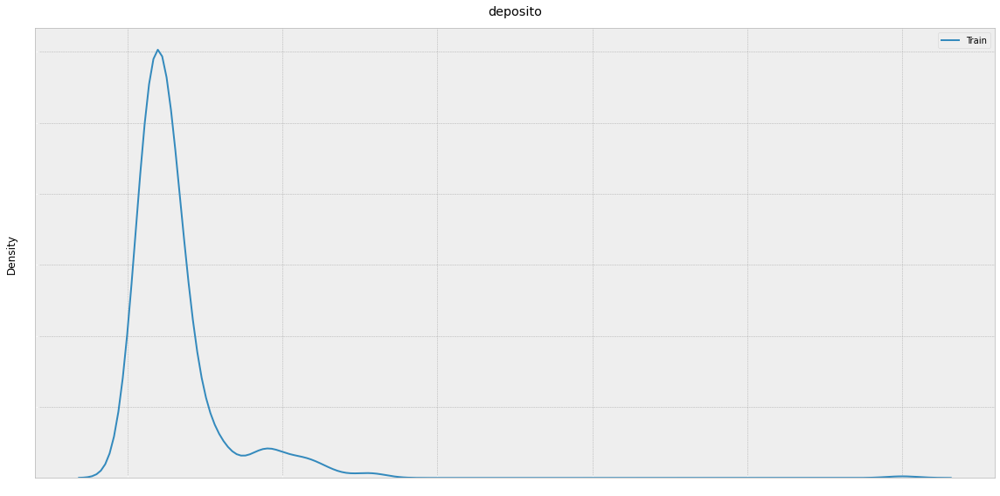

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


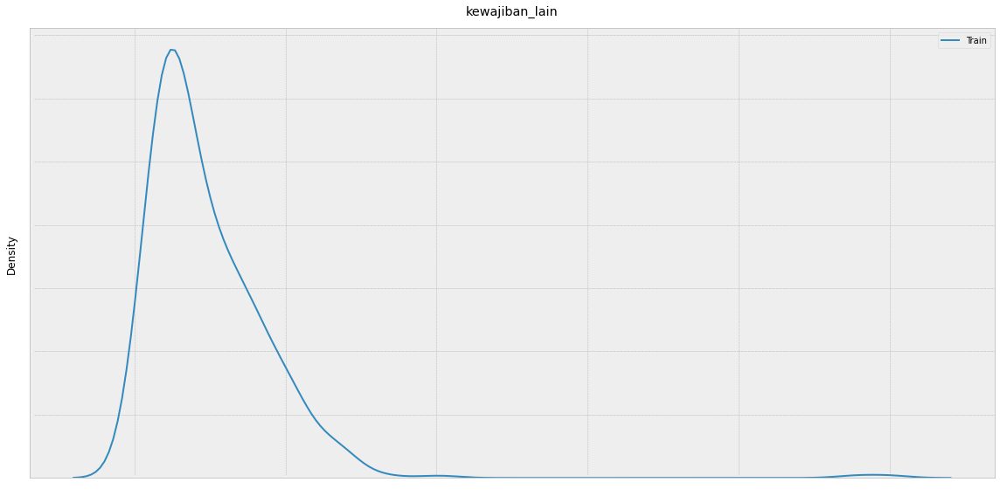

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


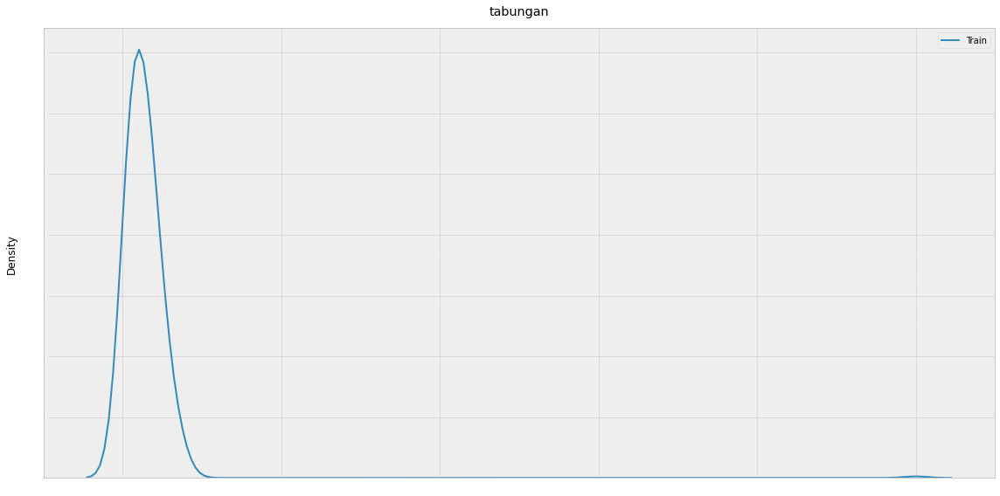

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


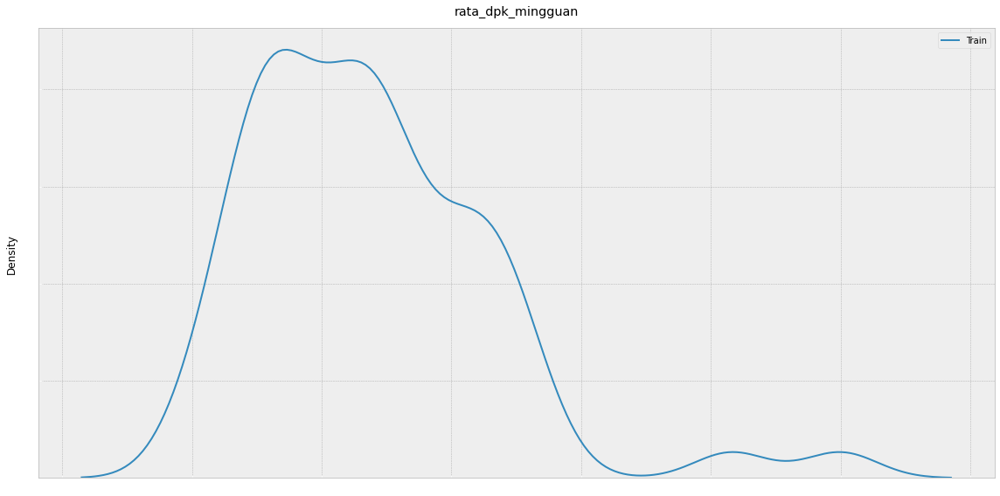

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


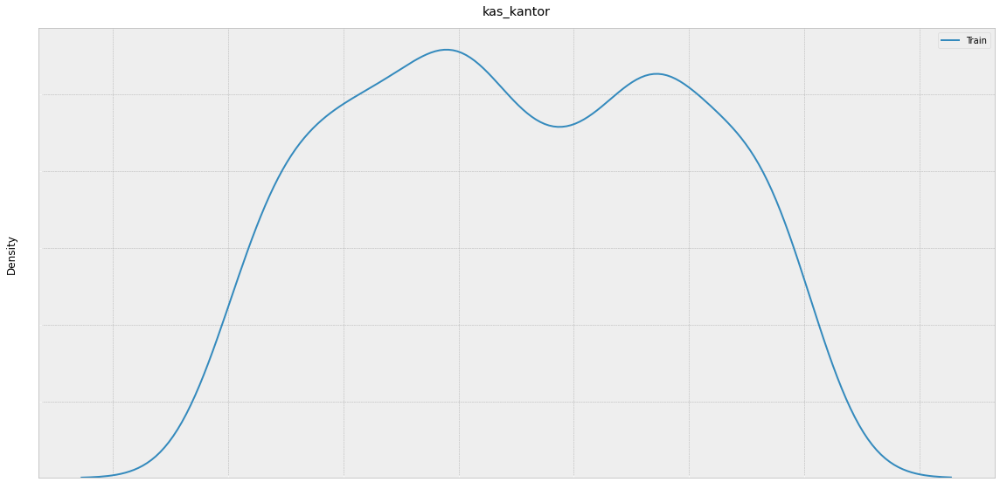

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


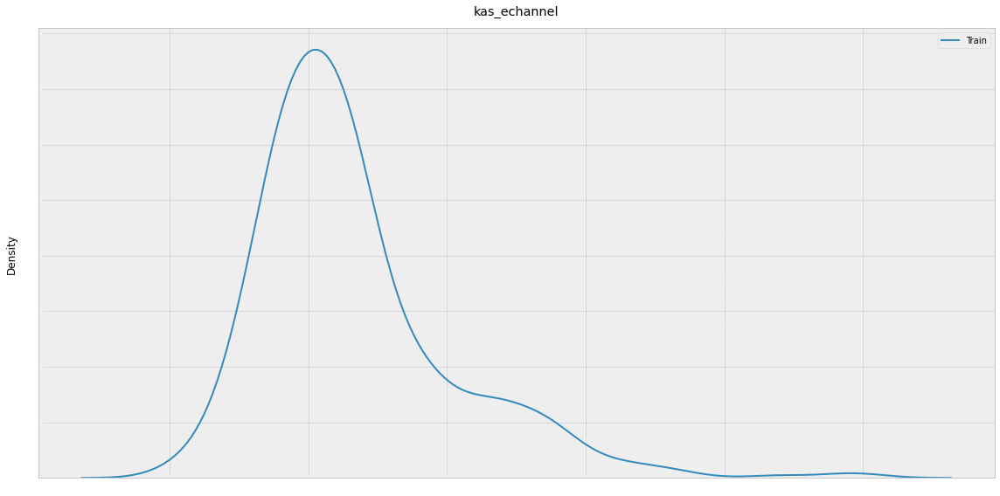

In [ ]:
from sklearn.preprocessing import MinMaxScaler
vd = MinMaxScaler().fit_transform(train_df.drop('periode', axis=1))
all_feat_cols = [c for c in train_df.columns if c != 'periode']

plt.style.use('bmh')
for i in range(len(all_feat_cols)):

    try:
        plt.figure(figsize=(16, 8))
        sns.distplot(vd[:, i], hist=False, label='Train')

        # plt.ylim(0, 1e-10)
        plt.tick_params(axis='x', colors='white')
        plt.tick_params(axis='y', colors='white')
        plt.xlabel(None)
        plt.title(all_feat_cols[i], pad=15)
        plt.legend()
        plt.tight_layout()
        plt.show()

    except:
        continue

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `kdeplot` (an axes-level function for kernel density plots).
  warnings.warn(msg, FutureWarning)


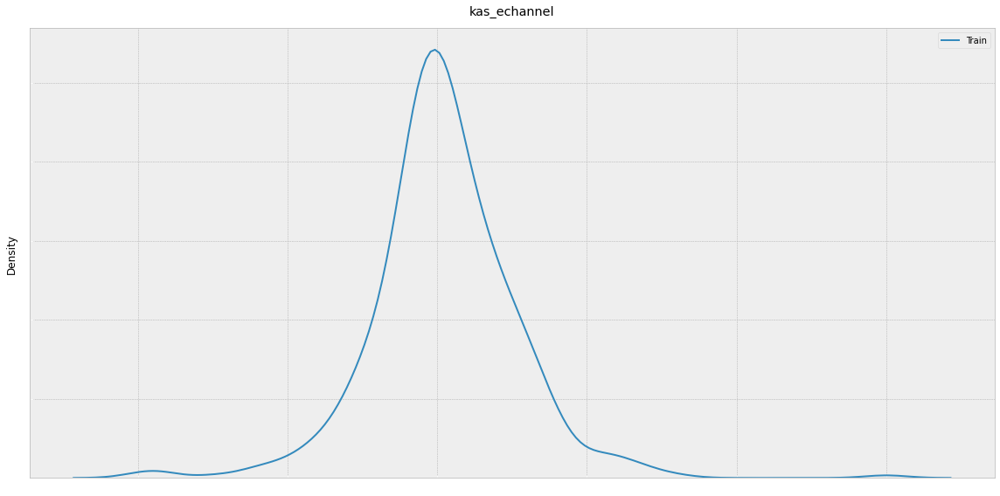

In [ ]:
plt.style.use('bmh')

plt.figure(figsize=(16, 8))
sns.distplot(MinMaxScaler().fit_transform((train_df['cash_in_echannel'] + train_df['cash_out_echannel']).values.reshape(-1, 1)), hist=False, label='Train')

# plt.ylim(0, 1e-10)
plt.tick_params(axis='x', colors='white')
plt.tick_params(axis='y', colors='white')
plt.xlabel(None)
plt.title(all_feat_cols[i], pad=15)
plt.legend()
plt.tight_layout()
plt.show()

#### Plot value projection

Real Value

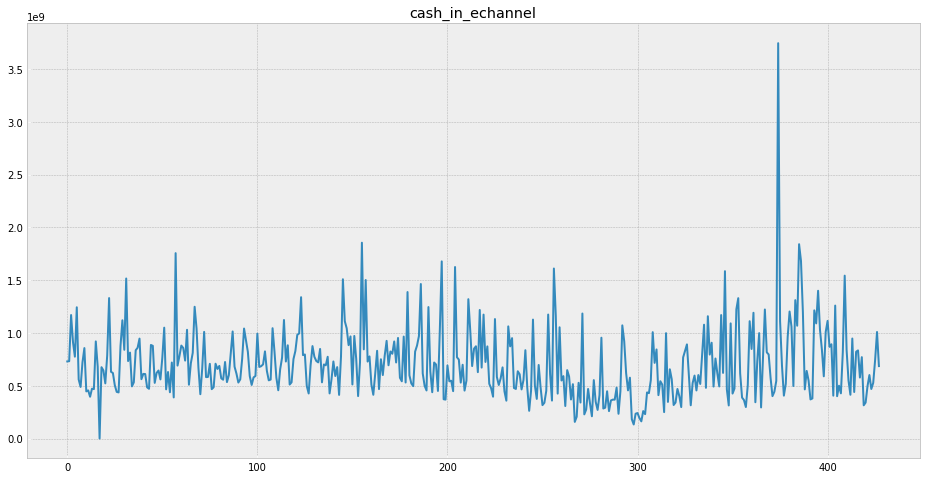

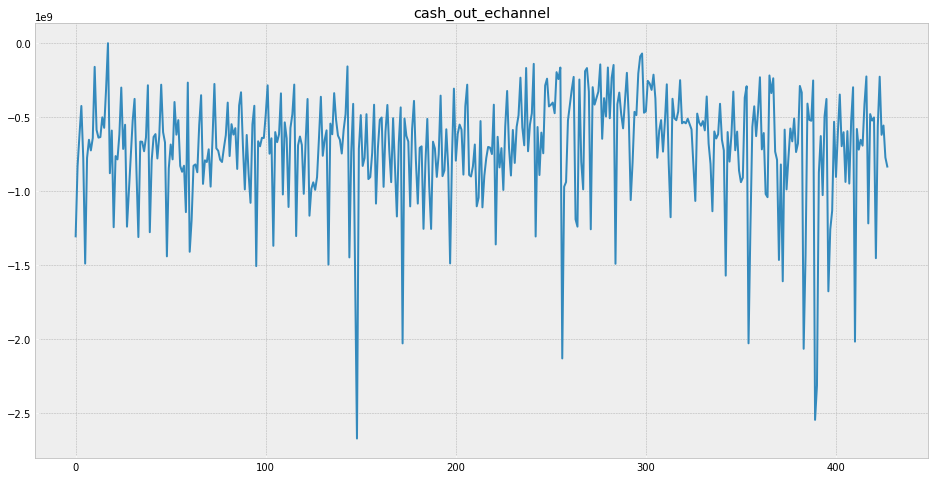

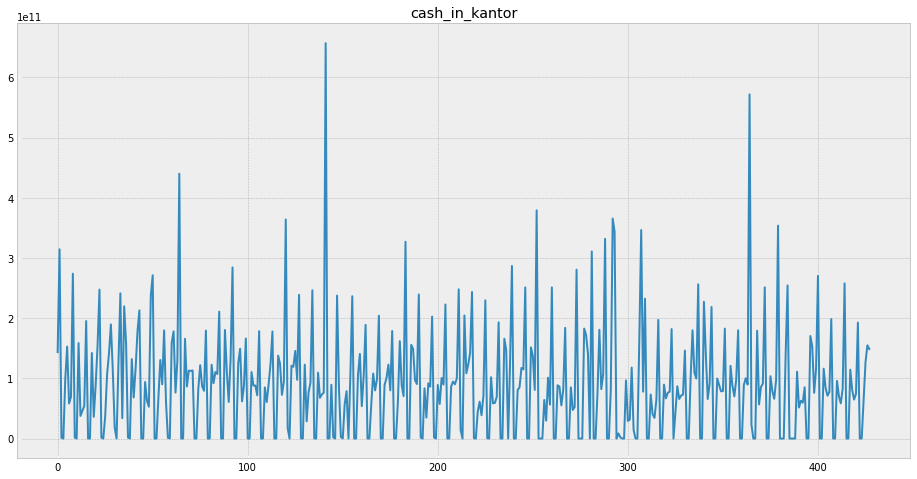

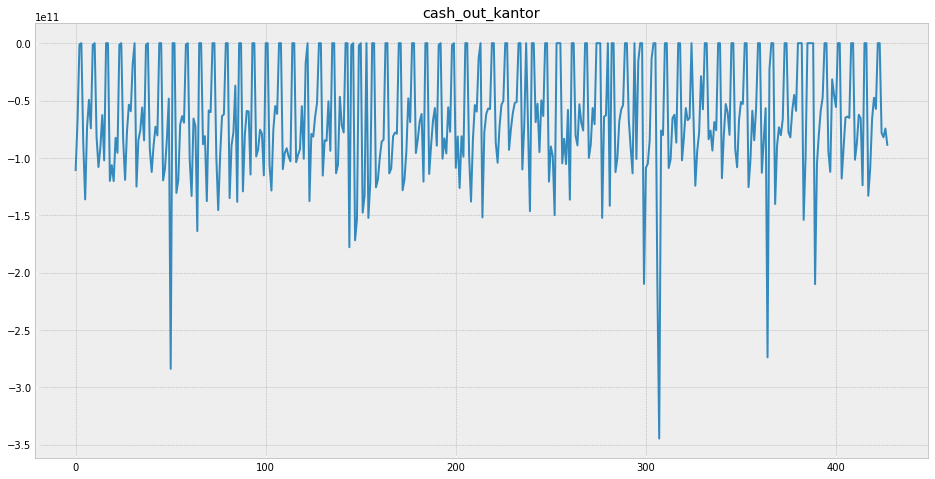

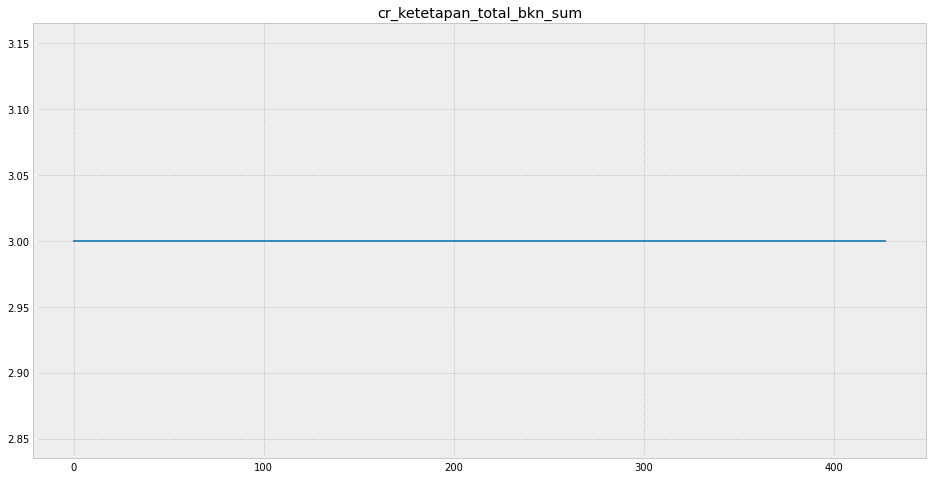

...

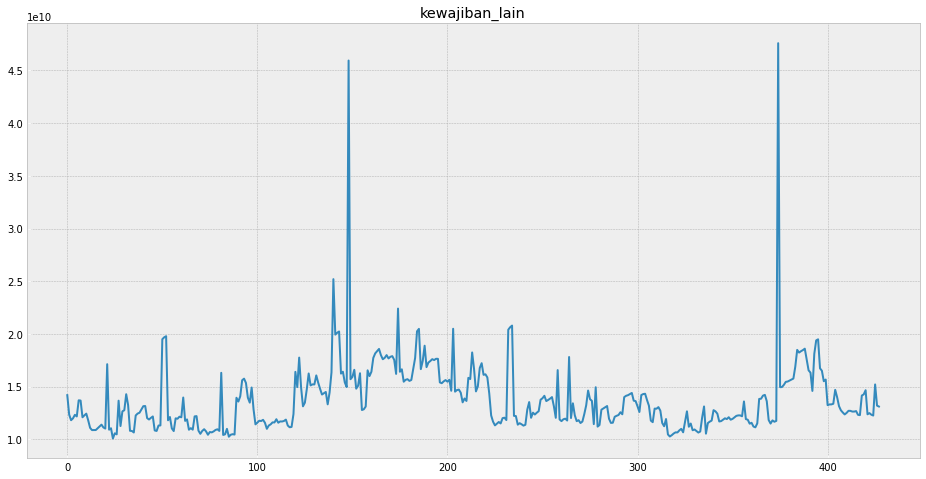

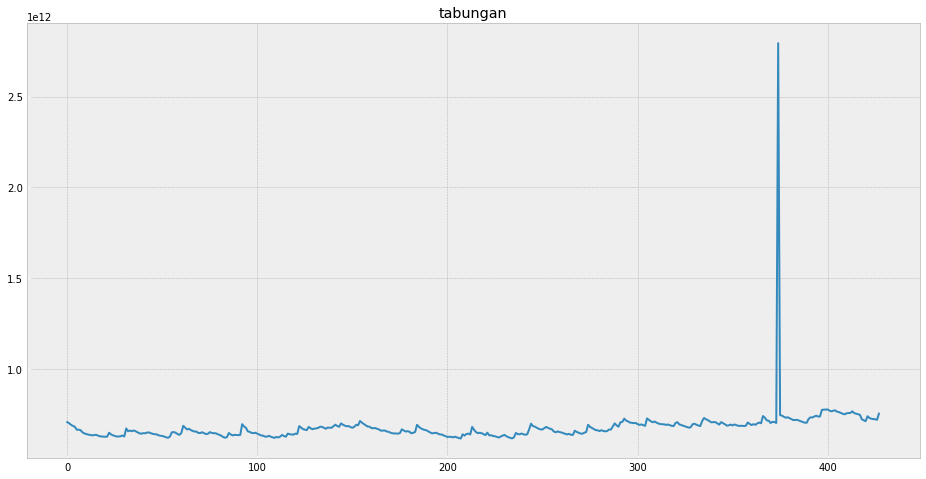

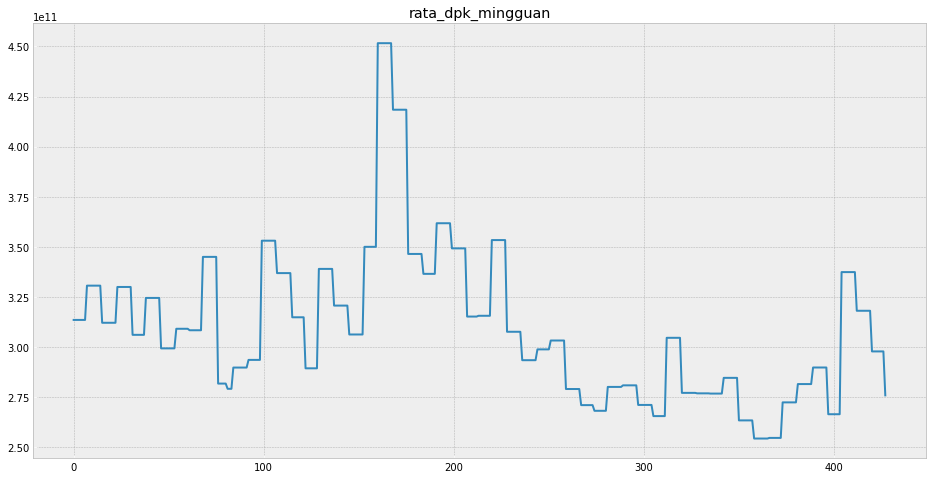

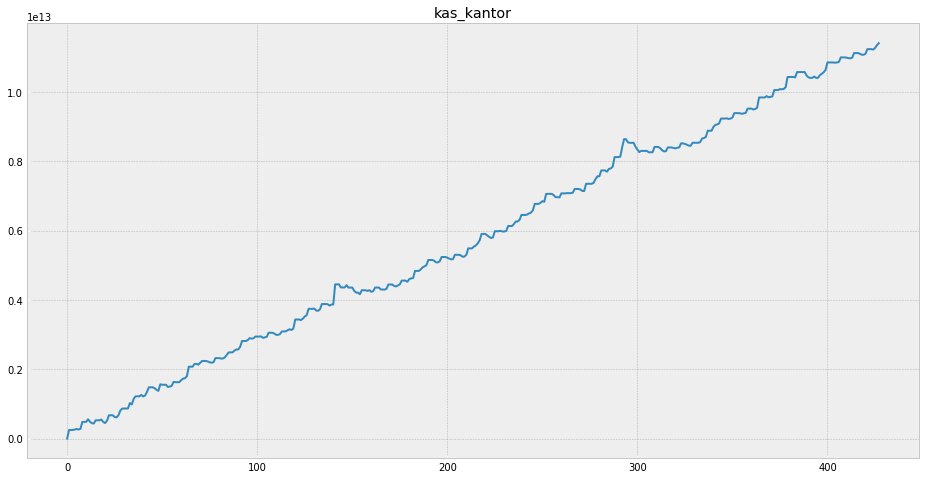

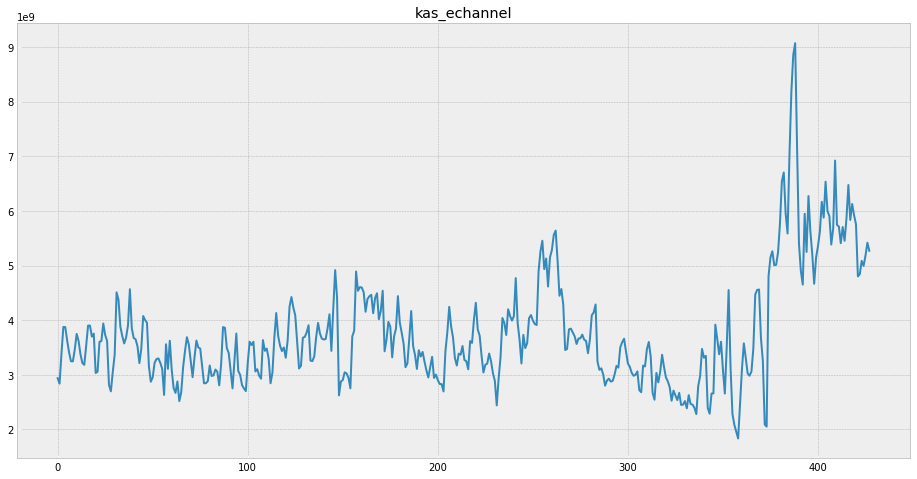

In [ ]:
for col in train_df.columns:
    if col != 'periode':
        plt.figure(figsize=(16, 8))
        plt.plot(train_df[col])
        plt.title(col)
        plt.tick_params(axis='x', color='white')
        plt.tick_params(axis='y', color='white')
        plt.show()

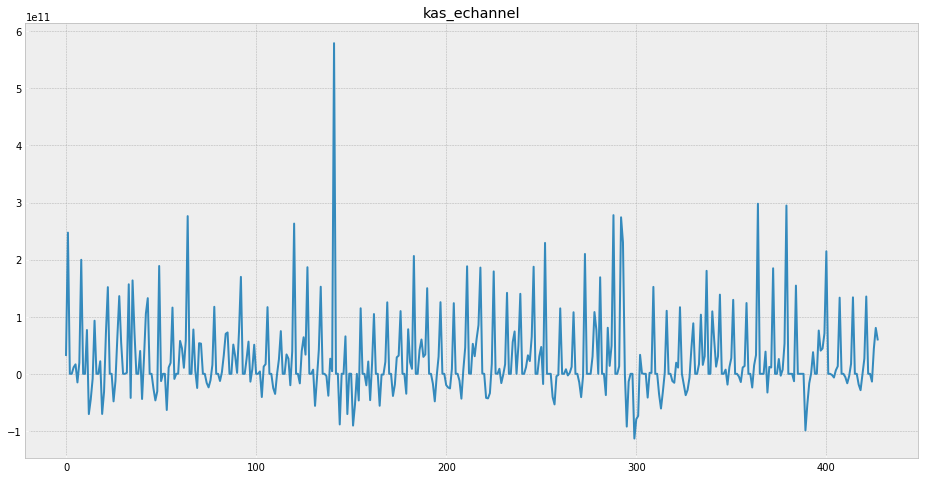

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(train_df['cash_in_kantor'] + train_df['cash_out_kantor'])
plt.title(col)
plt.tick_params(axis='x', color='white')
plt.tick_params(axis='y', color='white')
plt.show()

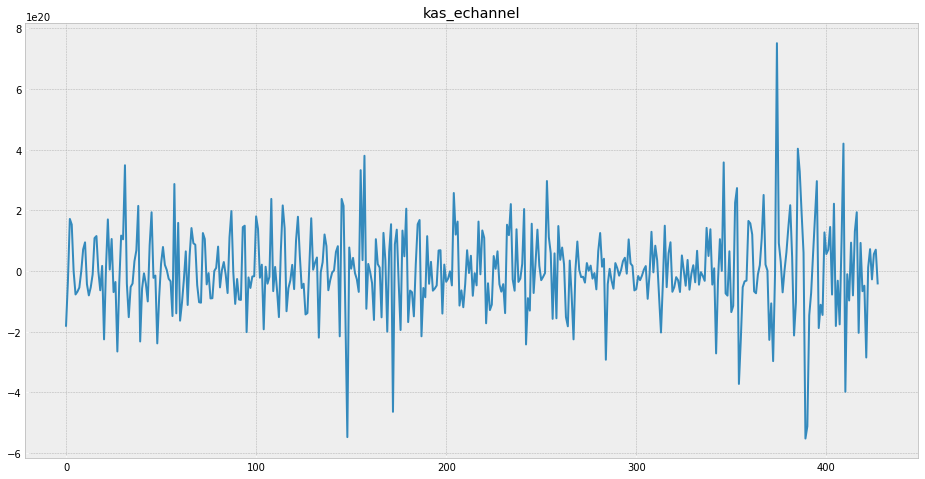

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot((train_df['cash_in_echannel'] + train_df['cash_out_echannel']) * train_df['rata_dpk_mingguan'])
plt.title(col)
plt.tick_params(axis='x', color='white')
plt.tick_params(axis='y', color='white')
plt.show()

Log Value

In [ ]:
from sklearn.preprocessing import MinMaxScaler, QuantileTransformer, RobustScaler, PowerTransformer
scl = MinMaxScaler(feature_range=(0.1, 1))
all_cols = [c for c in train_df.columns if c != 'periode']
scaled_train = scl.fit_transform(train_df[all_cols])
# scaled_train_df = pd.DataFrame()
# scaled_train_df['periode'] = train_df['periode']
# for i in range(len(all_cols)):
#     scaled_train_df[all_cols[i]] = scaled_train[:, i]

# sclb = PowerTransformer(method='box-cox')
# # all_cols = [c for c in train_df.columns if c != 'periode']
# scaled_train = sclb.fit_transform(scaled_train_df[all_cols])

In [ ]:
scaled_train_df = pd.DataFrame()
scaled_train_df['periode'] = train_df['periode']
for i in range(len(all_cols)):
    scaled_train_df[all_cols[i]] = scaled_train[:, i]

scaled_train_df

,periode,cash_in_echannel,cash_out_echannel,cash_in_kantor,cash_out_kantor,cr_ketetapan_total_bkn_sum,giro,deposito,kewajiban_lain,tabungan,rata_dpk_mingguan,kas_kantor,kas_echannel
0,2019-07-31,0.275534,0.560331,0.296834,0.711241,0.1,0.226664,0.124842,0.198770,0.137284,0.370000,0.100000,0.237369
1,2019-08-01,0.275991,0.719511,0.530752,0.824804,0.1,0.207707,0.127391,0.154233,0.134777,0.370000,0.119512,0.224938
2,2019-08-02,0.381172,0.790547,0.101714,0.997018,0.1,0.209745,0.127444,0.141747,0.131090,0.370000,0.119521,0.293147
3,2019-08-03,0.319556,0.857067,0.100000,1.000000,0.1,0.209690,0.127445,0.145974,0.128793,0.370000,0.119521,0.354017
4,2019-08-04,0.286338,0.737779,0.235403,0.772114,0.1,0.225008,0.127361,0.153969,0.126570,0.370000,0.120431,0.353682
...,...,...,...,...,...,...,...,...,...,...,...,...,...
423,2020-09-26,0.212776,0.923688,0.100000,1.000000,0.1,0.161790,0.122736,0.154282,0.145040,0.298323,0.986478,0.504372
424,2020-09-27,0.226729,0.791440,0.188595,0.795595,0.1,0.187666,0.122580,0.152370,0.144358,0.298323,0.985403,0.492991
425,2020-09-28,0.278779,0.812524,0.273218,0.785843,0.1,0.340711,0.121982,0.223126,0.143964,0.298323,0.988906,0.516325
426,2020-09-29,0.342582,0.739751,0.312165,0.805691,0.1,0.200926,0.114407,0.174982,0.142621,0.298323,0.995252,0.545821


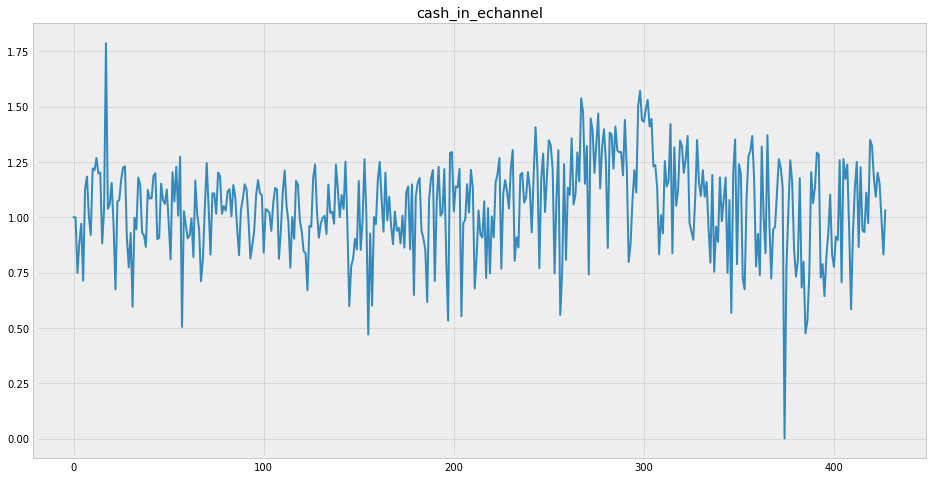

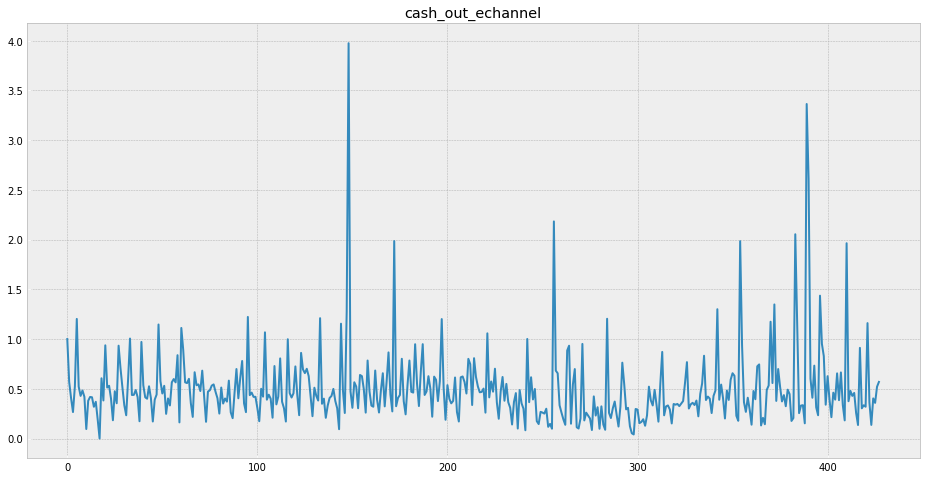

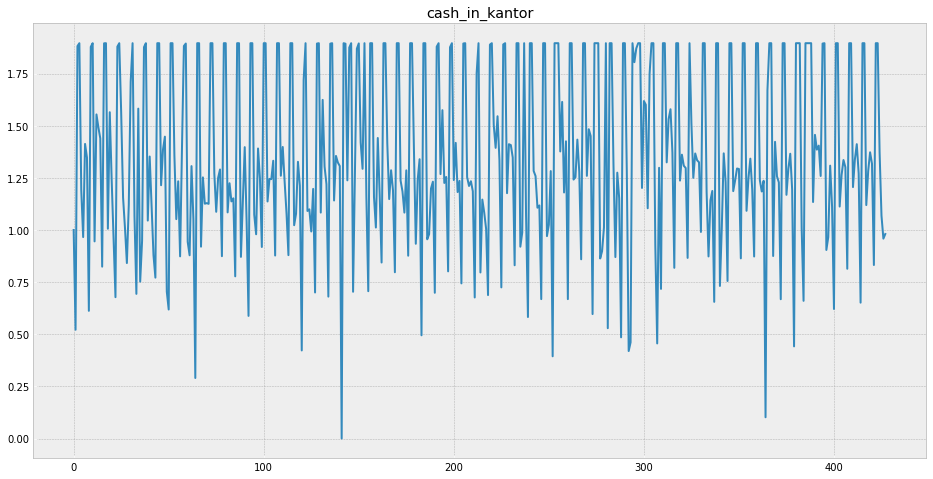

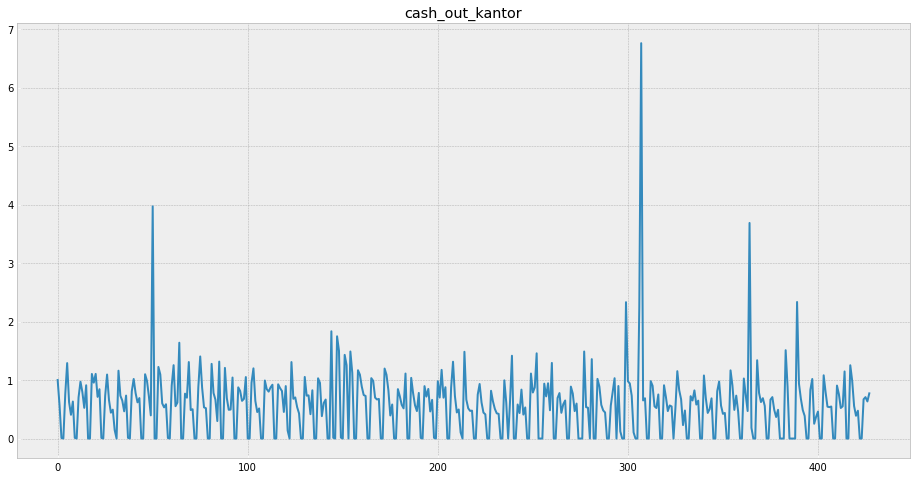

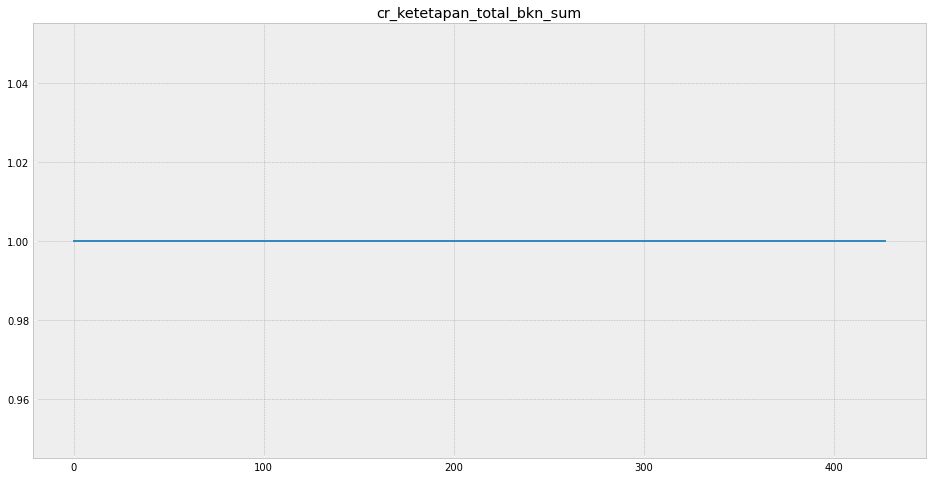

...

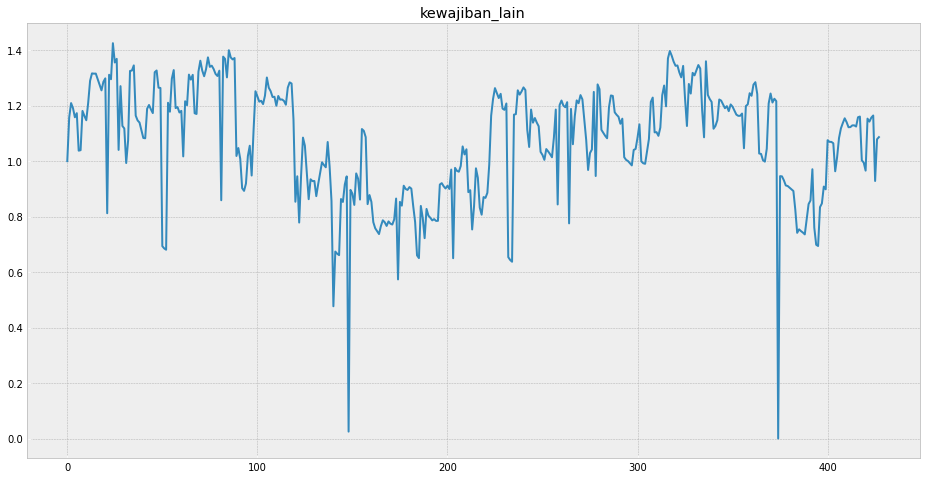

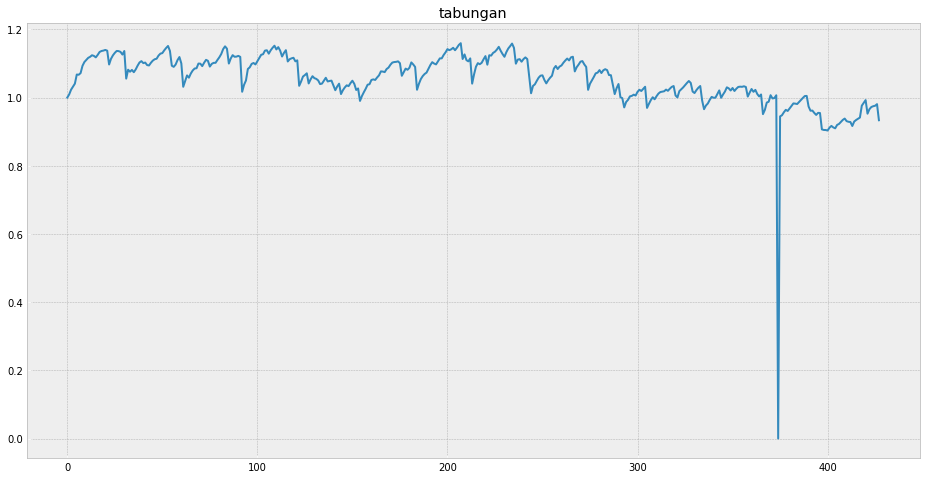

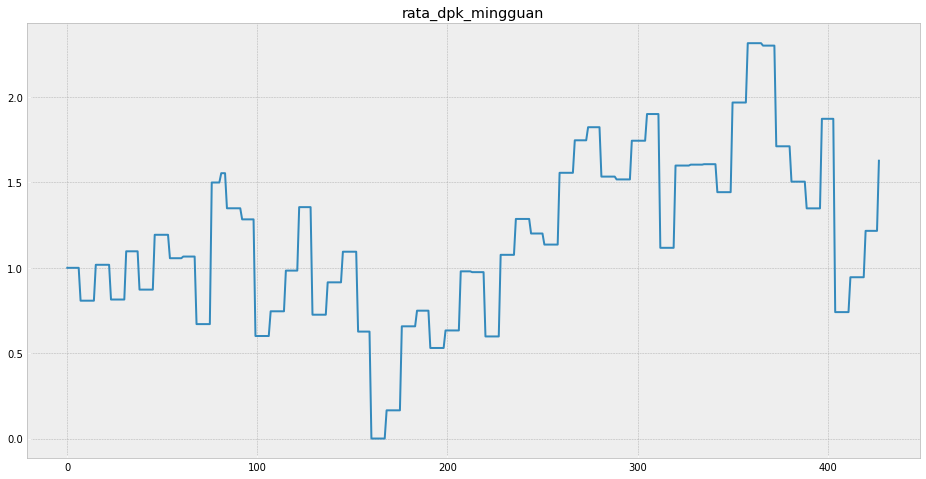

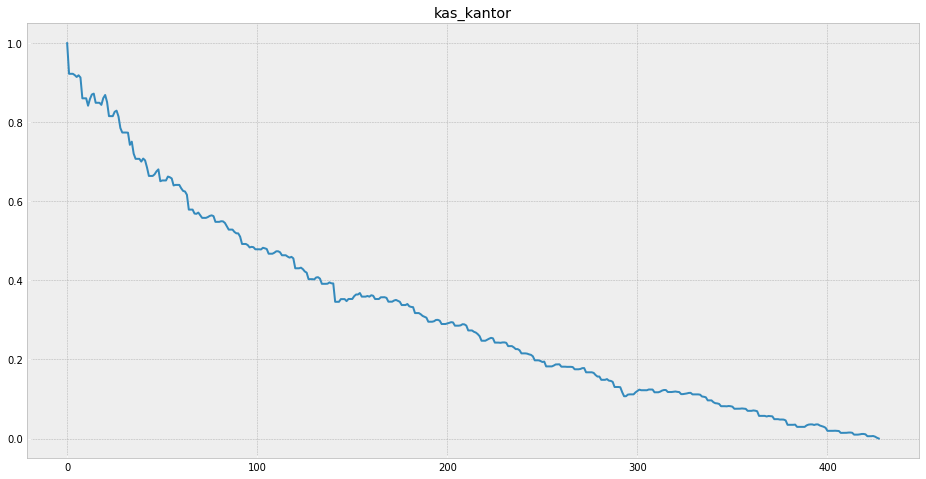

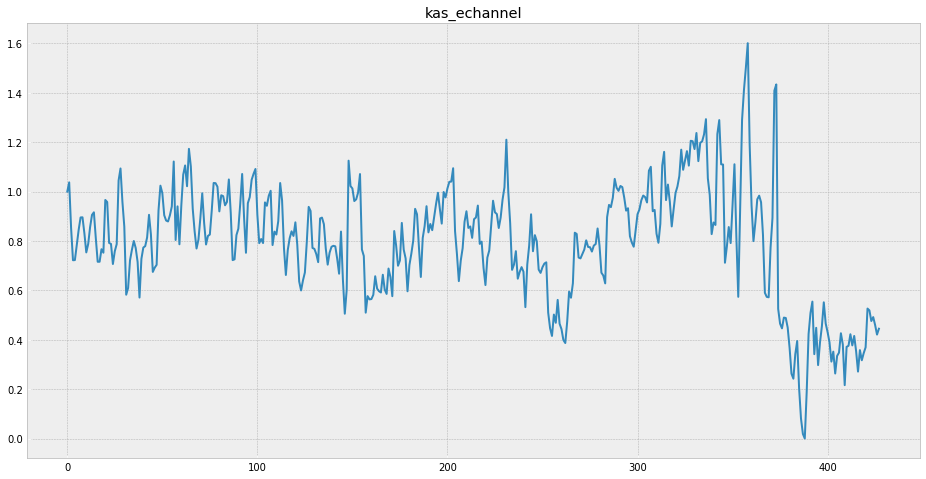

In [ ]:
for col in scaled_train_df.columns:
    if col != 'periode':
        plt.figure(figsize=(16, 8))
        plt.plot(np.log(scaled_train_df[col]) / np.log(scaled_train_df[col][0]))
        # plt.plot(scaled_train_df[col])
        plt.title(col)
        plt.tick_params(axis='x', color='white')
        plt.tick_params(axis='y', color='white')
        plt.show()

Diff

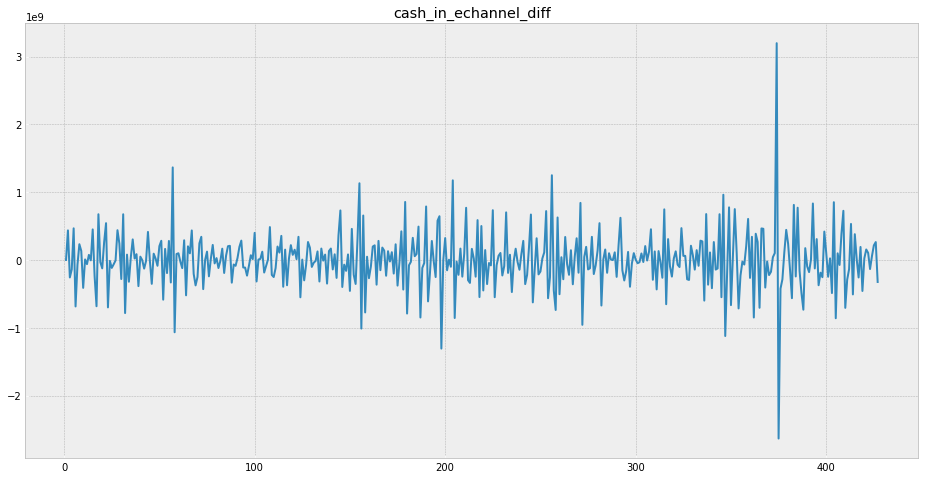

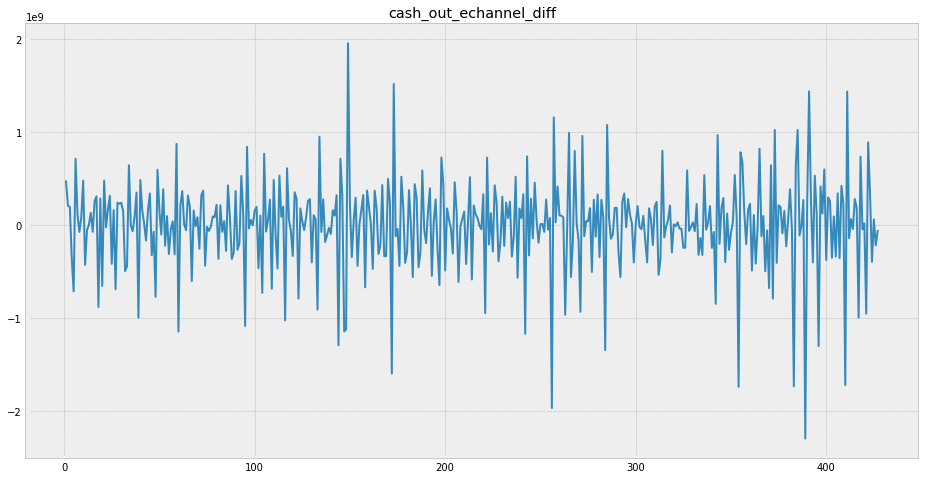

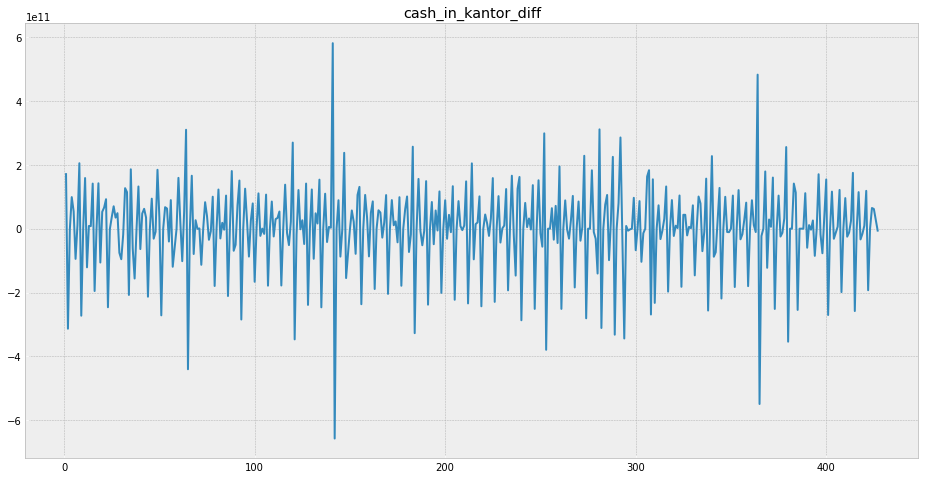

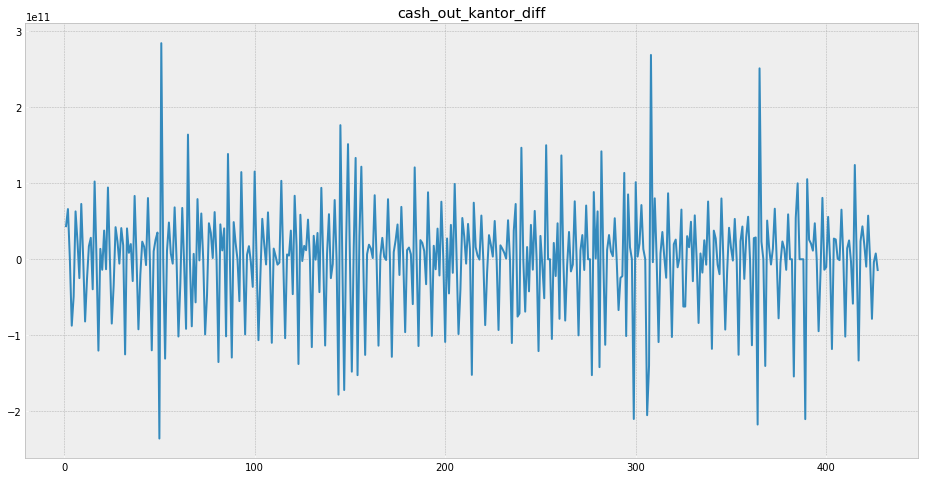

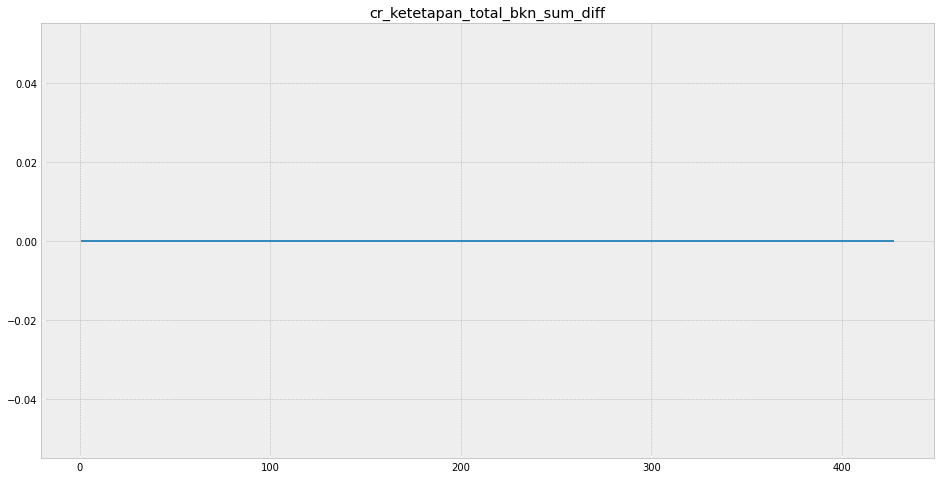

...

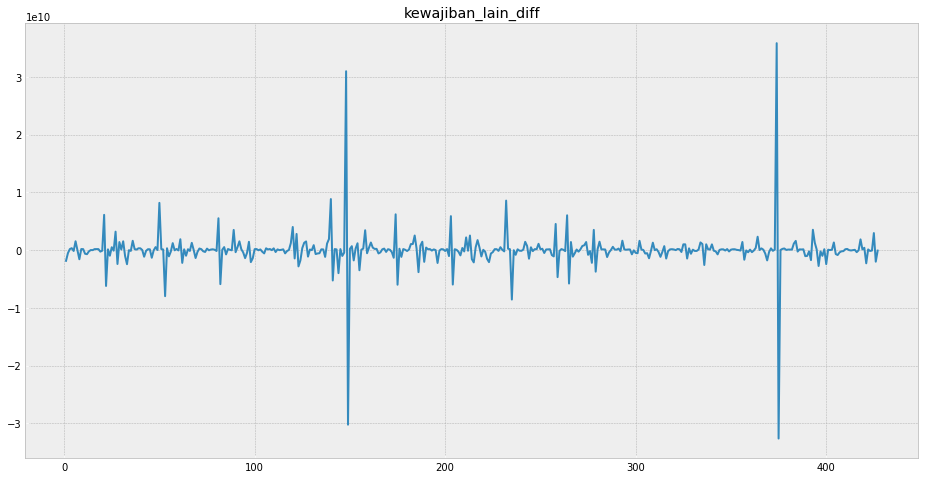

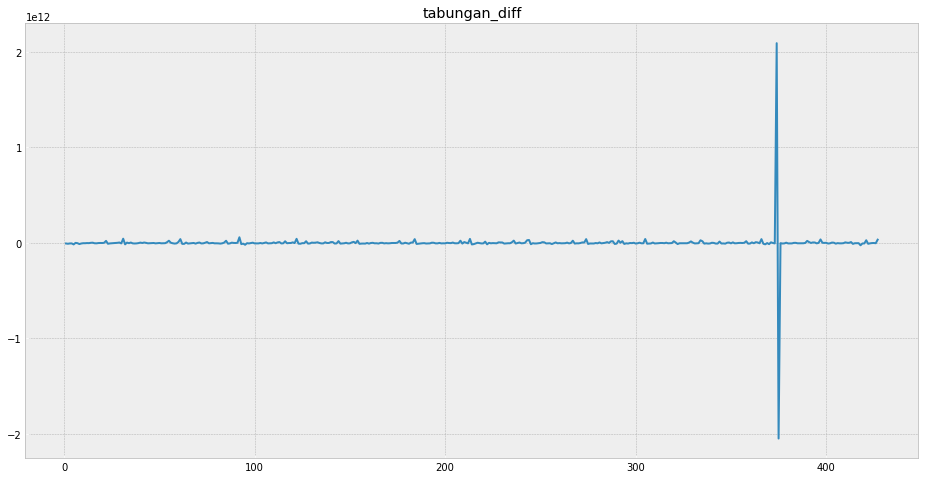

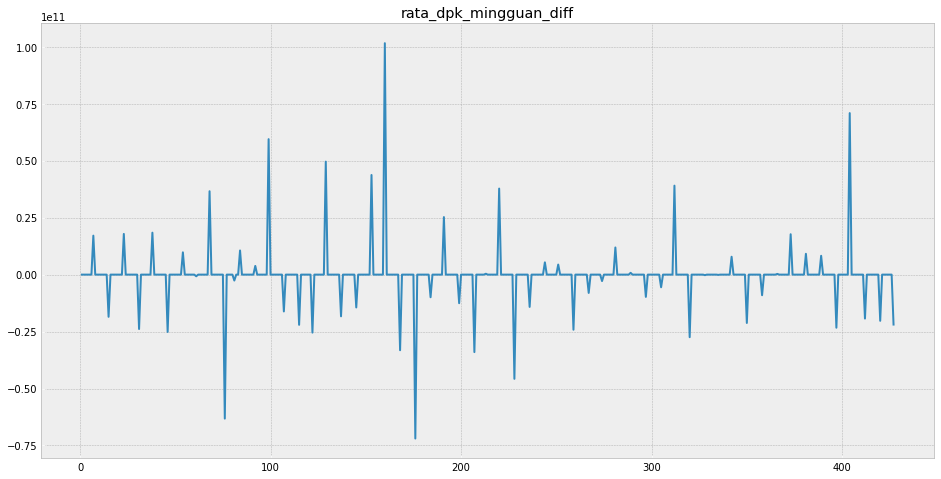

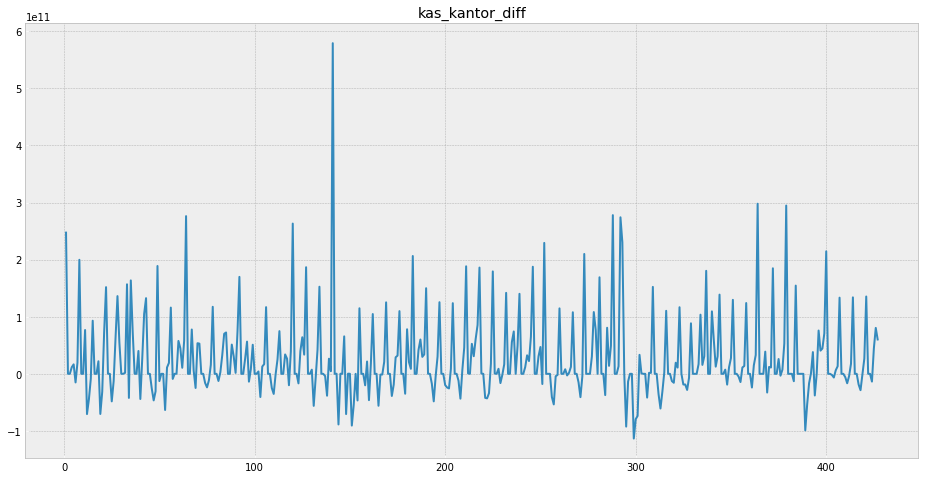

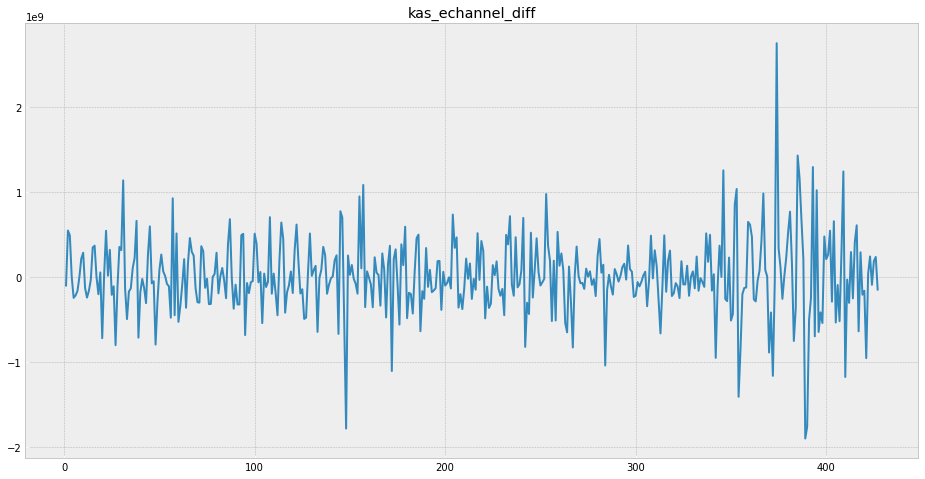

In [ ]:
for col in train_diff_df.columns:
    if col != 'periode':
        plt.figure(figsize=(16, 8))
        plt.plot(train_diff_df[col])
        plt.title(col)
        plt.tick_params(axis='x', color='white')
        plt.tick_params(axis='y', color='white')
        plt.show()

log diff

In [ ]:
from sklearn.preprocessing import MinMaxScaler, QuantileTransformer, RobustScaler, PowerTransformer
scl = MinMaxScaler(feature_range=(0.1, 1))
all_cols = [c for c in train_diff_df.columns if c != 'periode']
scaled_train_diff = scl.fit_transform(train_diff_df[all_cols])

In [ ]:
scaled_train_diff_df = pd.DataFrame()
scaled_train_diff_df['periode'] = train_diff_df['periode']
for i in range(len(all_cols)):
    scaled_train_diff_df[all_cols[i]] = scaled_train_diff[:, i]

scaled_train_diff_df

,periode,cash_in_echannel_diff,cash_out_echannel_diff,cash_in_kantor_diff,cash_out_kantor_diff,cr_ketetapan_total_bkn_sum_diff,giro_diff,deposito_diff,kewajiban_lain_diff,tabungan_diff,rata_dpk_mingguan_diff,kas_kantor_diff,kas_echannel_diff
0,2019-07-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2019-08-01,0.506596,0.685524,0.701901,0.583474,0.1,0.567239,0.552339,0.504579,0.544016,0.473155,0.568743,0.448297
2,2019-08-02,0.573847,0.630139,0.349994,0.622389,0.1,0.579269,0.551028,0.522136,0.543395,0.473155,0.247437,0.573508
3,2019-08-03,0.466734,0.627301,0.576823,0.510105,0.1,0.578071,0.551001,0.531292,0.544127,0.473155,0.247295,0.562114
4,2019-08-04,0.484971,0.510547,0.649608,0.356926,0.1,0.586879,0.550957,0.533356,0.544165,0.473155,0.262296,0.467078
...,...,...,...,...,...,...,...,...,...,...,...,...,...
423,2020-09-26,0.485866,0.656285,0.577733,0.508127,0.1,0.579124,0.551001,0.526994,0.544345,0.473155,0.247295,0.514490
424,2020-09-27,0.515263,0.502404,0.624761,0.372505,0.1,0.592929,0.550919,0.527929,0.544976,0.473155,0.229577,0.449929
425,2020-09-28,0.539728,0.598750,0.622652,0.501656,0.1,0.665799,0.550686,0.567736,0.545127,0.473155,0.305008,0.503829
426,2020-09-29,0.547276,0.539775,0.598407,0.521295,0.1,0.498003,0.547023,0.502603,0.544628,0.473155,0.351841,0.513398


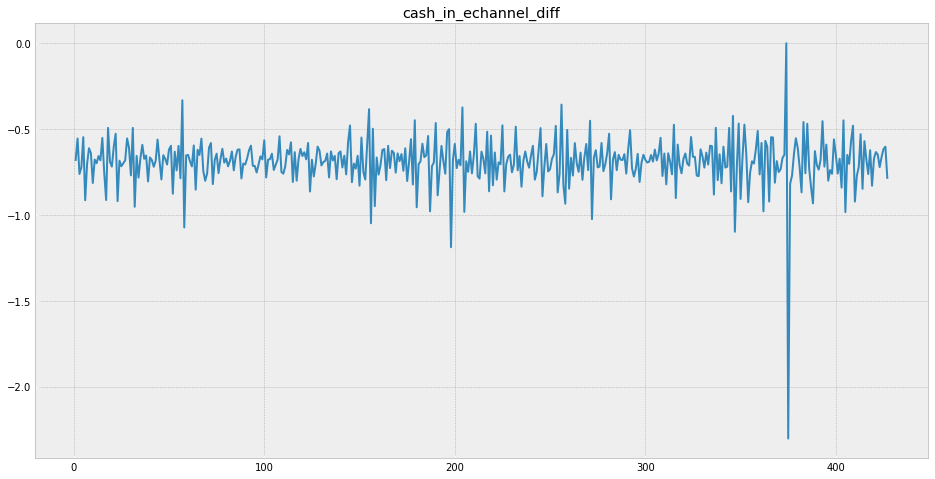

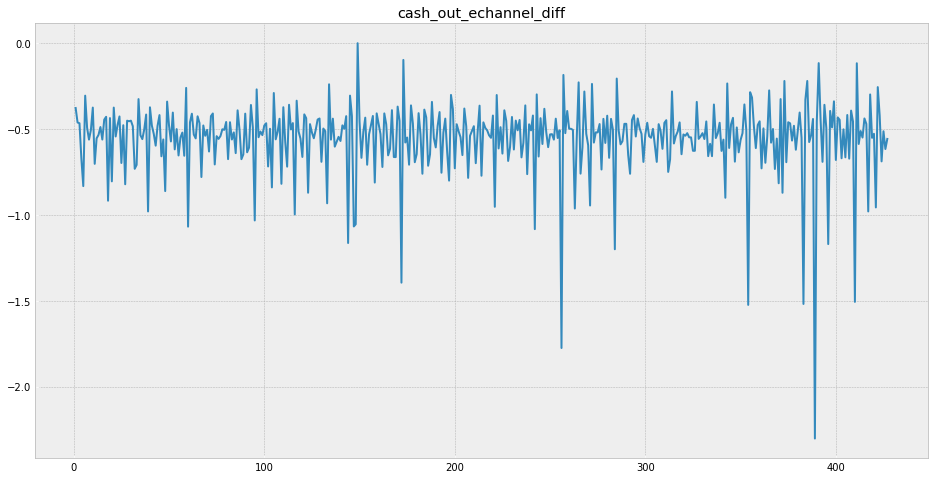

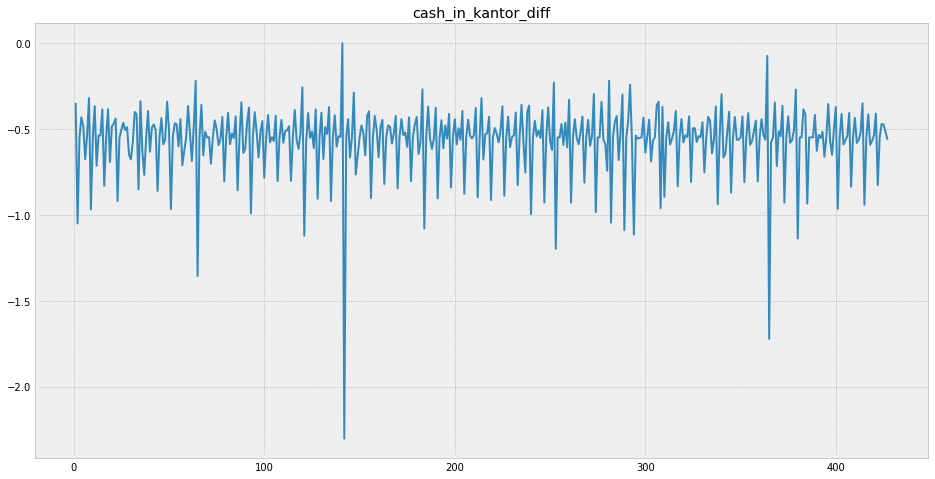

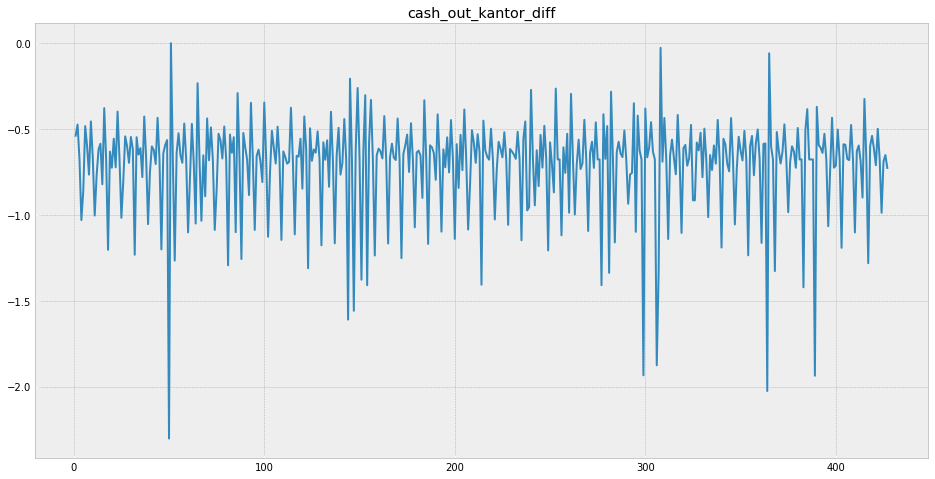

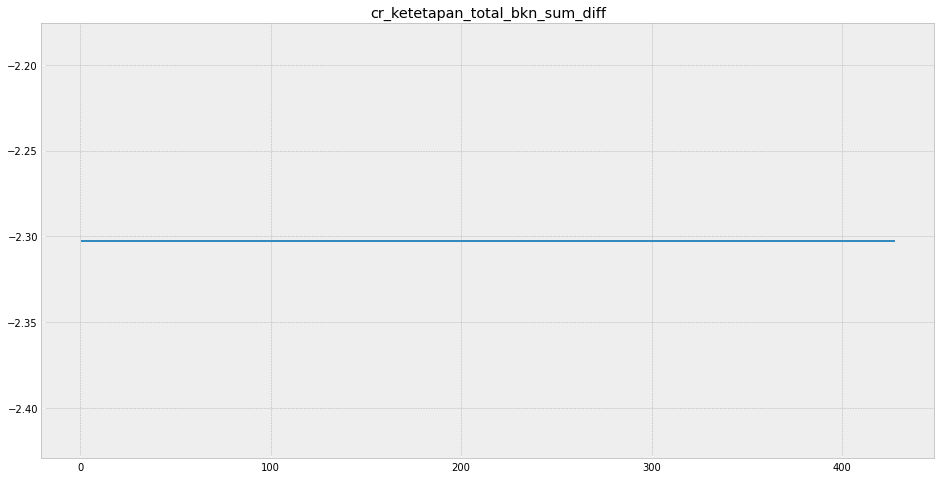

...

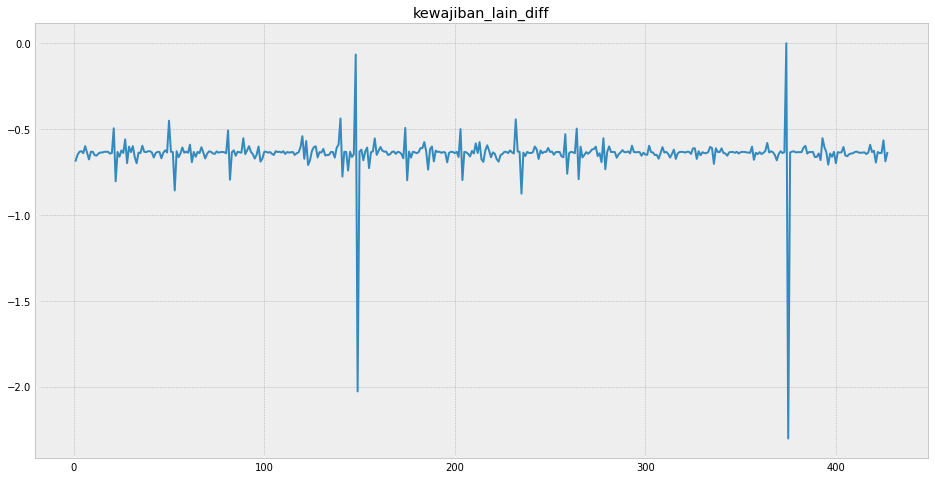

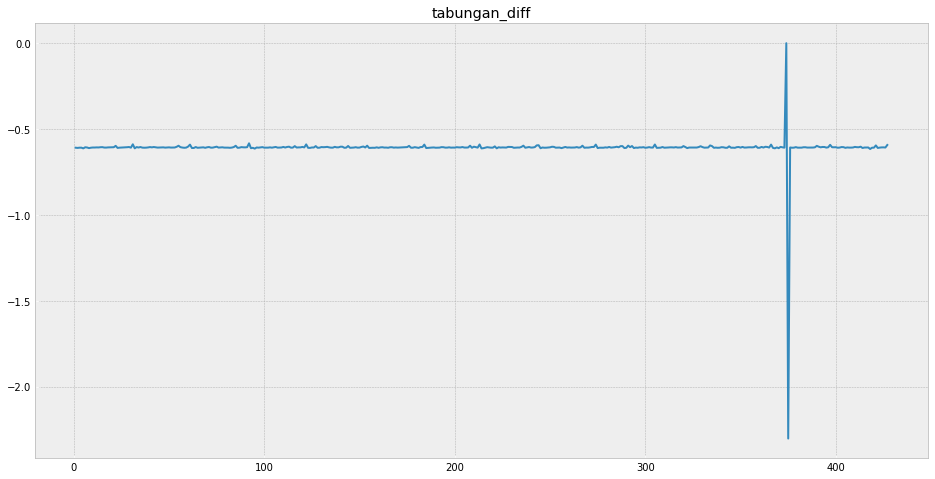

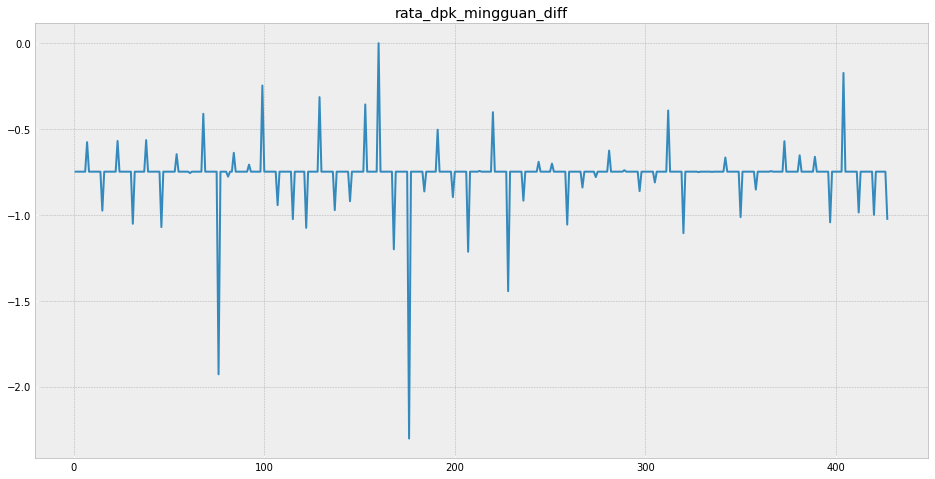

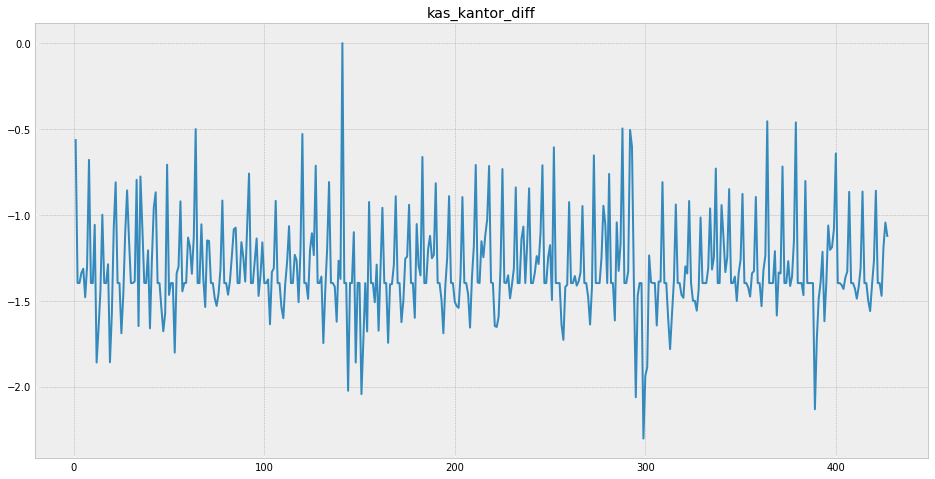

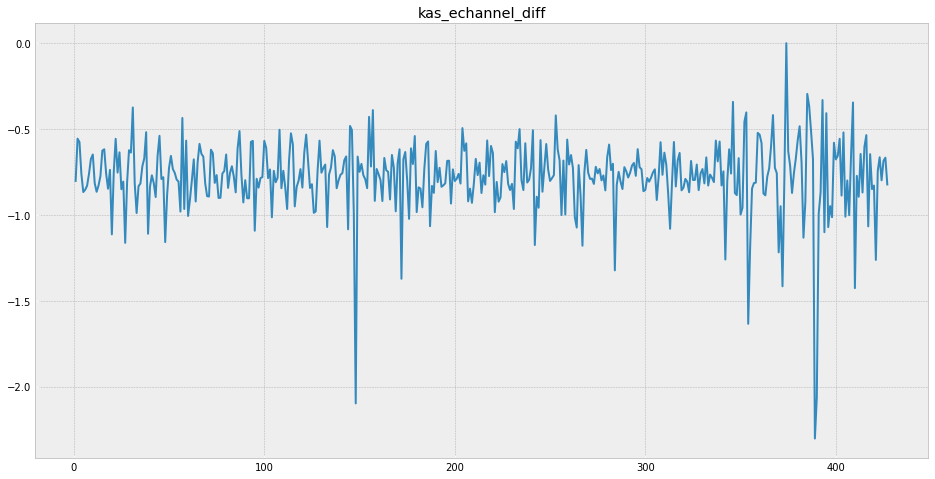

In [ ]:
for col in scaled_train_diff_df.columns:
    if col != 'periode':
        plt.figure(figsize=(16, 8))
        plt.plot(np.log(scaled_train_diff_df[col]))
        # plt.plot(scaled_train_df[col])
        plt.title(col)
        plt.tick_params(axis='x', color='white')
        plt.tick_params(axis='y', color='white')
        plt.show()

diff log

In [ ]:
t = 1
scaled_train_diff_df = pd.DataFrame()
for col in train_df:
    if col != 'periode':
        scaled_train_diff_df[col+'_diff'] = np.log(scaled_train_df[col]) - np.log(scaled_train_df[col].shift(t))
scaled_train_diff_df['periode'] = train_df['periode']

In [ ]:
from sklearn.preprocessing import MinMaxScaler, QuantileTransformer, RobustScaler, PowerTransformer
scl = MinMaxScaler(feature_range=(0.1, 1))
all_cols = [c for c in scaled_train_diff_df.columns if c != 'periode']
norm_train = scl.fit_transform(scaled_train_diff_df[all_cols])

norm_train_df = pd.DataFrame()
norm_train_df['periode'] = scaled_train_diff_df['periode']
for i in range(len(all_cols)):
    norm_train_df[all_cols[i]] = norm_train[:, i]

norm_train_df

,periode,cash_in_echannel_diff,cash_out_echannel_diff,cash_in_kantor_diff,cash_out_kantor_diff,cr_ketetapan_total_bkn_sum_diff,giro_diff,deposito_diff,kewajiban_lain_diff,tabungan_diff,rata_dpk_mingguan_diff,kas_kantor_diff,kas_echannel_diff
0,2019-07-31,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2019-08-01,0.466142,0.588446,0.754966,0.519208,0.1,0.591742,0.557760,0.428380,0.531425,0.480530,1.000000,0.405018
2,2019-08-02,0.583378,0.552355,0.247736,0.529530,0.1,0.619654,0.553178,0.471987,0.529263,0.480530,0.263518,0.544284
3,2019-08-03,0.401187,0.549261,0.619117,0.483097,0.1,0.616774,0.553083,0.501306,0.531600,0.480530,0.263221,0.510990
4,2019-08-04,0.425479,0.495859,0.817428,0.418012,0.1,0.637116,0.552930,0.507473,0.531662,0.480530,0.294592,0.428114
...,...,...,...,...,...,...,...,...,...,...,...,...,...
423,2020-09-26,0.414668,0.560667,0.622978,0.482354,0.1,0.620037,0.553082,0.487764,0.532711,0.480530,0.263221,0.455514
424,2020-09-27,0.488718,0.494783,0.767074,0.425465,0.1,0.659497,0.552787,0.490523,0.534611,0.480530,0.258712,0.418555
425,2020-09-28,0.540962,0.536643,0.707166,0.479286,0.1,0.788286,0.551949,0.592000,0.535069,0.480530,0.277890,0.448741
426,2020-09-29,0.540754,0.508833,0.653245,0.488560,0.1,0.465038,0.538242,0.431119,0.533528,0.480530,0.289662,0.452810


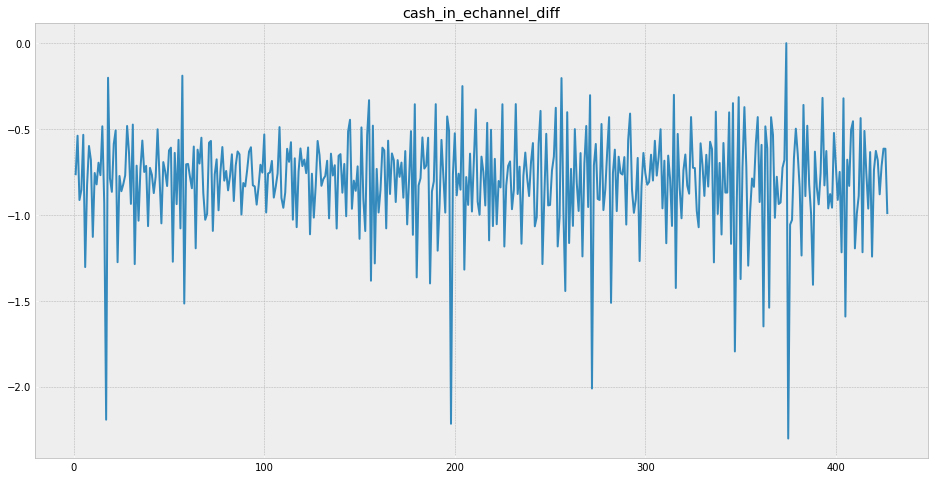

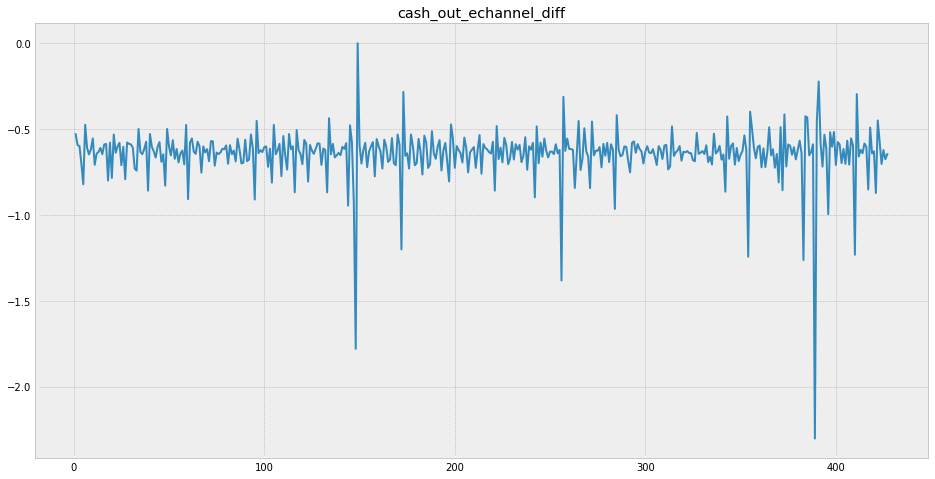

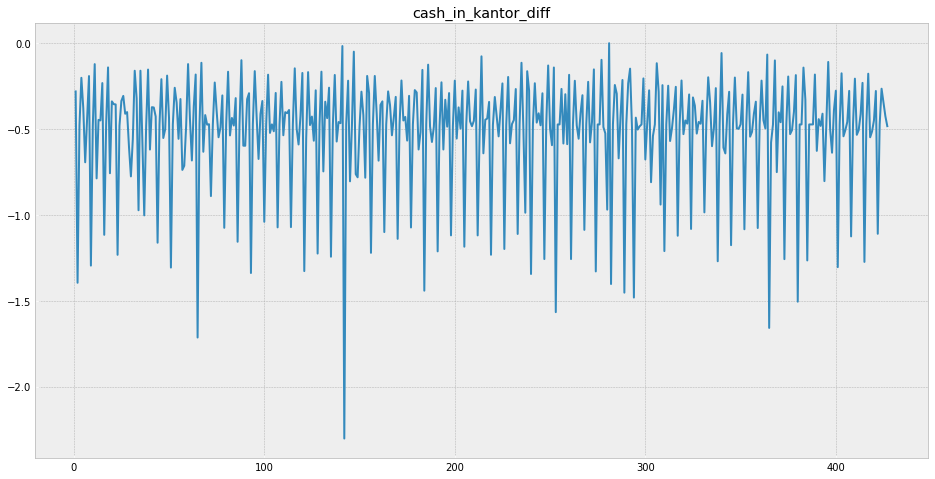

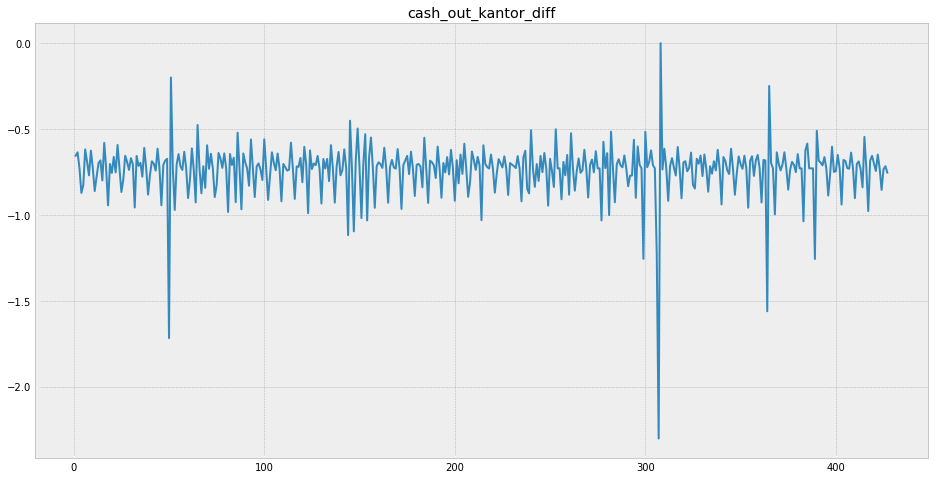

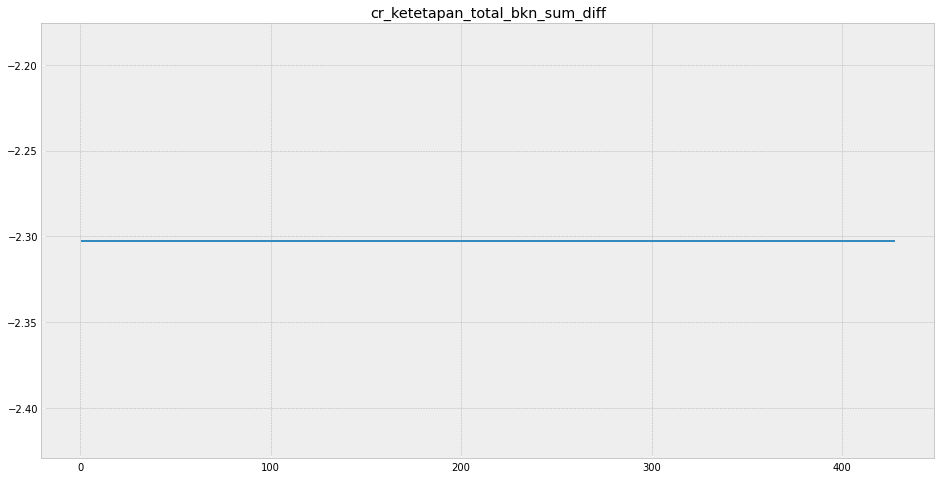

...

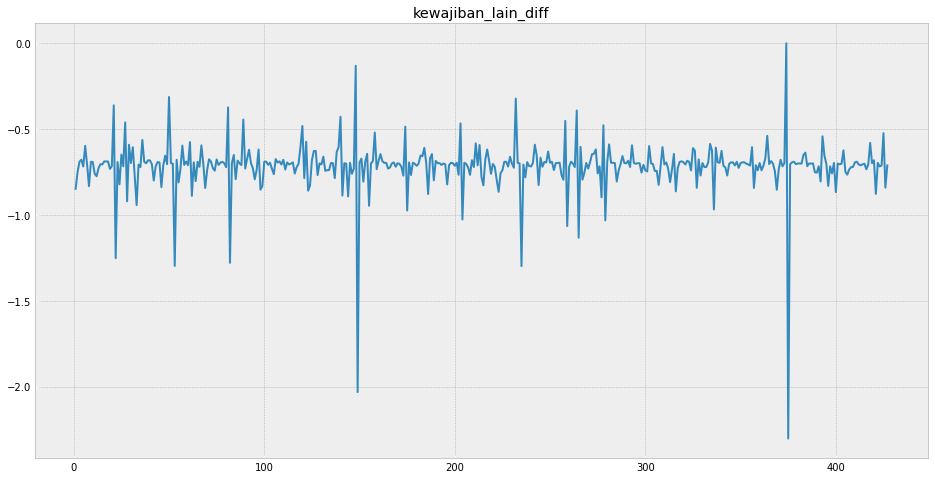

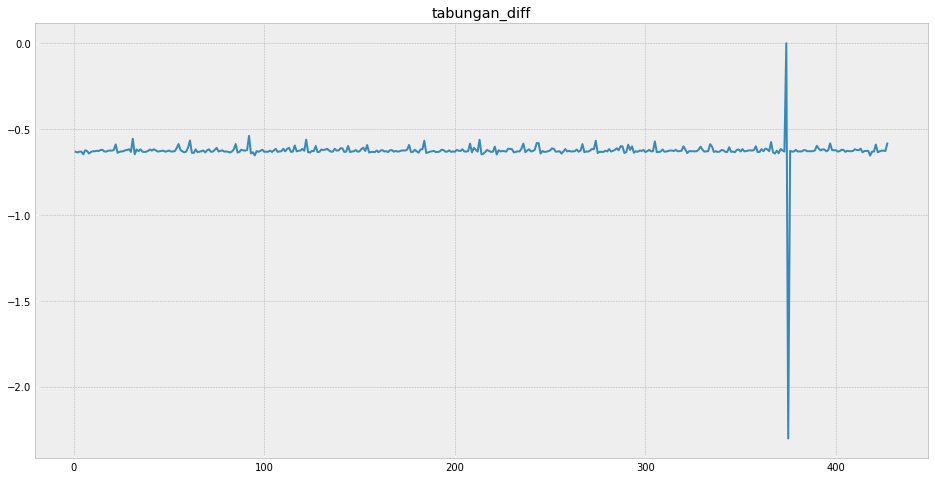

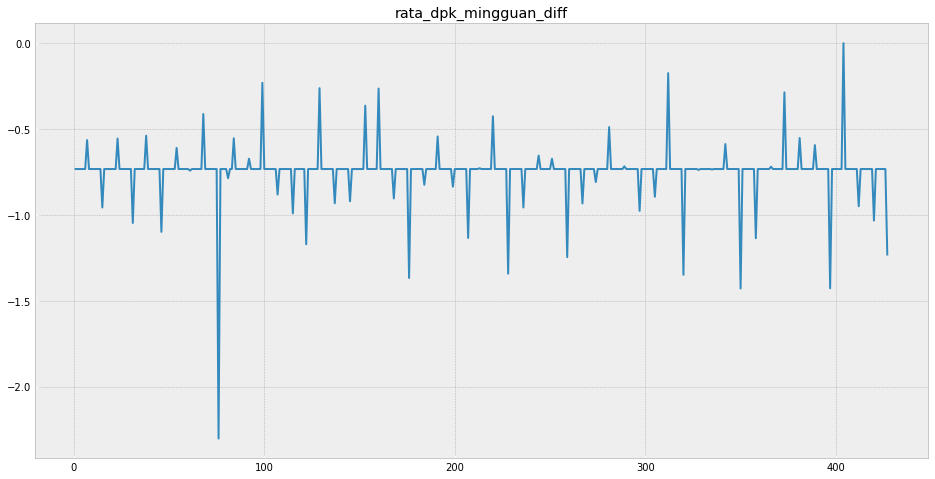

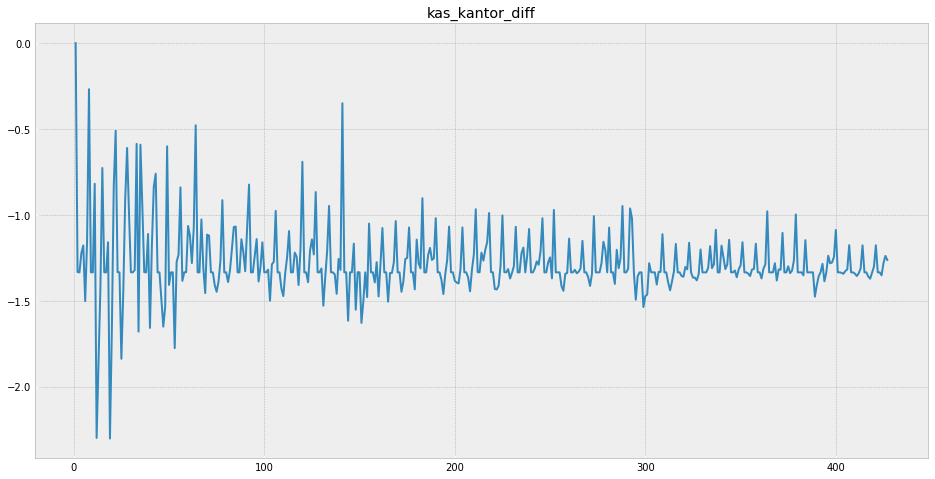

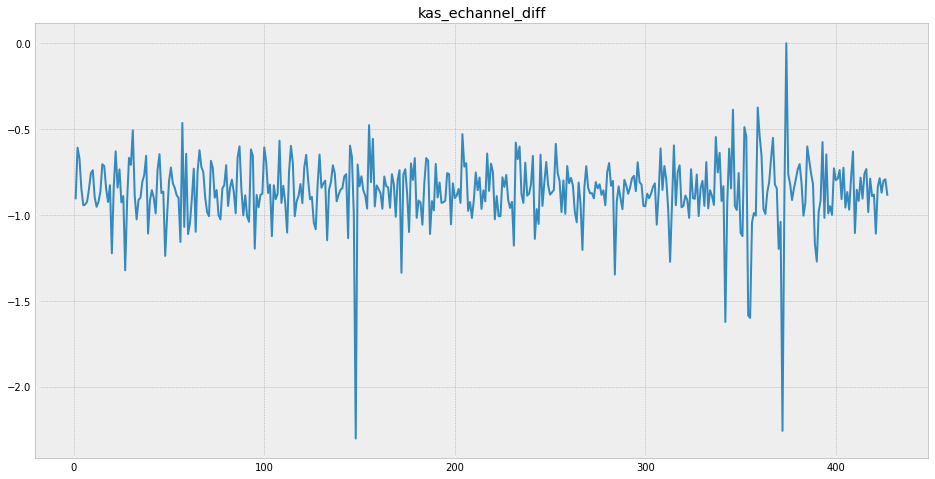

In [ ]:
for col in scaled_train_diff_df.columns:
    if col != 'periode':
        plt.figure(figsize=(16, 8))
        plt.plot(np.log(norm_train_df[col]))
        plt.title(col)
        plt.tick_params(axis='x', color='white')
        plt.tick_params(axis='y', color='white')
        plt.show()

divide by index

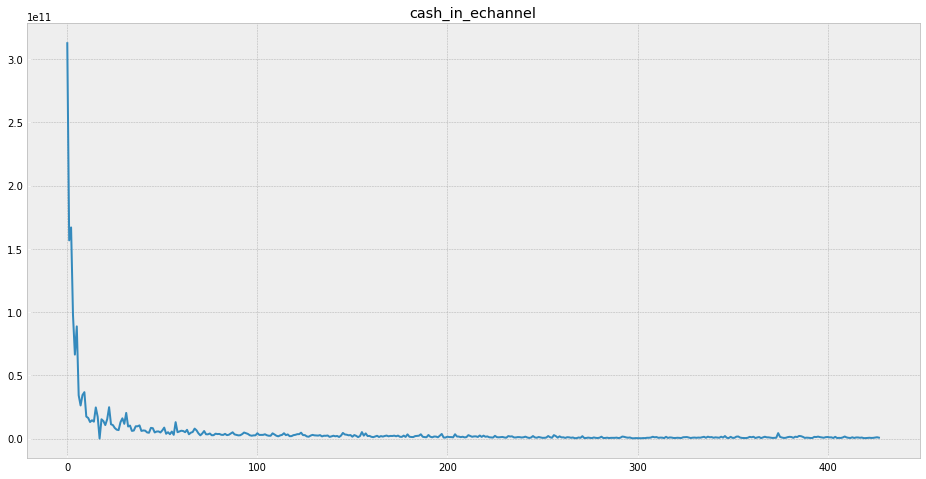

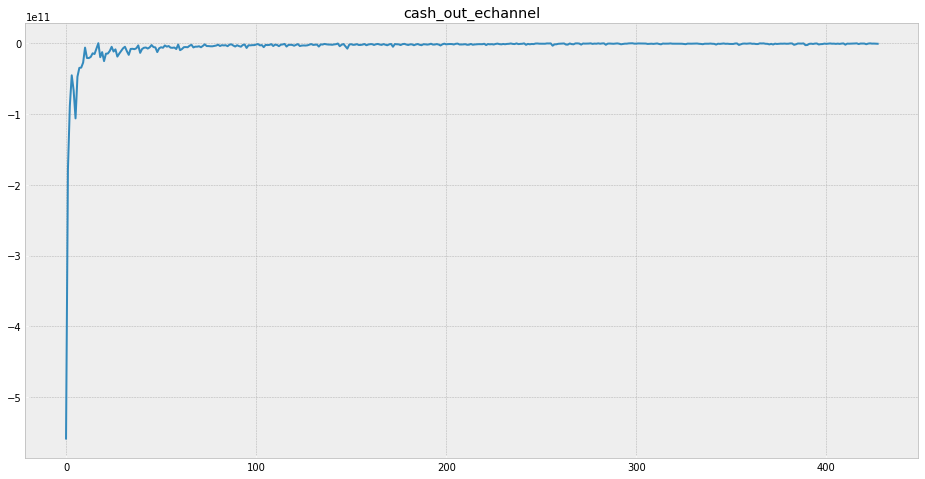

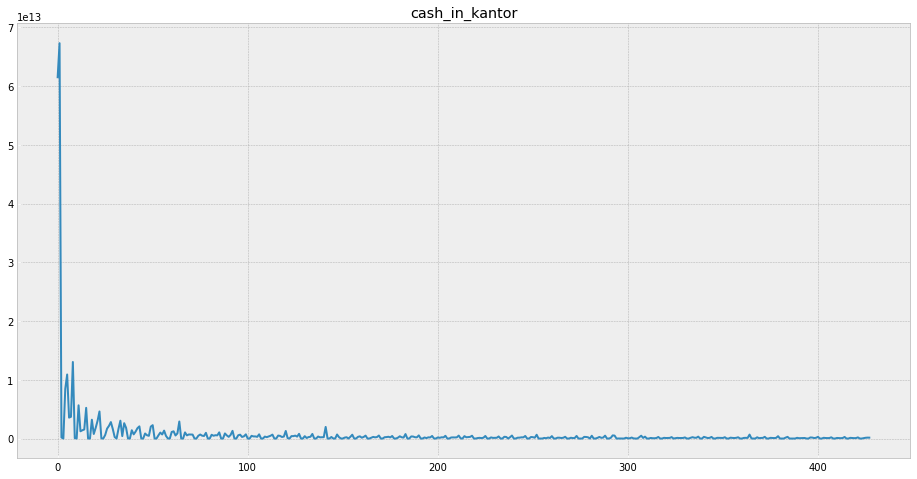

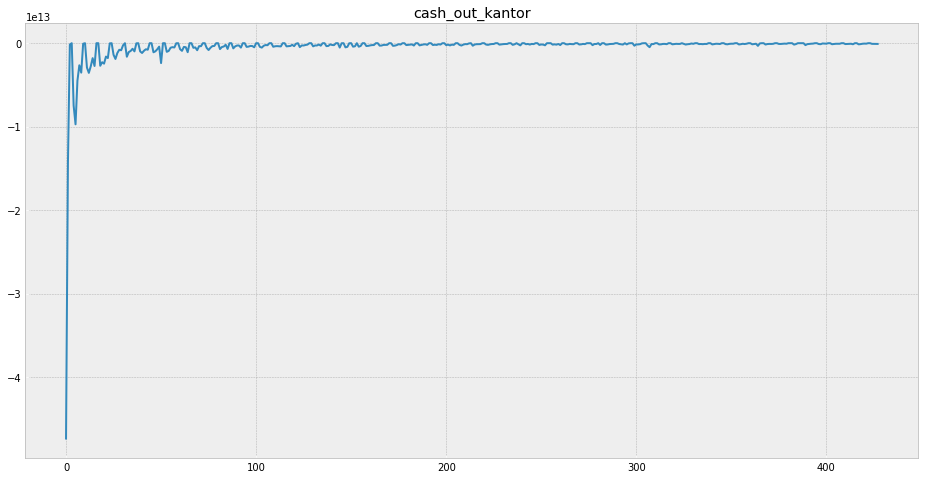

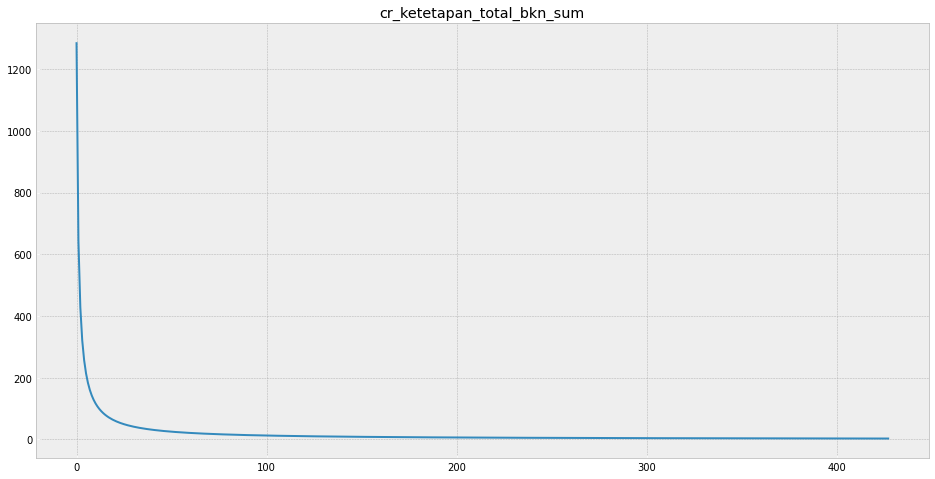

...

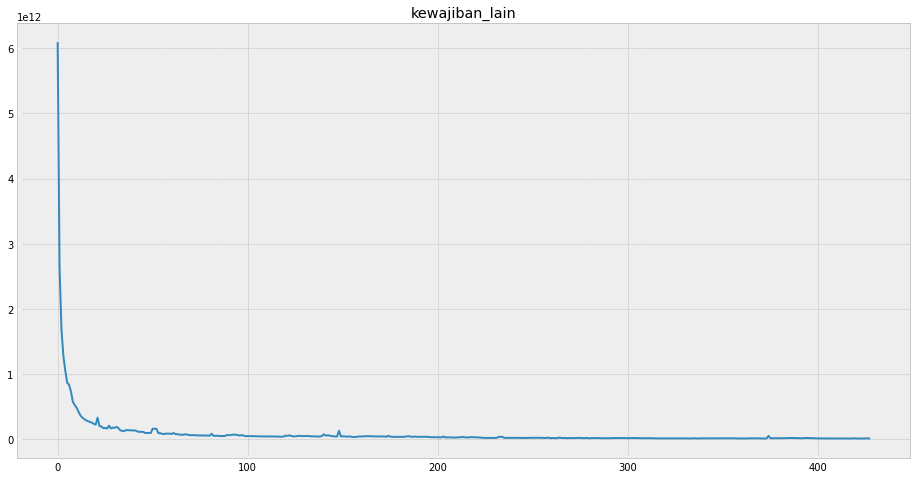

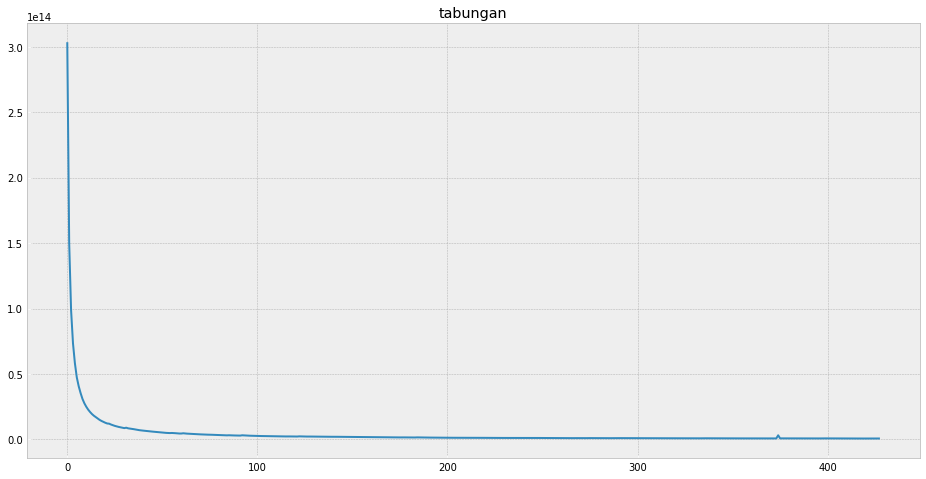

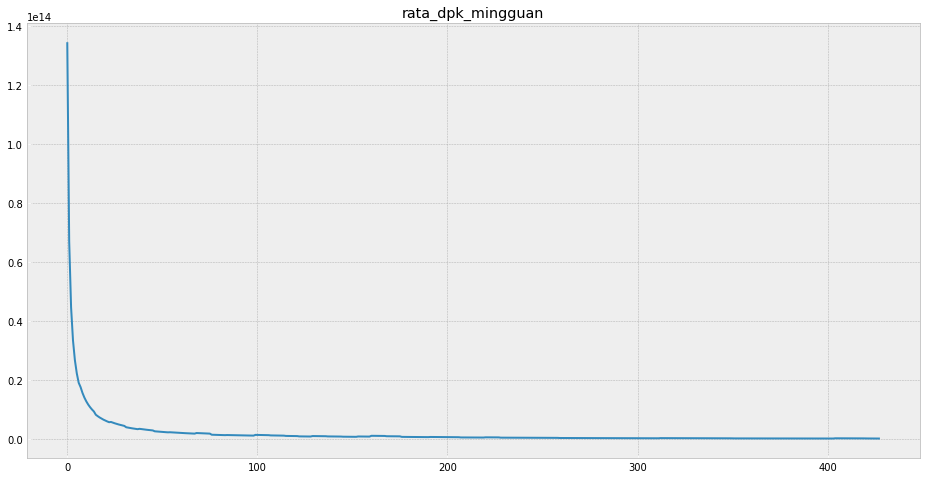

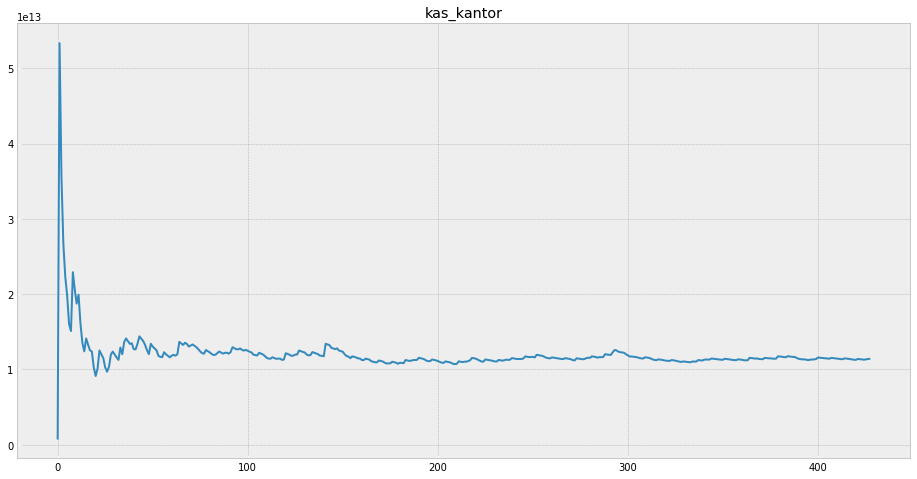

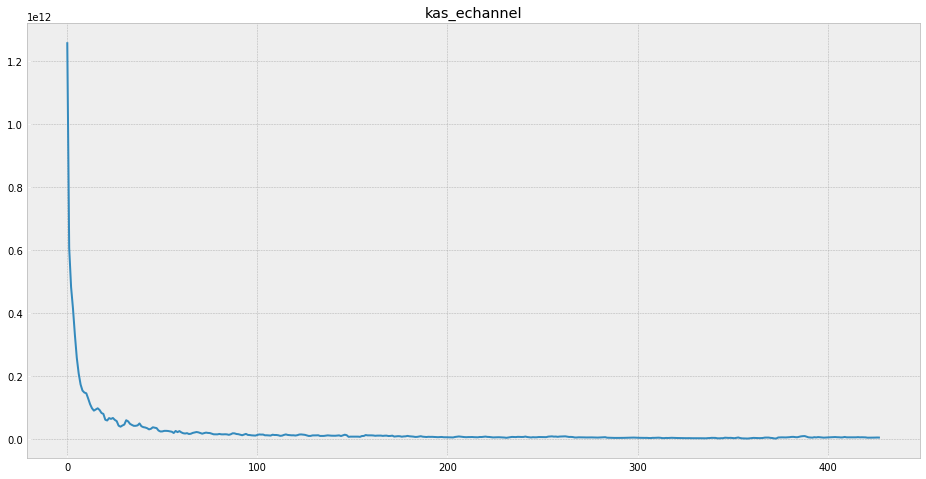

In [ ]:
for col in train_df.columns:
    if col != 'periode':
        plt.figure(figsize=(16, 8))
        plt.plot(train_df[col] / ((train_df.index+1) / (train_df.index[-1]+1)))
        plt.title(col)
        plt.tick_params(axis='x', color='white')
        plt.tick_params(axis='y', color='white')
        plt.show()

accumulated

In [ ]:
# kas_echannel
acc_train_df = pd.DataFrame()
acc_col = 'kas_echannel'
acc_len = len(train_df[acc_col])
acc_kas_echannel = np.zeros(acc_len)
for i in range(acc_len):
    acc_kas_echannel[i] = np.sum(train_df[acc_col].values[:i+1])

acc_train_df[acc_col+'_acc'] = acc_kas_echannel
acc_train_df['index'] = acc_train_df.index

In [ ]:
acc_train_df.iloc[300:].corr()

,kas_echannel_acc,index
kas_echannel_acc,1.00000,0.98452
index,0.98452,1.00000


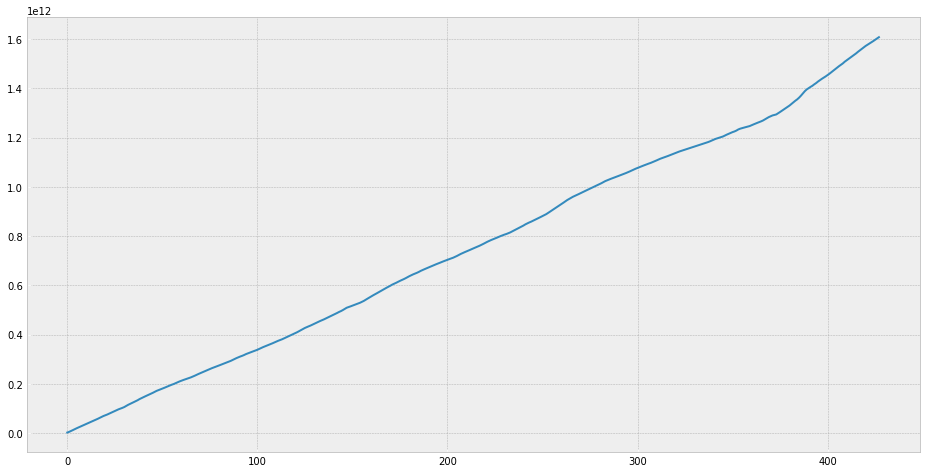

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(acc_kas_echannel)
plt.tick_params(axis='x', color='white')
plt.tick_params(axis='y', color='white')
plt.show()

every nth days

----------------------------------------------------------------------------------------------------
0
----------------------------------------------------------------------------------------------------


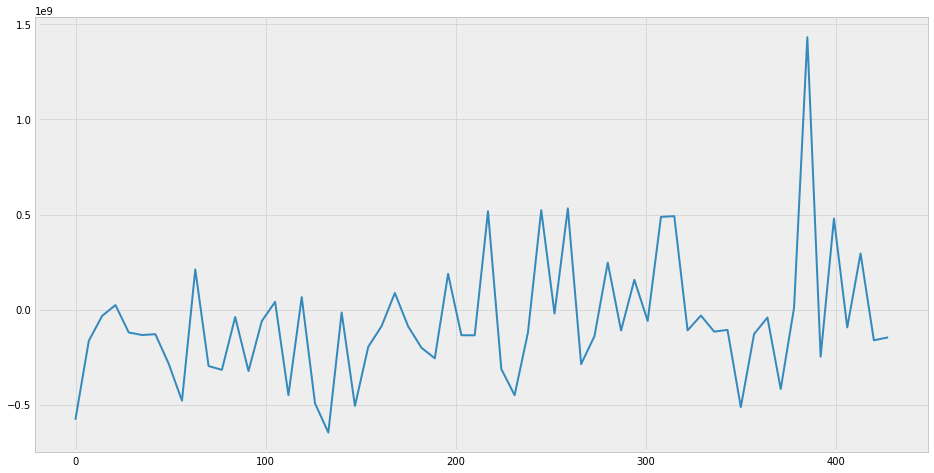

----------------------------------------------------------------------------------------------------
1
----------------------------------------------------------------------------------------------------


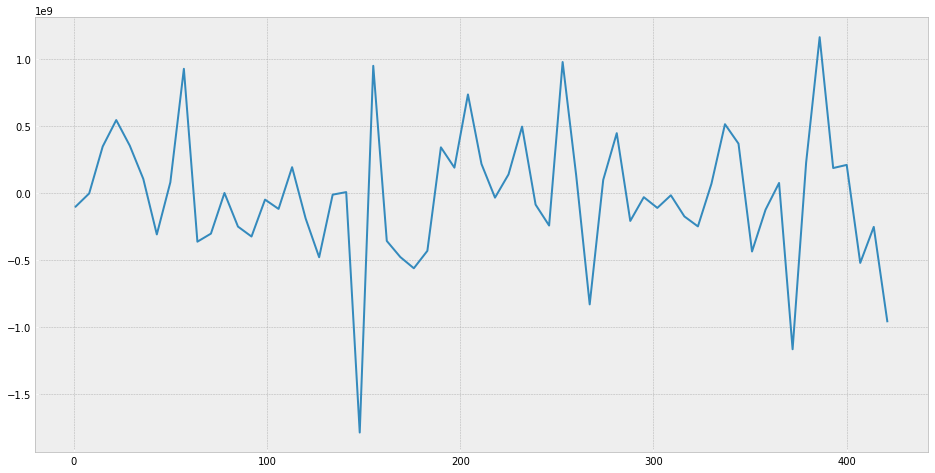

----------------------------------------------------------------------------------------------------
2
----------------------------------------------------------------------------------------------------


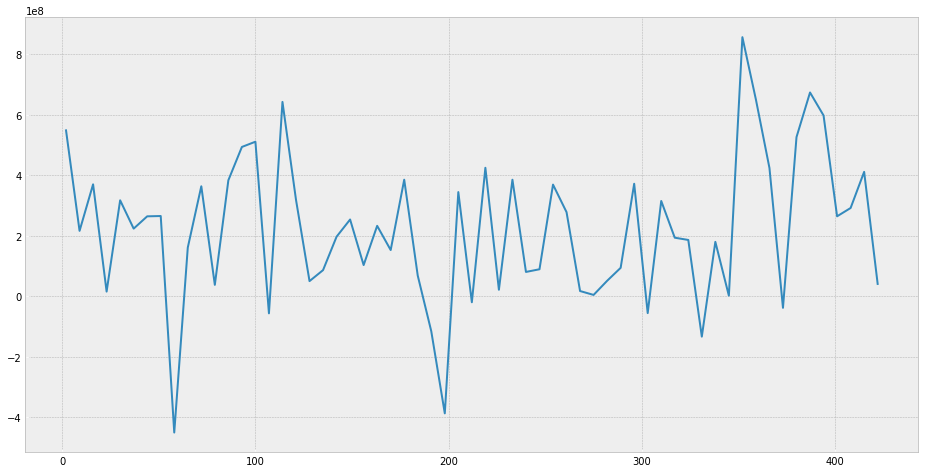

----------------------------------------------------------------------------------------------------
3
----------------------------------------------------------------------------------------------------


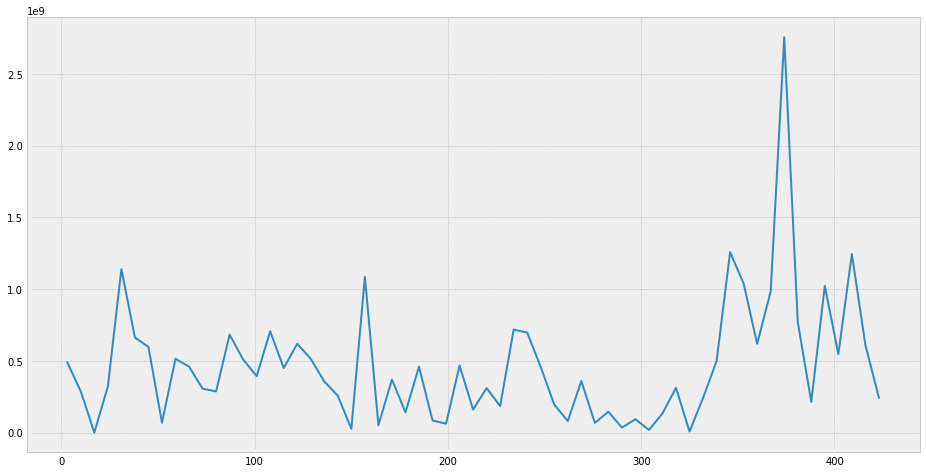

----------------------------------------------------------------------------------------------------
4
----------------------------------------------------------------------------------------------------


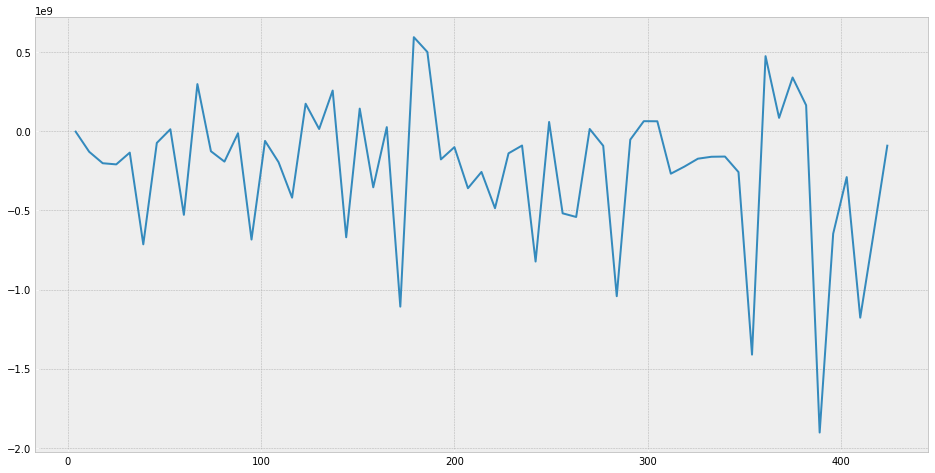

----------------------------------------------------------------------------------------------------
5
----------------------------------------------------------------------------------------------------


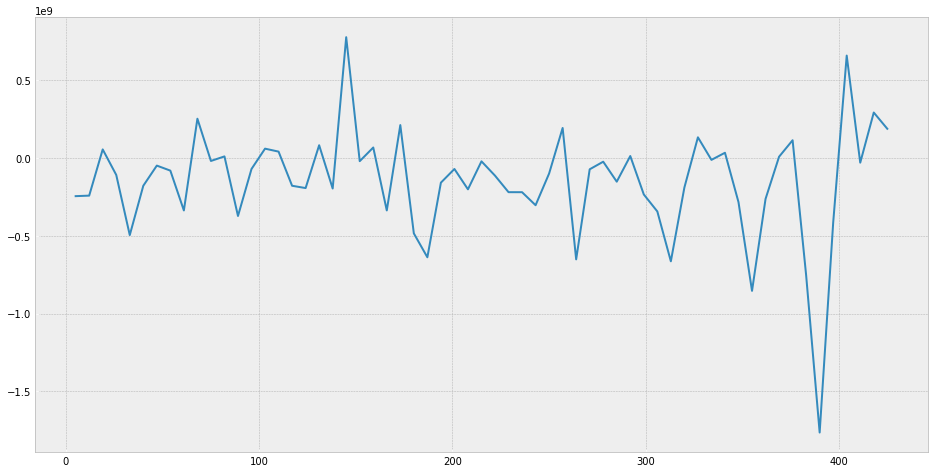

----------------------------------------------------------------------------------------------------
6
----------------------------------------------------------------------------------------------------


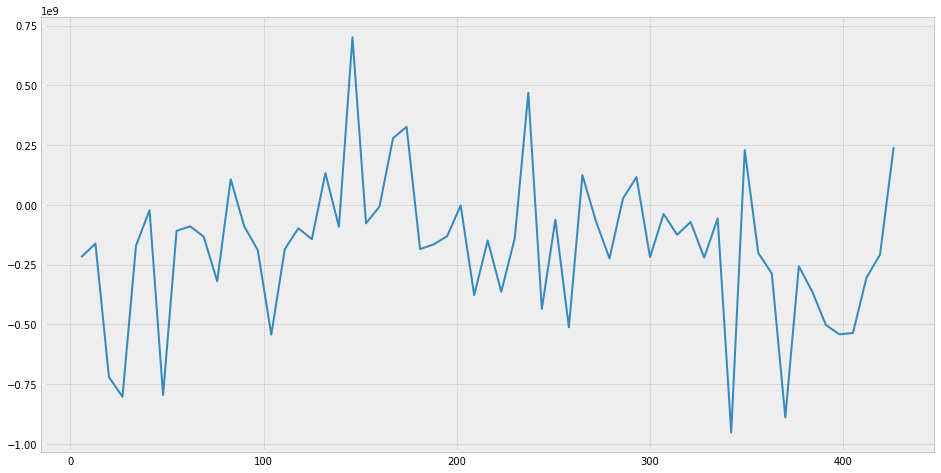

In [ ]:
nth = 7
for i in range(nth):
    print('-'*100)
    print(i)
    print('-'*100)
    plt.figure(figsize=(16, 8))
    plt.plot(train_df['cash_in_echannel'].iloc[i::nth] + train_df['cash_out_echannel'].iloc[i::nth])
    plt.tick_params(axis='x', color='white')
    plt.tick_params(axis='y', color='white')
    plt.show()

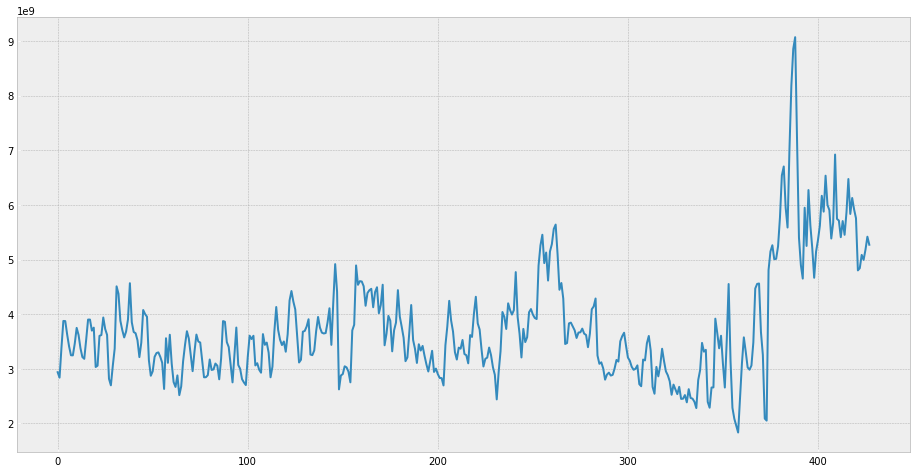

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(train_df['kas_echannel'])
plt.tick_params(axis='x', color='white')
plt.tick_params(axis='y', color='white')
plt.show()

### Data Preparation

#### Feature Selection

In [ ]:
features = ['kas_kantor_diff', 'kas_echannel_diff']

In [ ]:
feat_diff_df = train_diff_df[1:].reset_index()

In [ ]:
feat_data = feat_diff_df[features].values

#### Normalize Data

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler, MaxAbsScaler

In [ ]:
N = len(feat_data)
# train_size = 0.75
# train_idx = int(N * 0.75 // 1)
train_idx = N - 31

scl = MinMaxScaler()
scl.fit(feat_data[:train_idx])
feat_data = scl.transform(feat_data)

#### Generate data

In [ ]:
T = 7

X = []
y = []

for i in range(T, N):
    X.append(feat_data[i-T:i])
    y.append(feat_data[i])

X = np.array(X)
y = np.array(y)

In [ ]:
print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

X shape: (420, 7, 2)
y shape: (420, 2)


#### Train Test Split

In [ ]:
X_train = X[:train_idx]
X_val = X[train_idx:]
y_train = y[:train_idx]
y_val = y[train_idx:]

print(f'X train shape: {X_train.shape}')
print(f'y train shape: {y_train.shape}')
print(f'X val shape: {X_val.shape}')
print(f'y val shape: {y_val.shape}')

X train shape: (396, 7, 2)
y train shape: (396, 2)
X val shape: (24, 7, 2)
y val shape: (24, 2)


In [ ]:
from sklearn.metrics import make_scorer
def rmsle(real, predicted):
    sum=0.0
    for x in range(len(predicted)):
        if predicted[x]<0 or real[x]<0: #check for negative values
            continue
        p = np.log(predicted[x]+1)
        r = np.log(real[x]+1)
        sum = sum + (p - r)**2
    return (sum/len(predicted))**0.5
rmsle_scorer = make_scorer(rmsle, greater_is_better=False)

### Model Diff

#### Train

In [ ]:
import tensorflow as tf

In [ ]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import LSTM, GRU, SimpleRNN, Dense, Input, Bidirectional
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.losses import Loss
from keras import backend as K

In [ ]:
def root_mean_squared_log_error(predicted, real):
    def log10(x):
        numerator = tf.log(x)
        denominator = tf.log(tf.constant(10, dtype=numerator.dtype))
        return numerator / denominator
    return K.sqrt(K.mean(K.square(tf.experimental.numpy.log10(predicted+1) - tf.experimental.numpy.log10(real+1))))

In [ ]:
i = Input(shape=X_train.shape[1:])
x = Bidirectional(LSTM(25, activation='relu'))(i)
# x = LSTM(25, activation='relu')(x)
x = Dense(2)(x)

In [ ]:
model = Model(i, x)
model.summary()

Model: "model_10"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_11 (InputLayer)        [(None, 7, 2)]            0         
_________________________________________________________________
bidirectional_14 (Bidirectio (None, 50)                5600      
_________________________________________________________________
dense_32 (Dense)             (None, 2)                 102       
Total params: 5,702
Trainable params: 5,702
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.compile(
    optimizer=Adam(lr=0.001),
    loss=root_mean_squared_log_error
)

In [ ]:
r = model.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=25)

Epoch 1/25
13/13 [==============================] - 3s 40ms/step - loss: 0.1292 - val_loss: 0.1002
Epoch 2/25
13/13 [==============================] - 0s 10ms/step - loss: 0.0940 - val_loss: 0.0665
Epoch 3/25
13/13 [==============================] - 0s 9ms/step - loss: 0.0618 - val_loss: 0.0342
Epoch 4/25
13/13 [==============================] - 0s 9ms/step - loss: 0.0333 - val_loss: 0.0328
Epoch 5/25
13/13 [==============================] - 0s 10ms/step - loss: 0.0350 - val_loss: 0.0300
Epoch 6/25
13/13 [==============================] - 0s 10ms/step - loss: 0.0337 - val_loss: 0.0300
Epoch 7/25
13/13 [==============================] - 0s 10ms/step - loss: 0.0341 - val_loss: 0.0301
Epoch 8/25
13/13 [==============================] - 0s 10ms/step - loss: 0.0311 - val_loss: 0.0300
Epoch 9/25
13/13 [==============================] - 0s 10ms/step - loss: 0.0332 - val_loss: 0.0299
Epoch 10/25
13/13 [==============================] - 0s 9ms/step - loss: 0.0303 - val_loss: 0.0300
Epoch 11/25


#### Evaluation

In [ ]:
msle = tf.keras.losses.MeanSquaredLogarithmicError()

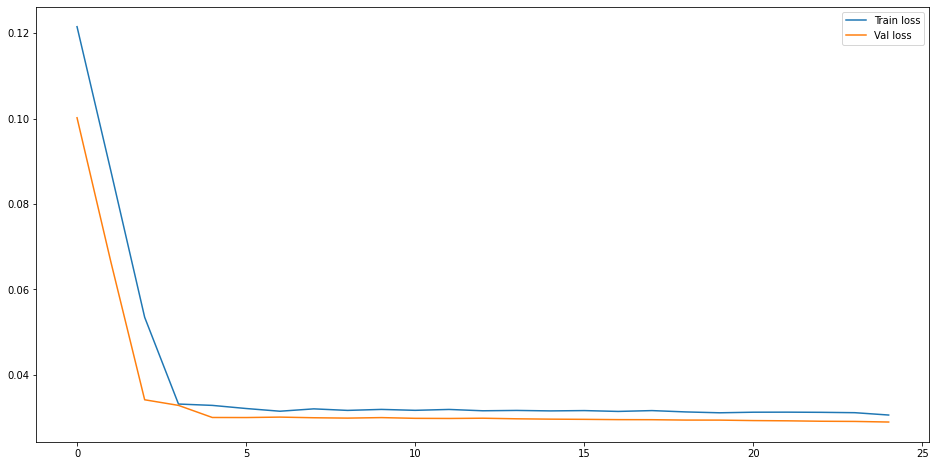

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(r.history['loss'], label='Train loss')
plt.plot(r.history['val_loss'], label='Val loss')
plt.legend()
plt.show()

In [ ]:
t_pred = y_val.shape[0]
y_val_pred = np.zeros(y_val.shape)

X_val_pred = X_val.copy()

for i in range(t_pred):
    y_val_pred[i] = model.predict(X_val_pred[i].reshape(-1, T, 2))
    X_val_pred[0:-1] = X_val_pred[1:]
    X_val_pred[-1] = y_val_pred[i]

In [ ]:
# y_val_pred[y_val_pred<0] = 0
y_val_pred

array([[0.20402858, 0.40645531],
       [0.22013417, 0.41210458],
       [0.19339308, 0.41529202],
       [0.19288772, 0.40029663],
       [0.19163552, 0.38600403],
       [0.20397002, 0.39641201],
       [0.19015265, 0.40975857],
       [0.1958265 , 0.39364055],
       [0.20861077, 0.39441565],
       [0.18823019, 0.41367045],
       [0.17860854, 0.39108816],
       [0.19206613, 0.39239666],
       [0.20382747, 0.40217113],
       [0.20355195, 0.4006834 ],
       [0.19770047, 0.39274001],
       [0.20191142, 0.39817387],
       [0.20234671, 0.40075365],
       [0.19624886, 0.38953188],
       [0.20298141, 0.40102997],
       [0.20008111, 0.39653611],
       [0.20244369, 0.40016043],
       [0.20261165, 0.40045029],
       [0.20234945, 0.40004587],
       [0.20231065, 0.39998451]])

In [ ]:
print(f'RMSLE: {np.sqrt(msle(y_val, y_val_pred).numpy())}')
print(f'RMSLE kas_kantor: {np.sqrt(msle(y_val[:,0], y_val_pred[:,0]).numpy())}')
print(f'RMSLE kas_echannel: {np.sqrt(msle(y_val[:,1], y_val_pred[:,1]).numpy())}')

RMSLE: 0.0707753300138485
RMSLE kas_kantor: 0.05904684516530471
RMSLE kas_echannel: 0.08081933403068142


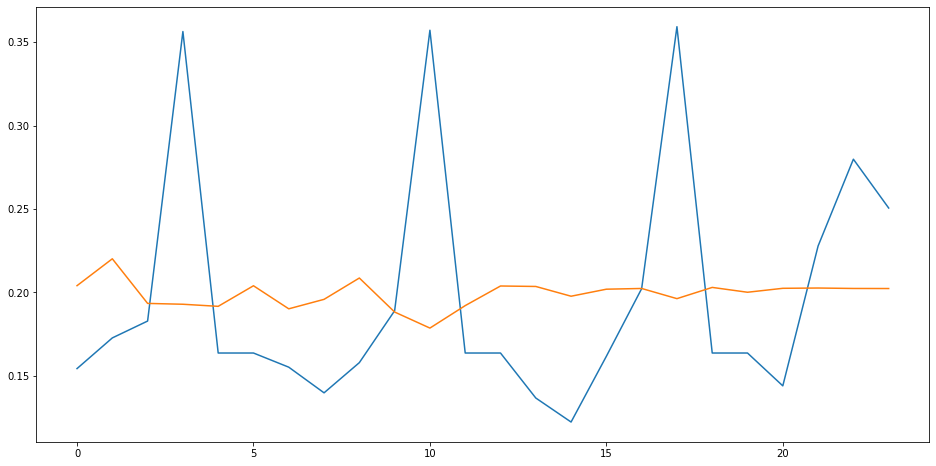

In [ ]:
# kas_kantor
plt.figure(figsize=(16, 8))
plt.plot(y_val[:, 0])
plt.plot(y_val_pred[:, 0])
plt.show()

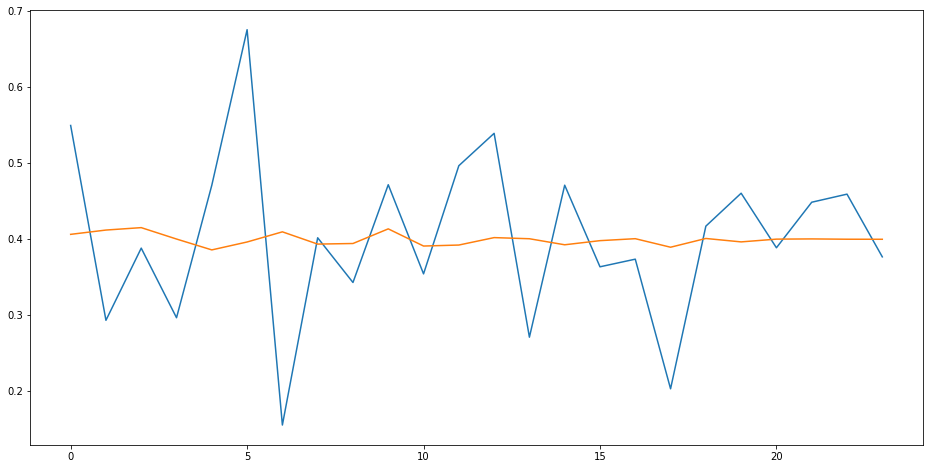

In [ ]:
# kas_echannel
plt.figure(figsize=(16, 8))
plt.plot(y_val[:, 1])
plt.plot(y_val_pred[:, 1])
plt.show()

#### Prediction

### Separated Model

### kas_kantor

2 models for each target

#### kas_kantor simple regression

##### Train

In [ ]:
X = train_df.index.values
y = train_df['kas_kantor'].values

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.35)

X_train = X_train.reshape(-1, 1)
X_val = X_val.reshape(-1, 1)

y_train = y_train.reshape(-1, 1)
y_val = y_val.reshape(-1, 1)

scl_kk = MinMaxScaler(feature_range=(0.1, 1))
y_train = scl_kk.fit_transform(y_train).ravel()
y_val = scl_kk.transform(y_val).ravel()

In [ ]:
# train_size = 0.75
# N = len(X)
# train_idx = int(N * train_size // 1)

# X_train = X[:train_idx].reshape(-1, 1)
# X_val = X[train_idx:].reshape(-1, 1)

# y_train = y[:train_idx].reshape(-1, 1)
# y_val = y[train_idx:].reshape(-1, 1)

# scl_kk = StandardScaler()
# y_train = scl_kk.fit_transform(y_train).ravel()
# y_val = scl_kk.transform(y_val).ravel()

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor

In [ ]:
lr = LinearRegression()
svr = SVR()
rf = RandomForestRegressor()

In [ ]:
lr.fit(X_train, y_train)
svr.fit(X_train, y_train)
rf.fit(X_train, y_train)

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

##### Evaluation

In [ ]:
y_val_lr_pred = lr.predict(X_val)
y_val_svr_pred = svr.predict(X_val)
y_val_rf_pred = rf.predict(X_val)

In [ ]:
print(f'RMSLE lr: {np.sqrt(msle(y_val, y_val_lr_pred).numpy())}')
print(f'RMSLE svr: {np.sqrt(msle(y_val, y_val_svr_pred).numpy())}')
print(f'RMSLE rf: {np.sqrt(msle(y_val, y_val_rf_pred).numpy())}')

RMSLE lr: 0.009126427427174046
RMSLE svr: 0.03286456606529959
RMSLE rf: 0.0031875904578589887


In [ ]:
def plot_result(y_val, y_val_pred, title):
    plt.figure(figsize=(16, 8))
    plt.title(title)
    plt.plot(y_val)
    plt.plot(y_val_pred)
    plt.show()

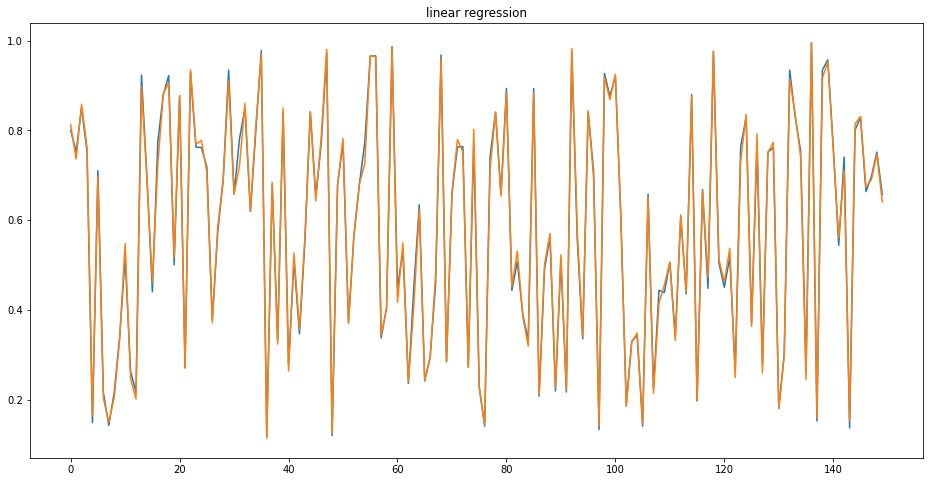

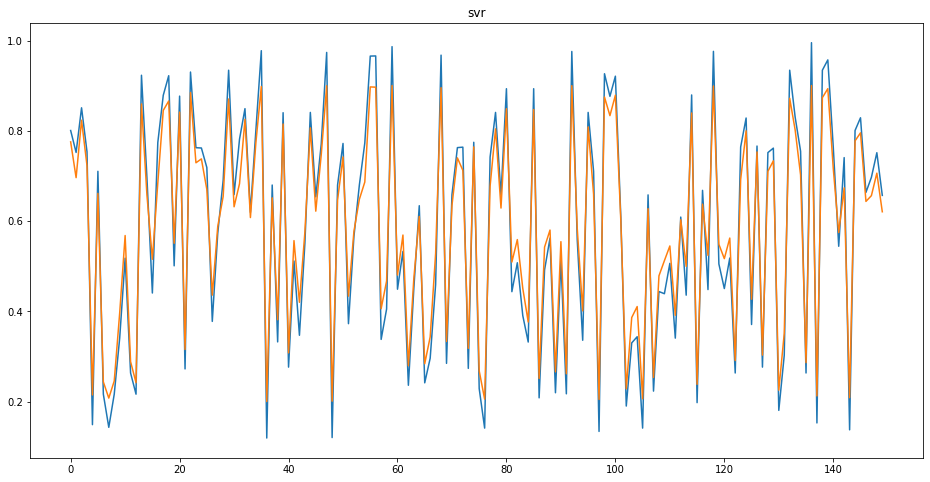

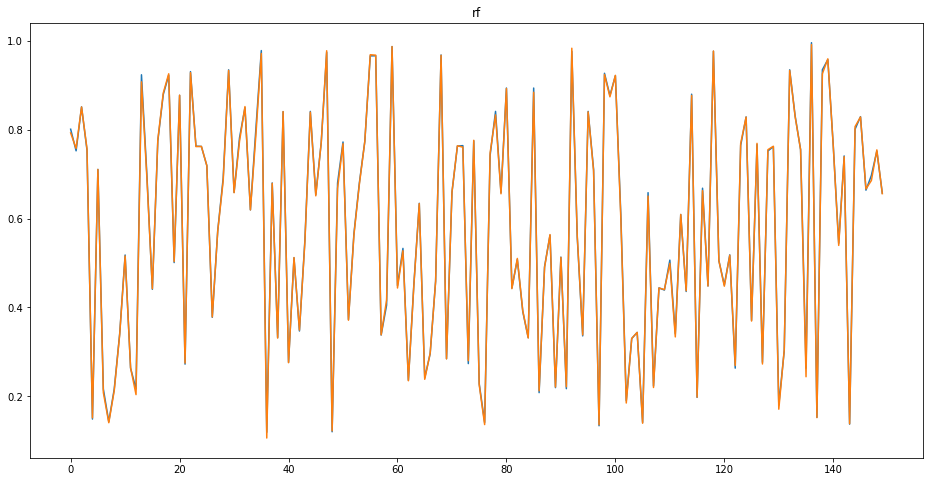

In [ ]:
plot_result(y_val, y_val_lr_pred, 'linear regression')
plot_result(y_val, y_val_svr_pred, 'svr')
plot_result(y_val, y_val_rf_pred, 'rf')

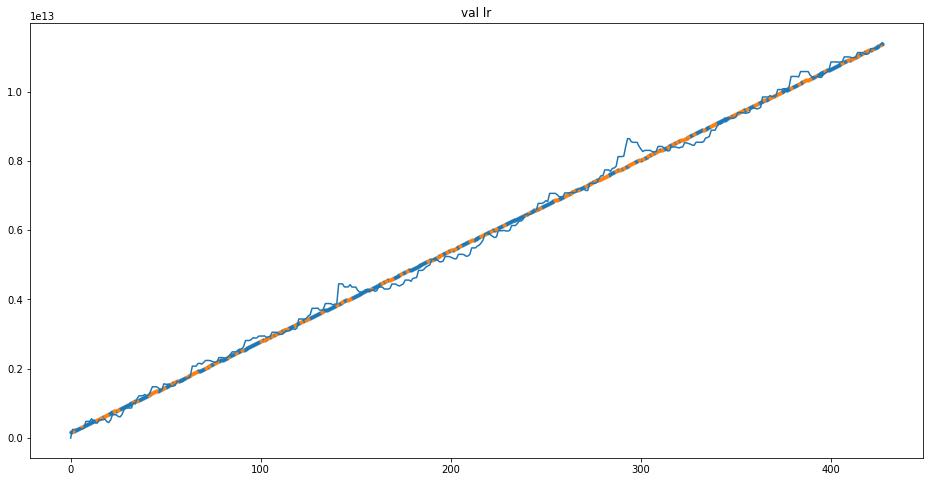

In [ ]:
plt.figure(figsize=(16, 8))
plt.title('val lr')
plt.plot(X, y)
plt.scatter(X_train, scl_kk.inverse_transform(lr.predict(X_train).reshape(-1, 1)), s=10)
plt.scatter(X_val, scl_kk.inverse_transform(y_val_lr_pred.reshape(-1, 1)), s=10)
plt.show()

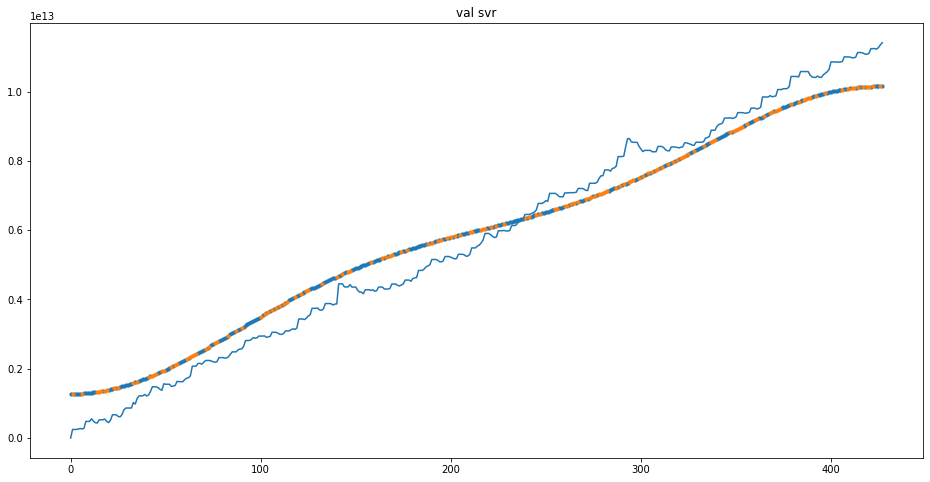

In [ ]:
plt.figure(figsize=(16, 8))
plt.title('val svr')
plt.plot(X, y)
plt.scatter(X_train, scl_kk.inverse_transform(svr.predict(X_train).reshape(-1, 1)), s=10)
plt.scatter(X_val, scl_kk.inverse_transform(y_val_svr_pred.reshape(-1, 1)), s=10)
plt.show()

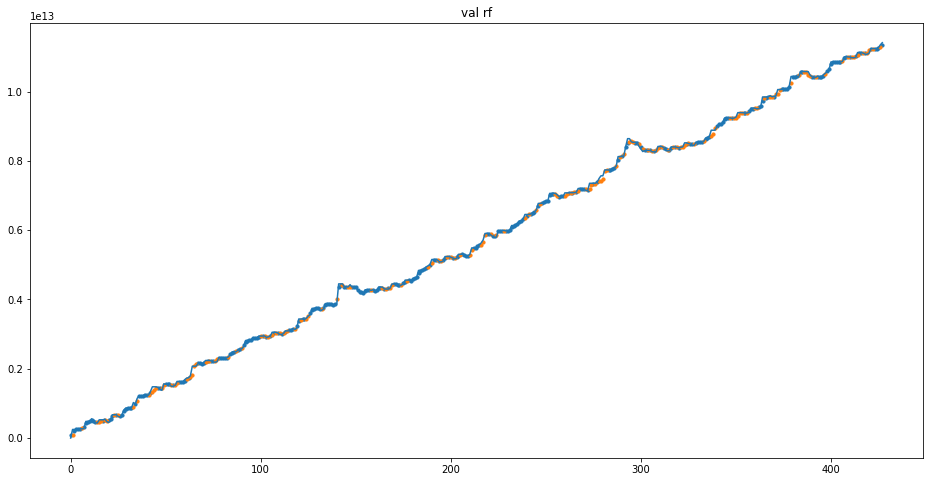

In [ ]:
plt.figure(figsize=(16, 8))
plt.title('val rf')
plt.plot(X, y)
plt.scatter(X_train, scl_kk.inverse_transform(rf.predict(X_train).reshape(-1, 1)), s=10)
plt.scatter(X_val, scl_kk.inverse_transform(y_val_rf_pred.reshape(-1, 1)), s=10)
plt.show()

##### Prediction

In [ ]:
X_pred = np.array([i+X[-1] for i in range(1, 32)]).reshape(-1, 1)
y_lr_pred = scl_kk.inverse_transform(lr.predict(X_pred).reshape(-1, 1))
y_svr_pred = scl_kk.inverse_transform(svr.predict(X_pred).reshape(-1, 1))
y_rf_pred = scl_kk.inverse_transform(rf.predict(X_pred).reshape(-1, 1))

In [ ]:
def plot_prediction(y_pred, title):
    plt.figure(figsize=(16, 8))
    plt.title(title)
    plt.plot(X, y)
    plt.plot(X_pred, y_pred)
    plt.show()

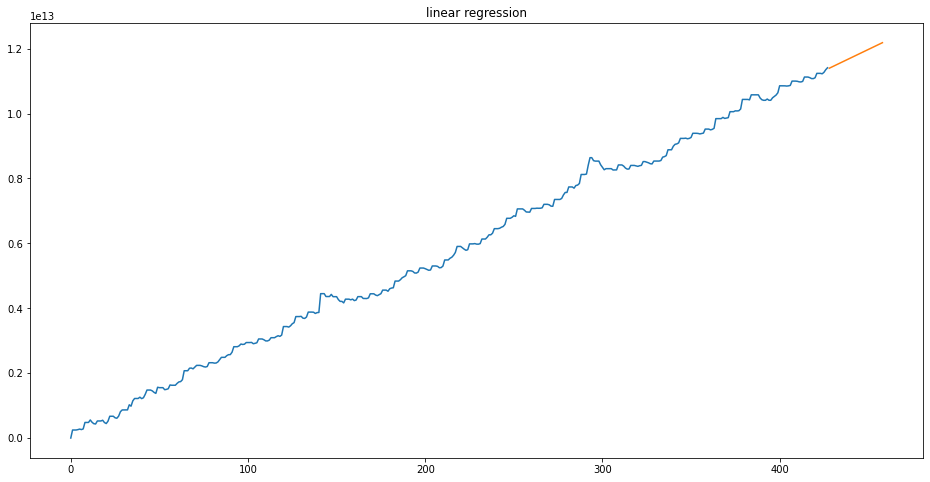

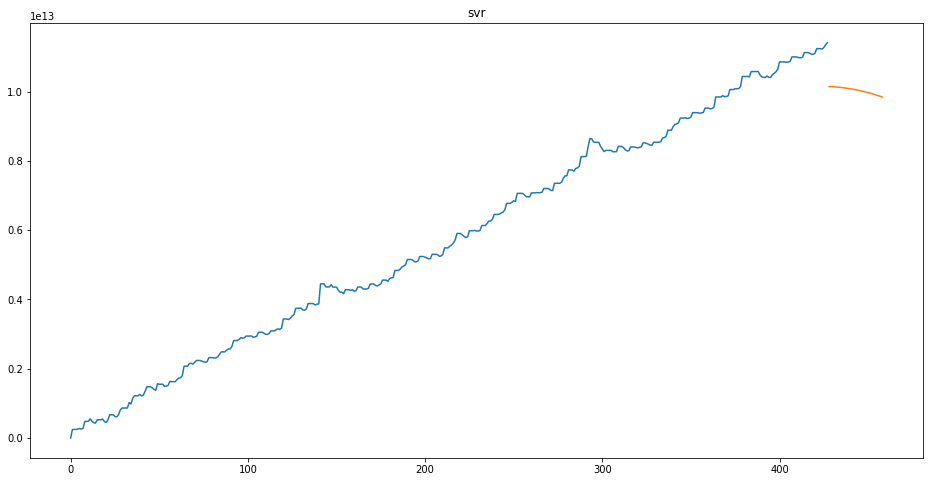

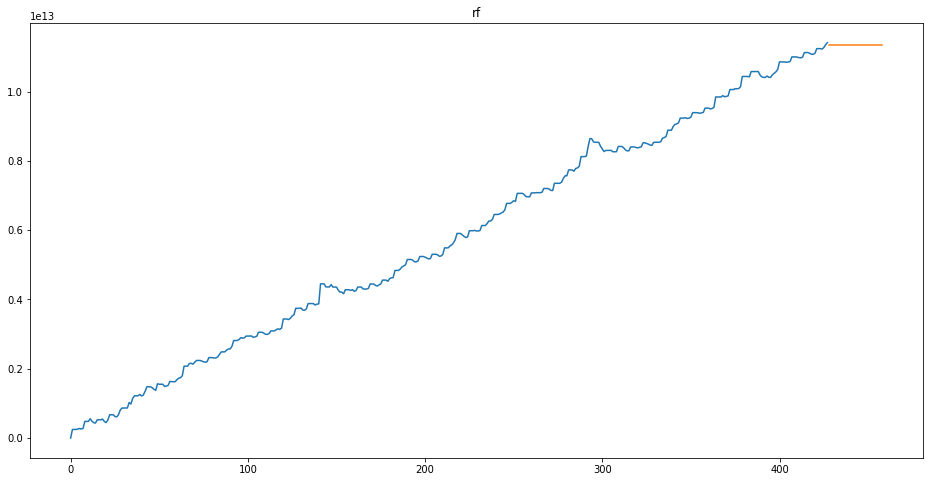

In [ ]:
plot_prediction(y_lr_pred, 'linear regression')
plot_prediction(y_svr_pred, 'svr')
plot_prediction(y_rf_pred, 'rf')

#### kas_kantor diff

##### Feature Selection

In [ ]:
features = ['kas_kantor_diff']

In [ ]:
feat_diff_df = train_diff_df[1:].reset_index()

In [ ]:
feat_data = feat_diff_df[features].values

##### Normalize Data

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [ ]:
# train_size = 0.75
# train_idx = int(N * 0.75 // 1)
train_idx = N - 31

scl = MinMaxScaler()
scl.fit(feat_data[:train_idx])
feat_data = scl.transform(feat_data)

##### Generate data

In [ ]:
N = len(feat_data)
T = 14

X = []
y = []

for i in range(T, N):
    X.append(feat_data[i-T:i])
    y.append(feat_data[i])

X = np.array(X)
y = np.array(y)

In [ ]:
print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

X shape: (413, 14, 1)
y shape: (413, 1)


##### Train Test Split

In [ ]:
X_train = X[:train_idx]
X_val = X[train_idx:]
y_train = y[:train_idx]
y_val = y[train_idx:]

print(f'X train shape: {X_train.shape}')
print(f'y train shape: {y_train.shape}')
print(f'X val shape: {X_val.shape}')
print(f'y val shape: {y_val.shape}')

X train shape: (397, 14, 1)
y train shape: (397, 1)
X val shape: (16, 14, 1)
y val shape: (16, 1)


##### Model Train

###### Non NN Model

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

In [ ]:
from sklearn.model_selection import GridSearchCV

In [ ]:
rfd_params = {
    'bootstrap': [True],
    'max_depth': [100],
    'max_features': [2],
    'min_samples_leaf': [4],
    'min_samples_split': [10],
    'n_estimators': [20, 50, 100]
}

xgbd_params = {
    'learning_rate': [0.015, 0.03, 0.045],
    'max_depth': [2, 3],
    'min_child_weight': [4, 5, 6],
    'silent': [1],
    'subsample': [0.3, 0.4, 0.5],
    'colsample_bytree': [0.8],
    'n_estimators': [200, 400, 650]
}

lgbmd_params = {
    'learning_rate': [0.08, 0.1, 0.15],
    'boosting_type': ['gbdt'],
    'sub_feature': [0.01, 0.04, 0.08],
    'num_leaves': [2, 3, 4, 5],
    'min_data': [7, 10, 12],
    'max_depth': [2, 5, 10],
    'n_estimators':[40, 50, 60]
} #initialize parameters

In [ ]:
kkrfd = RandomForestRegressor()
kkgbmd = GradientBoostingRegressor()
kkxgbd = XGBRegressor()
kklgbmd = LGBMRegressor()
kkgsrfd = RandomForestRegressor(bootstrap= True,
 max_depth= 110,
 max_features= 3,
 min_samples_leaf= 3,
 min_samples_split= 8,
 n_estimators= 100)

kkgsxgbd = XGBRegressor(colsample_bytree= 0.7,
 learning_rate= 0.05,
 max_depth= 5,
 min_child_weight= 3,
 n_estimators= 650,
 silent= 1,
 subsample= 0.6)

kkgslgbmd = LGBMRegressor(boosting_type= 'gbdt',
 learning_rate= 0.1,
 max_depth= 5,
 min_data= 100,
 n_estimators= 50,
 num_leaves= 5,
 sub_feature= 1)

In [ ]:
kkgsrfd = GridSearchCV(kkrfd, rfd_params, cv=10, scoring=rmsle_scorer)
kkgsrfd.fit(X_train.reshape(-1, T), y_train.reshape(-1, ))
kkgsrfd.best_params_

{'bootstrap': True,
 'max_depth': 100,
 'max_features': 2,
 'min_samples_leaf': 4,
 'min_samples_split': 10,
 'n_estimators': 50}

In [ ]:
kkgsxgbd = GridSearchCV(kkxgbd, xgbd_params, cv=10, scoring=rmsle_scorer)
kkgsxgbd.fit(X_train.reshape(-1, T), y_train.reshape(-1, ))
kkgsxgbd.best_params_

{'colsample_bytree': 0.8,
 'learning_rate': 0.015,
 'max_depth': 3,
 'min_child_weight': 6,
 'n_estimators': 650,
 'silent': 1,
 'subsample': 0.3}

In [ ]:
kkgslgbmd = GridSearchCV(kklgbmd, lgbmd_params, cv=10, scoring=rmsle_scorer)
kkgslgbmd.fit(X_train.reshape(-1, T), y_train.reshape(-1, ))
kkgslgbmd.best_params_

{'boosting_type': 'gbdt',
 'learning_rate': 0.1,
 'max_depth': 2,
 'min_data': 12,
 'n_estimators': 60,
 'num_leaves': 3,
 'sub_feature': 0.01}

In [ ]:
kkrfd.fit(X_train.reshape(-1, T), y_train.reshape(-1, ))
kkgbmd.fit(X_train.reshape(-1, T), y_train.reshape(-1, ))
kkxgbd.fit(X_train.reshape(-1, T), y_train.reshape(-1, ))
kklgbmd.fit(X_train.reshape(-1, T), y_train.reshape(-1, ))

[12:34:12] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

In [ ]:
i = Input(shape=(T, ))
x = Dense(64)(i)
x = Dense(64)(x)
x = Dense(1)(x)

mkkd = Model(i, x)
mkkd.summary()
mkkd.compile(
    loss=root_mean_squared_log_error,
    optimizer=Adam(lr=0.001)
)

rkkd = mkkd.fit(X_train.reshape(-1, T), y_train.reshape(-1, ), validation_data=(X_val.reshape(-1, T), y_val.reshape(-1, )), epochs=20)

Model: "model_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_17 (InputLayer)        [(None, 14)]              0         
_________________________________________________________________
dense_54 (Dense)             (None, 64)                960       
_________________________________________________________________
dense_55 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_56 (Dense)             (None, 1)                 65        
Total params: 5,185
Trainable params: 5,185
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
13/13 [==============================] - 1s 16ms/step - loss: 0.0732 - val_loss: 0.0431
Epoch 2/20
13/13 [==============================] - 0s 5ms/step - loss: 0.0434 - val_loss: 0.0254
Epoch 3/20
13/13 [==============================] - 0s 6m

In [ ]:
def val_prediction(model):
    t_pred = y_val.shape[0]
    y_val_pred = np.zeros(y_val.shape)

    X_val_pred = X_val[0].copy()

    for i in range(t_pred):
        y_val_pred[i] = model.predict(X_val_pred.reshape(-1, T))
        X_val_pred[:-1] = X_val_pred[1:]
        X_val_pred[-1][:-1] = X_val_pred[-1][1:]
        X_val_pred[-1][-1] = y_val_pred[i]

    return y_val_pred

In [ ]:
kkrfd_val_pred = val_prediction(kkrfd)
kkgbmd_val_pred = val_prediction(kkgbmd)
kkxgbd_val_pred = val_prediction(kkxgbd)
kklgbmd_val_pred = val_prediction(kklgbmd)

kkgsrfd_val_pred = val_prediction(kkgsrfd)
kkgsxgbd_val_pred = val_prediction(kkgsxgbd)
kkgslgbmd_val_pred = val_prediction(kkgslgbmd)

In [ ]:
mkkd_val_pred = val_prediction(mkkd)

In [ ]:
print(f'RMSLE rf: {np.sqrt(msle(y_val, kkrfd_val_pred).numpy())}')
print(f'RMSLE gbm: {np.sqrt(msle(y_val, kkgbmd_val_pred).numpy())}')
print(f'RMSLE xgb: {np.sqrt(msle(y_val, kkxgbd_val_pred).numpy())}')
print(f'RMSLE lgbm: {np.sqrt(msle(y_val, kklgbmd_val_pred).numpy())}')
print(f'RMSLE gsrf: {np.sqrt(msle(y_val, kkgsrfd_val_pred).numpy())}')
print(f'RMSLE gsxgb: {np.sqrt(msle(y_val, kkgsxgbd_val_pred).numpy())}')
print(f'RMSLE gslgbm: {np.sqrt(msle(y_val, kkgslgbmd_val_pred).numpy())}')

RMSLE rf: 0.03762891324717503
RMSLE gbm: 0.04294599260970011
RMSLE xgb: 0.050096984118884774
RMSLE lgbm: 0.07143740048614339
RMSLE gsrf: 0.04244559462437919
RMSLE gsxgb: 0.04577333567435949
RMSLE gslgbm: 0.055378814609739944


In [ ]:
print(f'RMSLE rkkd: {np.sqrt(msle(y_val, mkkd_val_pred).numpy())}')

RMSLE rkkd: 0.03411504217984629


In [ ]:
# kas_echannel
def plot_val(y_val, y_val_pred):
    plt.figure(figsize=(16, 8))
    plt.plot(y_val)
    plt.plot(y_val_pred)
    plt.show()

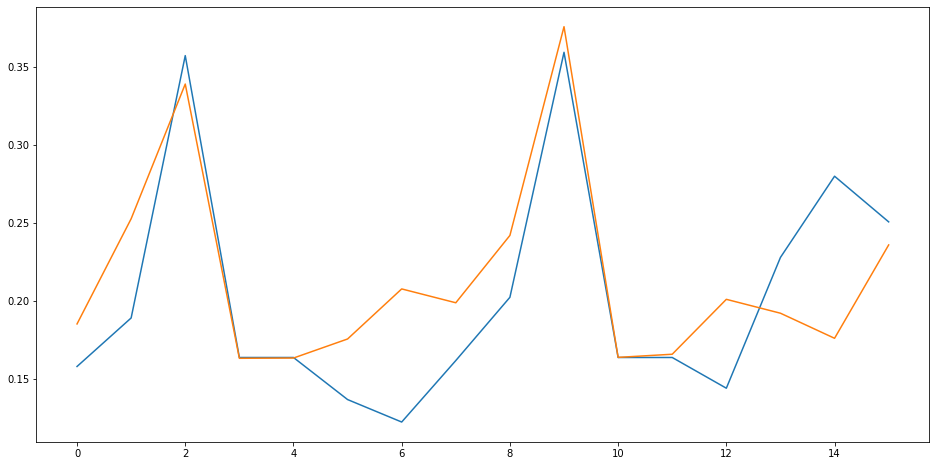

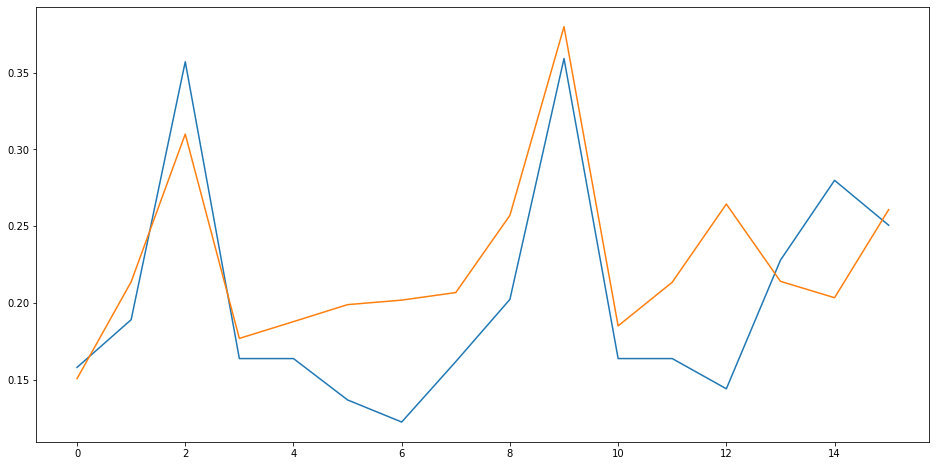

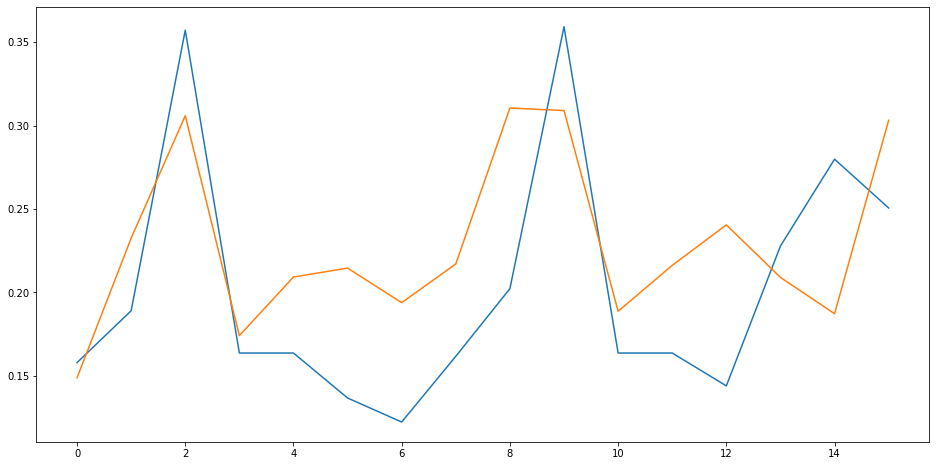

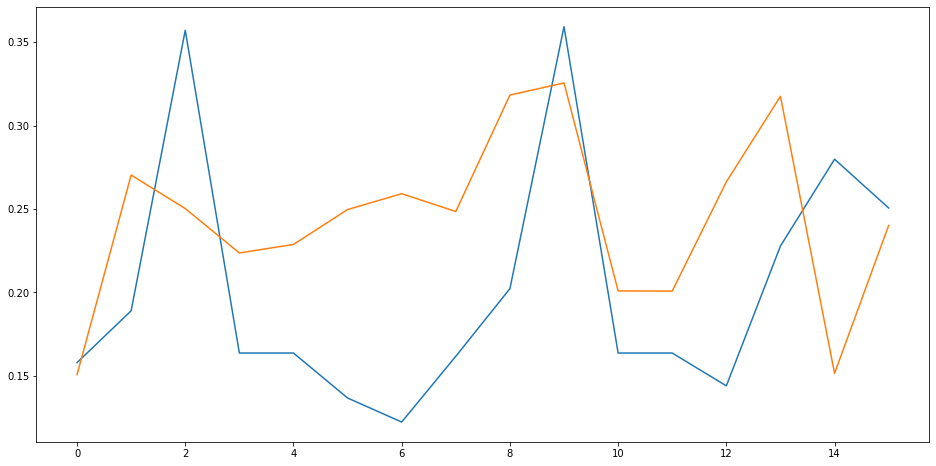

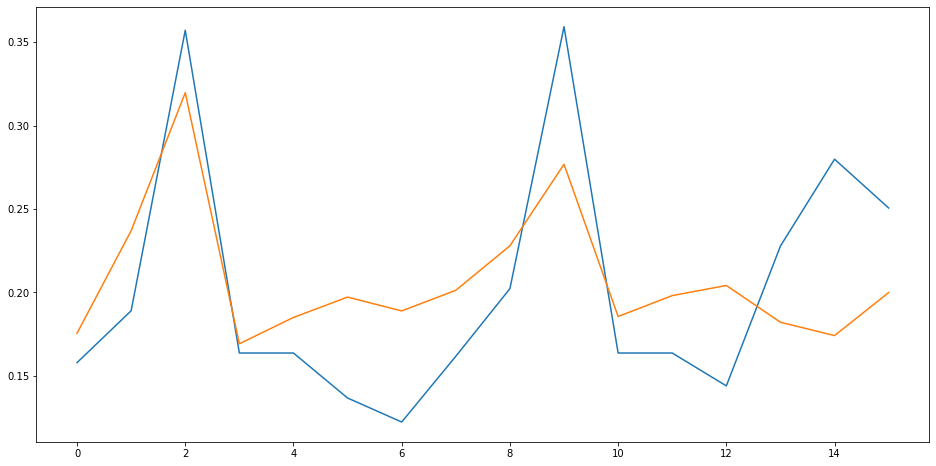

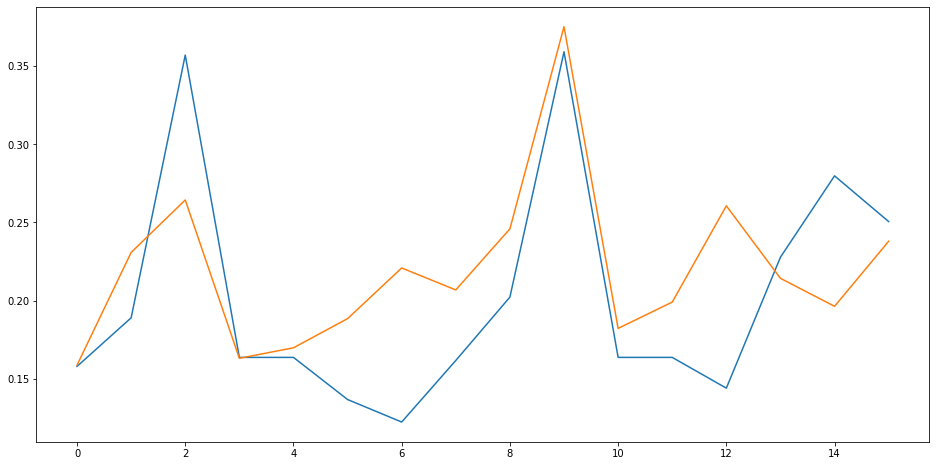

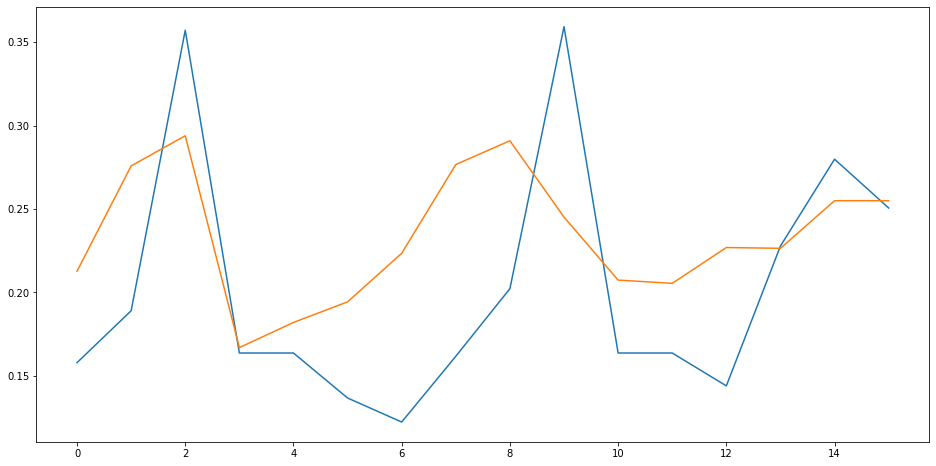

In [ ]:
plot_val(y_val, kkrfd_val_pred)
plot_val(y_val, kkgbmd_val_pred)
plot_val(y_val, kkxgbd_val_pred)
plot_val(y_val, kklgbmd_val_pred)
plot_val(y_val, kkgsrfd_val_pred)
plot_val(y_val, kkgsxgbd_val_pred)
plot_val(y_val, kkgslgbmd_val_pred)

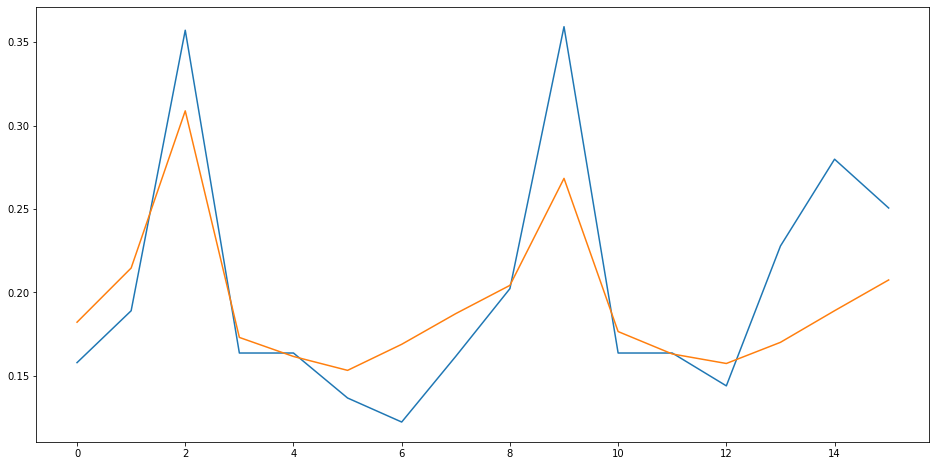

In [ ]:
plot_val(y_val, mkkd_val_pred)

In [ ]:
kkrfd_real_val_pred = scl.inverse_transform(kkrfd_val_pred)
kkgbmd_real_val_pred = scl.inverse_transform(kkgbmd_val_pred)
kkxgbd_real_val_pred = scl.inverse_transform(kkxgbd_val_pred)
kklgbmd_real_val_pred = scl.inverse_transform(kklgbmd_val_pred)

kkgsrfd_real_val_pred = scl.inverse_transform(kkgsrfd_val_pred)
kkgsxgbd_real_val_pred = scl.inverse_transform(kkgsxgbd_val_pred)
kkgslgbmd_real_val_pred = scl.inverse_transform(kkgslgbmd_val_pred)

In [ ]:
mkkd_real_val_pred = scl.inverse_transform(mkkd_val_pred)

In [ ]:
def plot_real_val(model, y_val_pred):
    idx_val = np.array([i for i in range(N-len(y_val), N)])
    idx_train = np.array([i for i in range(T, N-len(y_val))])
    plt.figure(figsize=(16, 8))
    plt.plot(feat_diff_df[features].values)
    plt.plot(idx_train, scl.inverse_transform(model.predict(X_train.reshape(-1, T)).reshape(-1, 1)))
    plt.plot(idx_val, y_val_pred)
    plt.show()

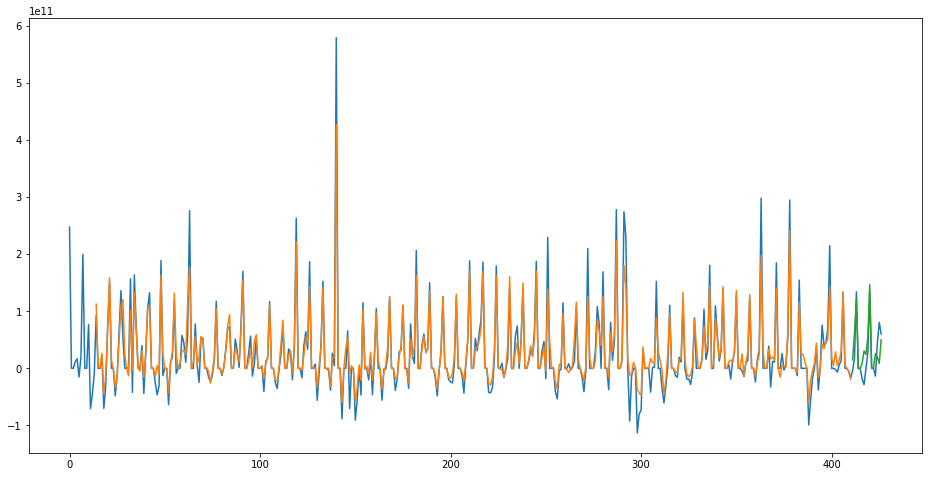

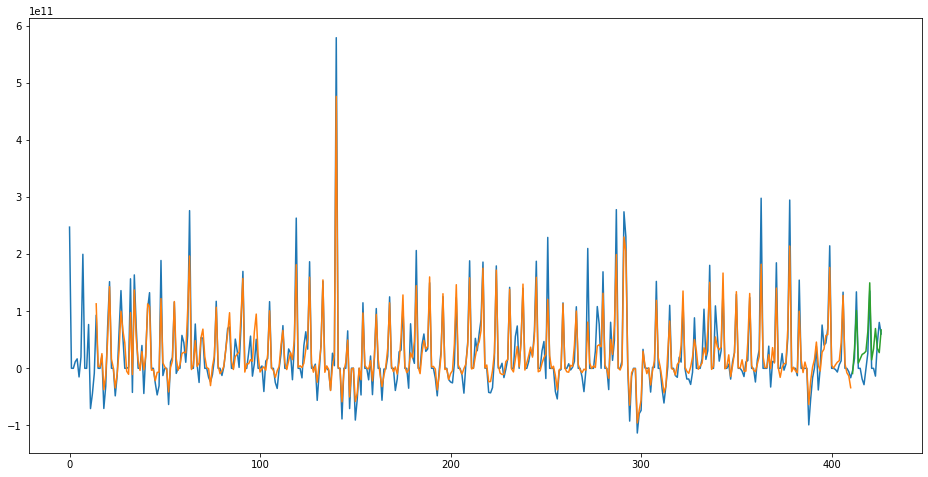

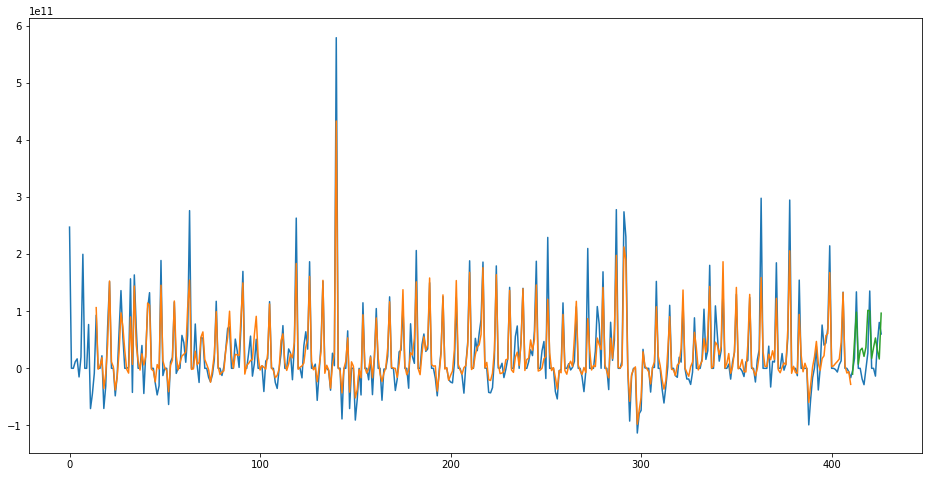

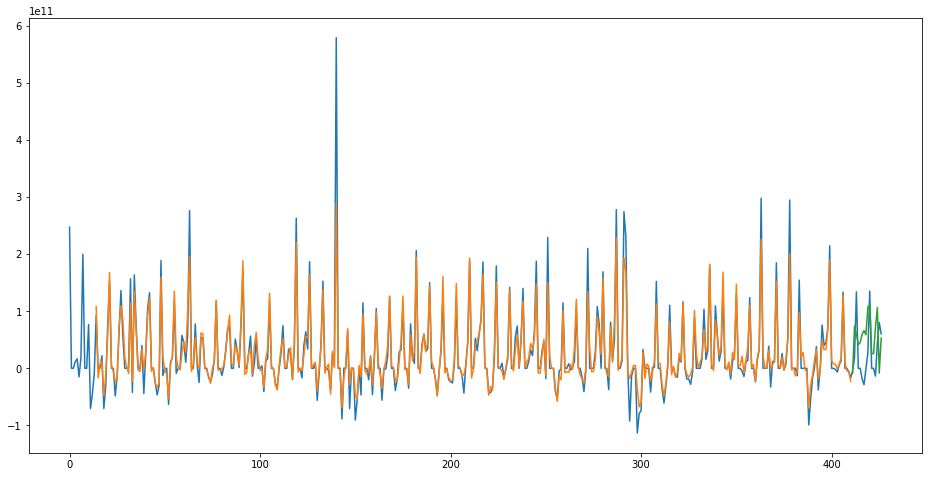

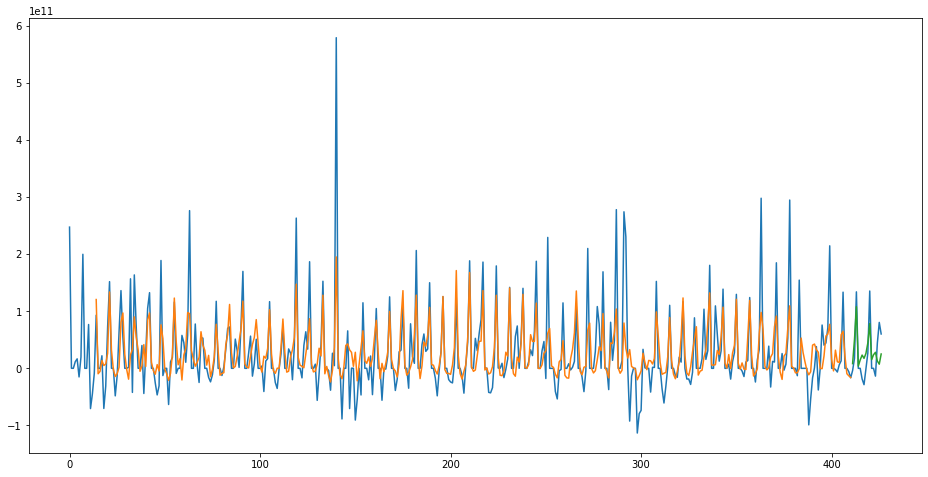

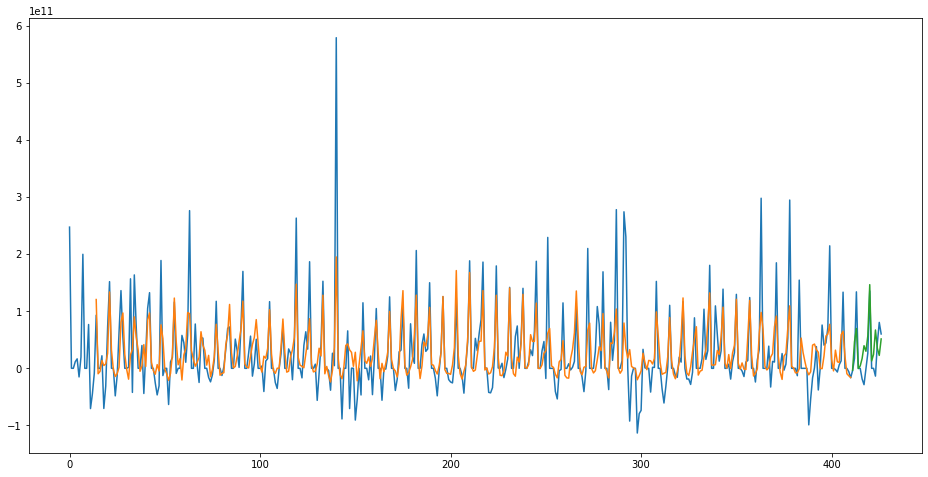

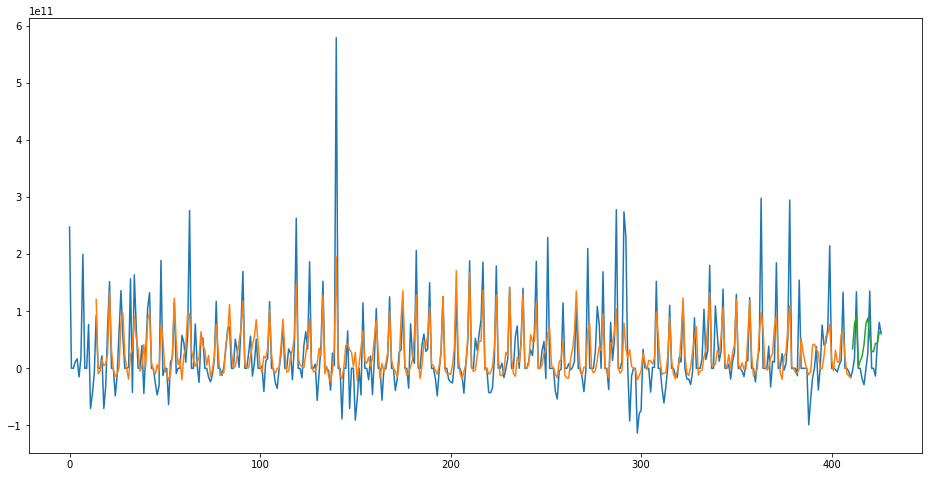

In [ ]:
plot_real_val(kkrfd, kkrfd_real_val_pred)
plot_real_val(kkgbmd, kkgbmd_real_val_pred)
plot_real_val(kkxgbd, kkxgbd_real_val_pred)
plot_real_val(kklgbmd, kklgbmd_real_val_pred)
plot_real_val(kkgslgbmd, kkgsrfd_real_val_pred)
plot_real_val(kkgslgbmd, kkgsxgbd_real_val_pred)
plot_real_val(kkgslgbmd, kkgslgbmd_real_val_pred)

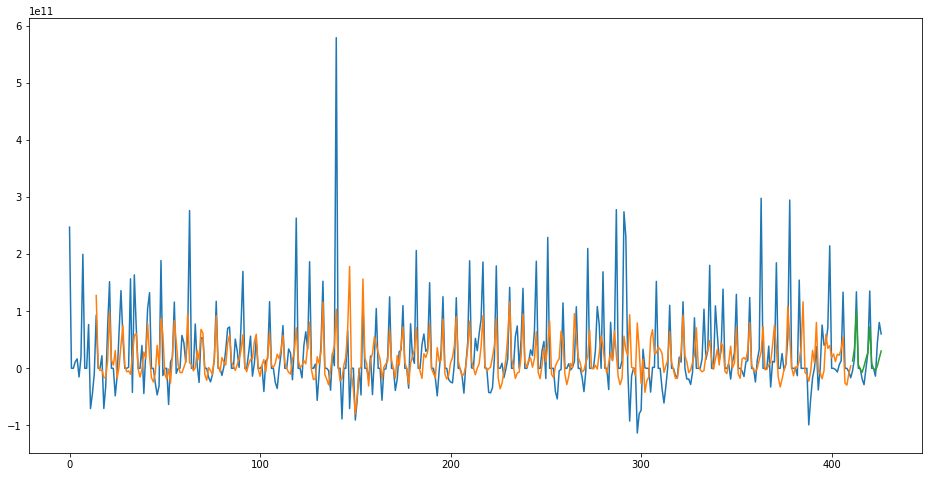

In [ ]:
plot_real_val(mkkd, mkkd_real_val_pred)

In [ ]:
def kk_make_predictions(model):
    t_pred = 31
    X_diff_pred = X[-1]
    y_diff_pred = np.zeros(t_pred)
    for i in range(t_pred):
        y_diff_pred[i] = model.predict(X_diff_pred.reshape(-1, T))
        X_diff_pred[:-1] = X_diff_pred[1:]
        X_diff_pred[-1][:-1] = X_diff_pred[-1][1:]
        X_diff_pred[-1][-1] = y_diff_pred[i]

    y_diff_pred = scl.inverse_transform(y_diff_pred.reshape(-1, 1))
    y_pred = np.zeros(t_pred)
    X_pred = train_df['kas_kantor'].values[-1]
    for i in range(t_pred):
        y_pred[i] = X_pred + y_diff_pred[i]
        X_pred = y_pred[i]

    return y_pred

In [ ]:
def kk_plot_predictions(y_pred):
    t_pred = 31
    idx_pred = [i+train_df.index[-1] for i in range(t_pred)]
    plt.figure(figsize=(16, 8))
    plt.plot(train_df['kas_kantor'].values)
    plt.plot(idx_pred, y_pred)
    plt.show()

In [ ]:
kkrfd_pred = kk_make_predictions(kkrfd)
kkgbmd_pred = kk_make_predictions(kkgbmd)
kkxgbd_pred = kk_make_predictions(kkxgbd)
kklgbmd_pred = kk_make_predictions(kklgbmd)

kkgsrfd_pred = kk_make_predictions(kkgsrfd)
kkgsxgbd_pred = kk_make_predictions(kkgsxgbd)
kkgslgbmd_pred = kk_make_predictions(kkgslgbmd)

In [ ]:
mkkd_pred = kk_make_predictions(mkkd)

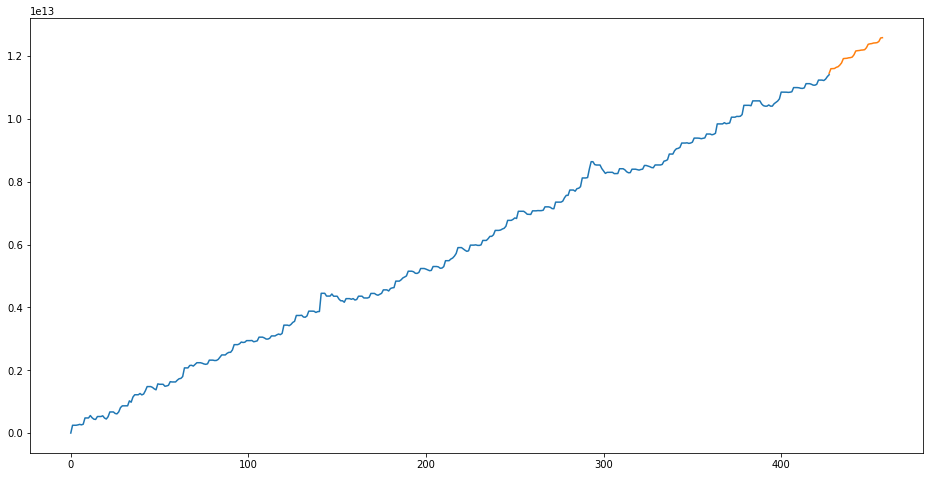

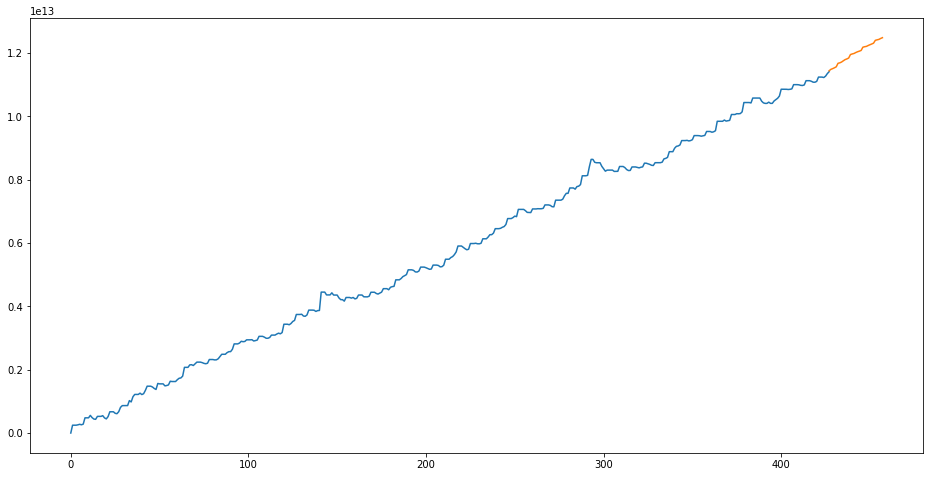

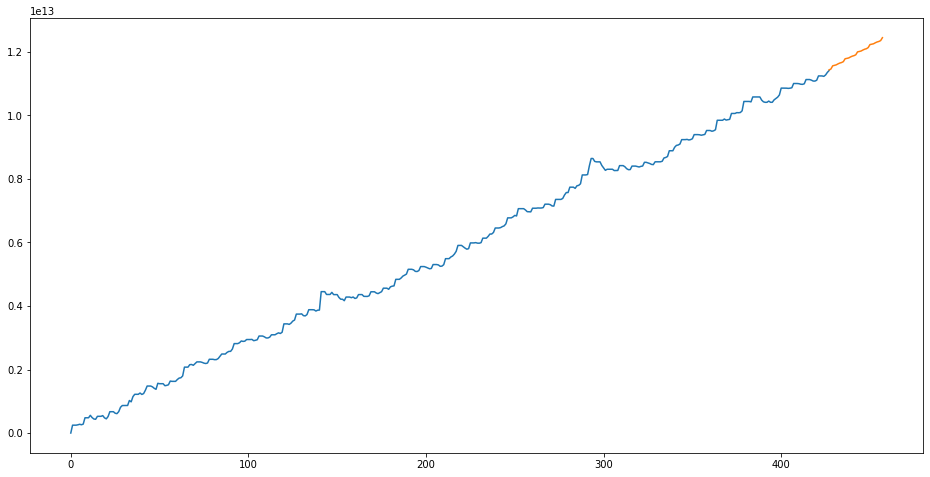

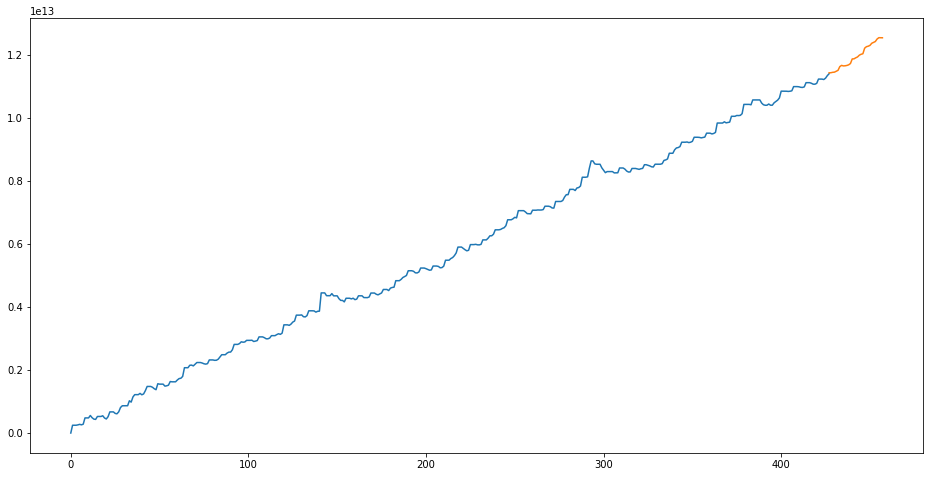

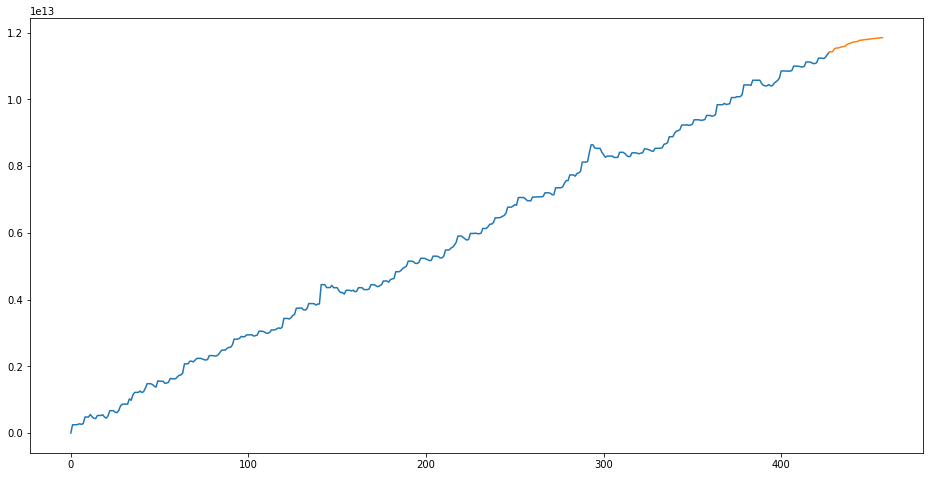

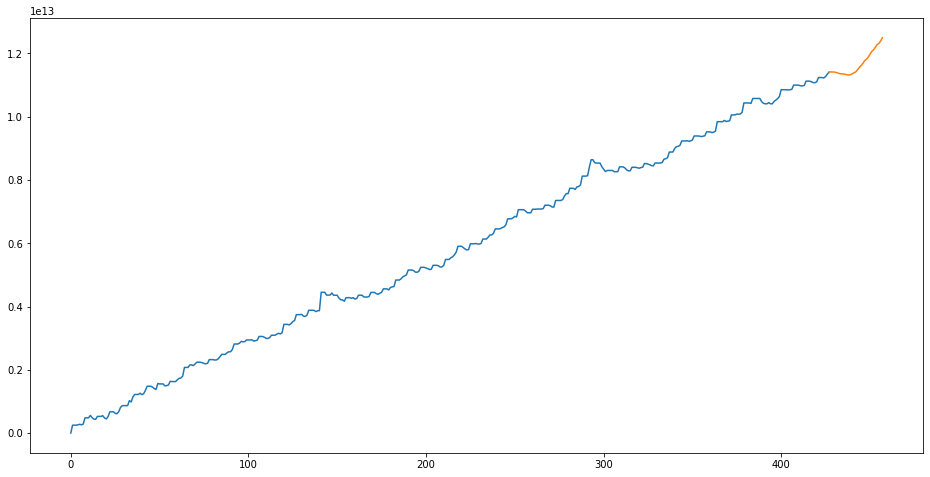

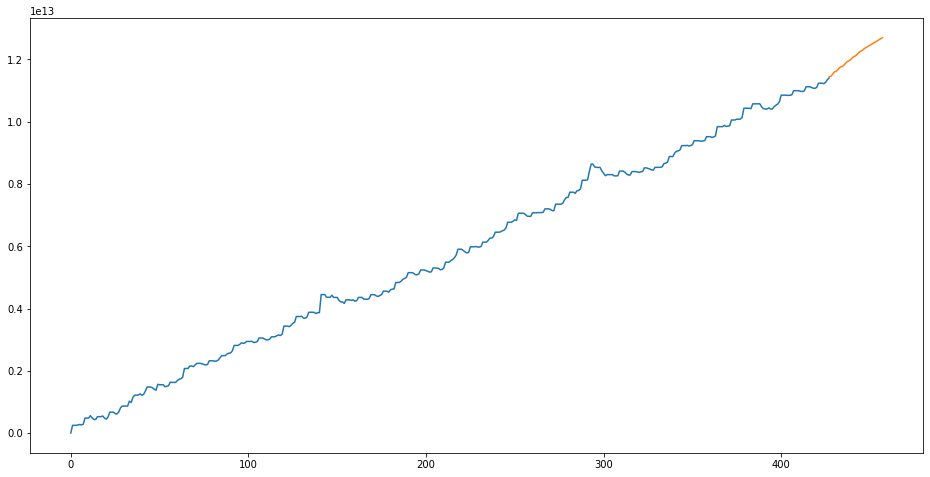

In [ ]:
kk_plot_predictions(kkrfd_pred)
kk_plot_predictions(kkgbmd_pred)
kk_plot_predictions(kkxgbd_pred)
kk_plot_predictions(kklgbmd_pred)
kk_plot_predictions(kkgsrfd_pred)
kk_plot_predictions(kkgsxgbd_pred)
kk_plot_predictions(kkgslgbmd_pred)

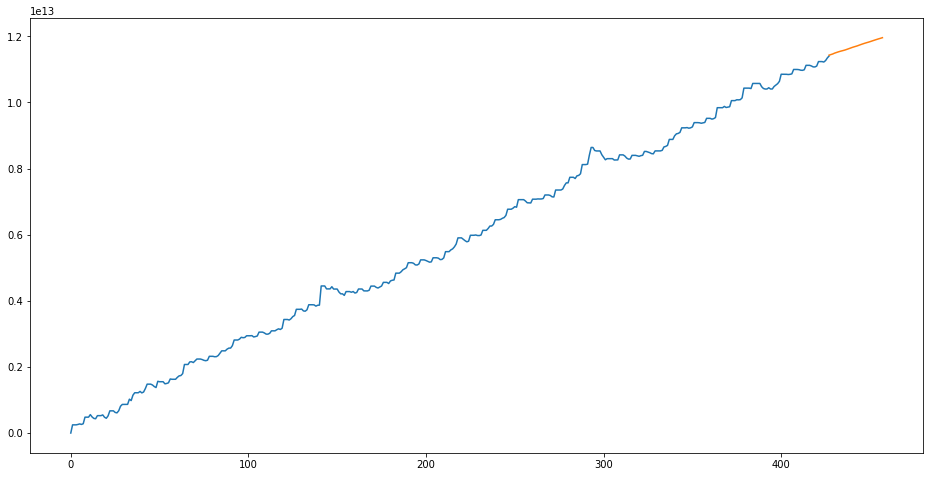

In [ ]:
kk_plot_predictions(mkkd_pred)

#### kas_kantor simple regression NN

In [ ]:
X = train_df.index.values
y = train_df['kas_kantor'].values

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.35)

X_train = X_train.reshape(-1, 1)
X_val = X_val.reshape(-1, 1)

y_train = y_train.reshape(-1, 1)
y_val = y_val.reshape(-1, 1)

scl_kk = MinMaxScaler(feature_range=(0.1, 1))
y_train = scl_kk.fit_transform(y_train).ravel()
y_val = scl_kk.transform(y_val).ravel()

In [ ]:
# train_size = 0.75
# N = len(X)
# train_idx = int(N * train_size // 1)

# X_train = X[:train_idx].reshape(-1, 1)
# X_val = X[train_idx:].reshape(-1, 1)

# y_train = y[:train_idx].reshape(-1, 1)
# y_val = y[train_idx:].reshape(-1, 1)

# scl_kk = MinMaxScaler()
# y_train = scl_kk.fit_transform(y_train).ravel()
# y_val = scl_kk.transform(y_val).ravel()

##### Train

In [ ]:
i = Input(shape=(X_train.shape[1],))
x = Dense(128, activation='relu')(i)
x = Dense(128, activation='relu')(x)
x = Dense(64, activation='relu')(x)
x = Dense(64, activation='relu')(x)
x = Dense(1)(x)

mknn = Model(i, x)
mknn.summary()

Model: "model_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_13 (InputLayer)        [(None, 1)]               0         
_________________________________________________________________
dense_36 (Dense)             (None, 128)               256       
_________________________________________________________________
dense_37 (Dense)             (None, 128)               16512     
_________________________________________________________________
dense_38 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_39 (Dense)             (None, 64)                4160      
_________________________________________________________________
dense_40 (Dense)             (None, 1)                 65        
Total params: 29,249
Trainable params: 29,249
Non-trainable params: 0
______________________________________________________

In [ ]:
mknn.compile(
    loss=root_mean_squared_log_error,
    optimizer=Adam(lr=0.001)
)

In [ ]:
r = mknn.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=25)

Epoch 1/25
9/9 [==============================] - 1s 25ms/step - loss: nan - val_loss: nan
Epoch 2/25
9/9 [==============================] - 0s 8ms/step - loss: nan - val_loss: nan
Epoch 3/25
9/9 [==============================] - 0s 7ms/step - loss: nan - val_loss: nan
Epoch 4/25
9/9 [==============================] - 0s 7ms/step - loss: nan - val_loss: nan
Epoch 5/25
9/9 [==============================] - 0s 10ms/step - loss: nan - val_loss: nan
Epoch 6/25
9/9 [==============================] - 0s 7ms/step - loss: nan - val_loss: nan
Epoch 7/25
9/9 [==============================] - 0s 8ms/step - loss: nan - val_loss: nan
Epoch 8/25
9/9 [==============================] - 0s 8ms/step - loss: nan - val_loss: nan
Epoch 9/25
9/9 [==============================] - 0s 8ms/step - loss: nan - val_loss: nan
Epoch 10/25
9/9 [==============================] - 0s 7ms/step - loss: nan - val_loss: nan
Epoch 11/25
9/9 [==============================] - 0s 7ms/step - loss: nan - val_loss: nan
Epoch 

##### Evaluation

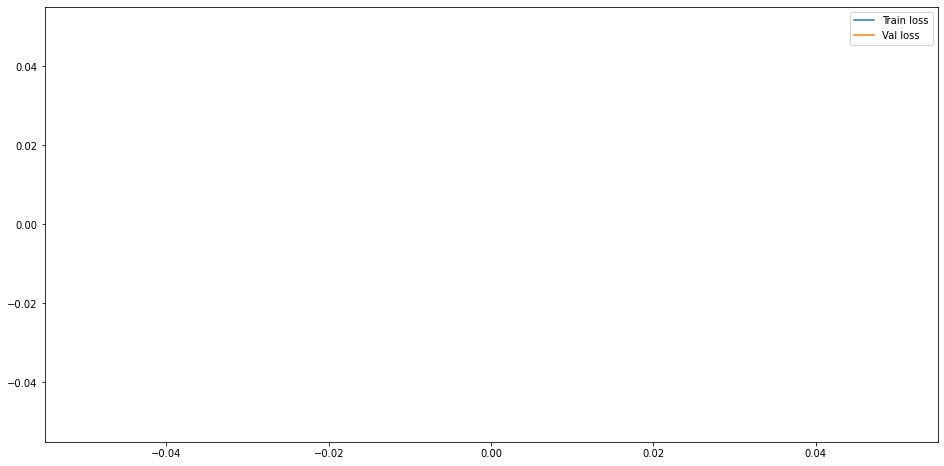

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(r.history['loss'], label='Train loss')
plt.plot(r.history['val_loss'], label='Val loss')
plt.legend()
plt.show()

In [ ]:
y_val_pred = scl_kk.inverse_transform(mknn.predict(X_val))
y_val_r = scl_kk.inverse_transform(y_val.reshape(-1, 1))

print(f'RMSLE val: {root_mean_squared_log_error(y_val_r, y_val_pred)}')

RMSLE val: nan


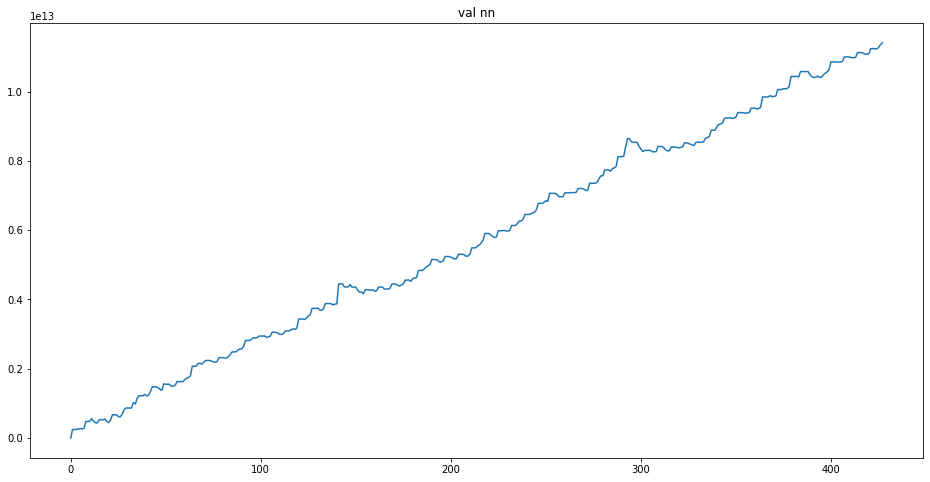

In [ ]:
plt.figure(figsize=(16, 8))
plt.title('val nn')
plt.plot(X, y)
plt.scatter(X_train, scl_kk.inverse_transform(mknn.predict(X_train)))
plt.scatter(X_val, y_val_pred)
plt.show()

##### Prediction

In [ ]:
X_pred = np.array([i+X[-1] for i in range(1, 32)]).reshape(-1, 1)
y_pred = scl_kk.inverse_transform(mknn.predict(X_pred))

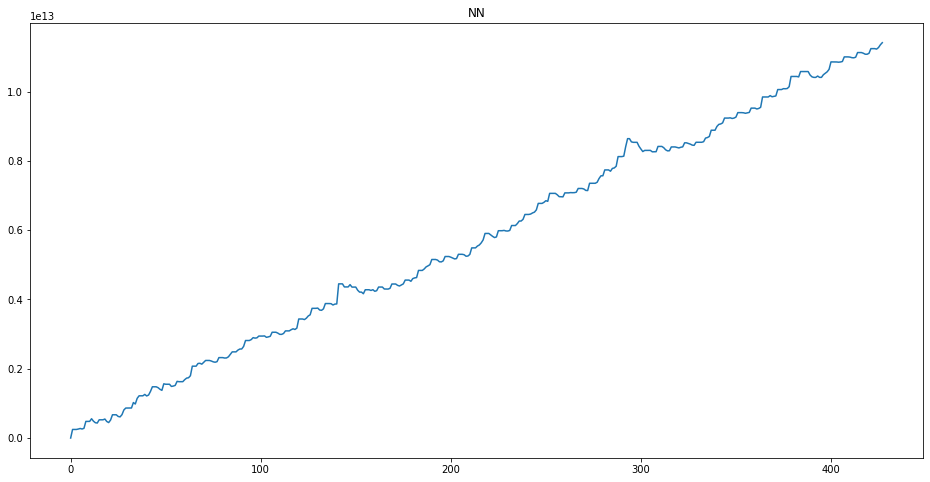

In [ ]:
plot_prediction(y_pred, 'NN')

#### kas_kantor diff fbprophet

In [ ]:
from fbprophet import Prophet
from fbprophet.diagnostics import cross_validation, performance_metrics

In [ ]:
val_period = 31
train_diff_kk_pr_df = train_diff_df.reset_index(drop=True)[:-val_period].rename(columns={'periode': 'ds', 'kas_kantor_diff':'y'})
scl = MinMaxScaler()
train_diff_kk_pr_df['y'] = scl.fit_transform(train_diff_kk_pr_df['y'].values.reshape(-1, 1))
y_val = train_diff_df['kas_kantor_diff'][-val_period:]

In [ ]:
n_train = int(len(train_diff_kk_pr_df) * 0.75)
n_train

297

##### Train

In [ ]:
mfbkk = Prophet(seasonality_mode='additive', weekly_seasonality=True, yearly_seasonality=True)

In [ ]:
mfbkk.fit(train_diff_kk_pr_df)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [ ]:
dffbkk_cv = cross_validation(mfbkk, initial=f'{n_train} days', period=f'{val_period} days', horizon=f'{val_period*2} days')
dffbkk_p = performance_metrics(dffbkk_cv)
dffbkk_p.head()

INFO:fbprophet:Making 2 forecasts with cutoffs between 2020-05-29 00:00:00 and 2020-06-29 00:00:00


,horizon,mse,rmse,mae,mape,mdape,coverage
0,6 days,0.013109,0.114492,0.094049,0.474193,0.506136,0.500000
1,7 days,0.014939,0.122224,0.103430,0.521577,0.506136,0.500000
2,8 days,0.016304,0.127685,0.105507,0.537745,0.506136,0.500000
3,9 days,0.017441,0.132064,0.109378,0.587144,0.506136,0.416667
4,10 days,0.016264,0.127531,0.103840,0.616962,0.506136,0.416667


In [ ]:
dffbkk_cv.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2020-05-30,0.030600,-0.064452,0.128913,0.163661,2020-05-29
1,2020-05-31,0.016596,-0.087053,0.114374,0.163661,2020-05-29
2,2020-06-01,0.017687,-0.085125,0.130894,0.103575,2020-05-29
3,2020-06-02,0.007263,-0.097986,0.105281,0.166184,2020-05-29
4,2020-06-03,0.059609,-0.041273,0.157692,0.165973,2020-05-29


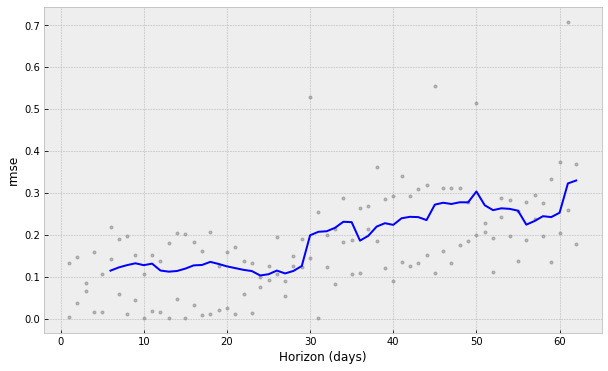

In [ ]:
from fbprophet.plot import plot_cross_validation_metric
figfbkk = plot_cross_validation_metric(dffbkk_cv, metric='rmse')

In [ ]:
import itertools

param_grid = {
    'changepoint_prior_scale': [0.001, 0.01, 0.1, 0.5],
    'seasonality_prior_scale': [0.01, 0.1, 1.0, 10.0],
    'holidays_prior_scale': [0.01, 0.1, 1.0, 10.0],
    'changepoint_range': [0.8, 0.9, 0.95],
    'seasonality_mode': ['additive', 'multiplicative']
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []  # Store the RMSEs for each params here

# Use cross validation to evaluate all parameters
for params in all_params:
    mfbkk = Prophet(**params).fit(train_diff_kk_pr_df)  # Fit model with given params
    dffbkk_cv = cross_validation(mfbkk, initial=f'{n_train} days', period=f'{val_period} days', horizon=f'{val_period*2} days', parallel='processes')
    dffbkk_p = performance_metrics(dffbkk_cv, rolling_window=1)
    rmses.append(dffbkk_p['rmse'].values[0])

best_params = all_params[np.argmin(rmses)]
print(best_params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 2 forecasts with cutoffs between 2020-05-29 00:00:00 and 2020-06-29 00:00:00
INFO:fbprophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc64672c748>
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 2 forecasts with cutoffs between 2020-05-29 00:00:00 and 2020-06-29 00:00:00
INFO:fbprophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7fc651b9a860>
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet 

{'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'changepoint_range': 0.8, 'seasonality_mode': 'additive'}


In [ ]:
# {'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'changepoint_range': 0.8, 'seasonality_mode': 'additive'}

In [ ]:
mfbkk = Prophet(**best_params)
mfbkk.fit(train_diff_kk_pr_df)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Forecast

##### Evaluation

In [ ]:
futurefbkk = mfbkk.make_future_dataframe(periods=val_period+31)
forecastfbkk = mfbkk.predict(futurefbkk)

In [ ]:
forecastfbkk

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2019-07-31,0.209631,0.135393,0.352095,0.209631,0.209631,0.030876,0.030876,0.030876,0.030876,0.030876,0.030876,0.0,0.0,0.0,0.240507
1,2019-08-01,0.209481,0.248681,0.457248,0.209481,0.209481,0.141894,0.141894,0.141894,0.141894,0.141894,0.141894,0.0,0.0,0.0,0.351375
2,2019-08-02,0.209332,0.061950,0.281893,0.209332,0.209332,-0.039177,-0.039177,-0.039177,-0.039177,-0.039177,-0.039177,0.0,0.0,0.0,0.170155
3,2019-08-03,0.209182,0.061838,0.276391,0.209182,0.209182,-0.038421,-0.038421,-0.038421,-0.038421,-0.038421,-0.038421,0.0,0.0,0.0,0.170762
4,2019-08-04,0.209033,0.066827,0.278429,0.209033,0.209033,-0.037448,-0.037448,-0.037448,-0.037448,-0.037448,-0.037448,0.0,0.0,0.0,0.171585
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
454,2020-10-27,0.193456,0.058603,0.274852,0.192939,0.193926,-0.024784,-0.024784,-0.024784,-0.024784,-0.024784,-0.024784,0.0,0.0,0.0,0.168671
455,2020-10-28,0.193424,0.122171,0.320438,0.192888,0.193905,0.030876,0.030876,0.030876,0.030876,0.030876,0.030876,0.0,0.0,0.0,0.224300
456,2020-10-29,0.193392,0.226198,0.442839,0.192836,0.193885,0.141894,0.141894,0.141894,0.141894,0.141894,0.141894,0.0,0.0,0.0,0.335286
457,2020-10-30,0.193360,0.041393,0.256804,0.192788,0.193871,-0.039177,-0.039177,-0.039177,-0.039177,-0.039177,-0.039177,0.0,0.0,0.0,0.154183


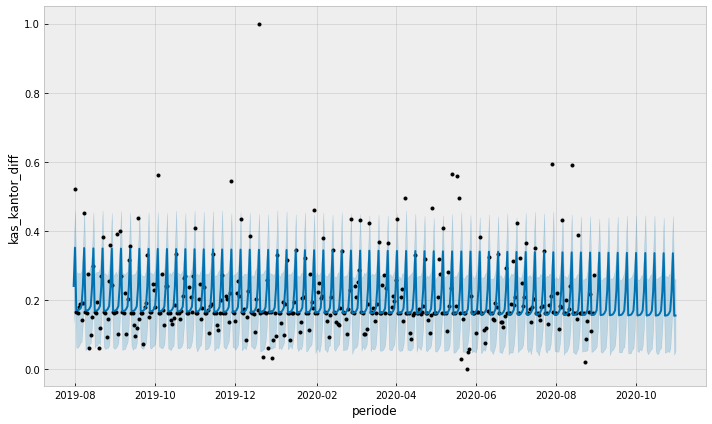

In [ ]:
figurefbkk = mfbkk.plot(forecastfbkk, xlabel='periode', ylabel='kas_kantor_diff')

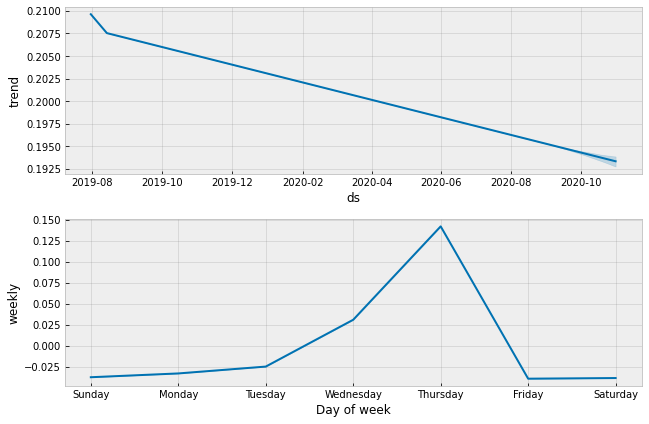

In [ ]:
ffbkk = mfbkk.plot_components(forecastfbkk)

In [ ]:
# y_forecast = (0.51*forecast['yhat_upper'][1:] + 0.49*forecast['yhat_lower'][1:]).reset_index(drop=True)
y_forecastfbkk = forecastfbkk['yhat'][1:].reset_index(drop=True)
y_val_scaled_predfbkk = y_forecastfbkk[-(val_period+31):-31].values.reshape(-1, 1)
y_val_predfbkk = scl.inverse_transform(y_val_scaled_predfbkk)
print(f'RMSLE scaled val: {root_mean_squared_log_error(scl.transform(y_val.values.reshape(-1, 1)), y_val_scaled_predfbkk)}')
print(f'RMSLE val: {root_mean_squared_log_error(y_val.values, y_val_predfbkk)}')

RMSLE scaled val: 0.014120811633871312
RMSLE val: nan


In [ ]:
X_val = train_df['kas_kantor'].values[-(val_period+1)]
y_kk_val_pred = np.zeros(len(y_val_predfbkk))
for i in range(len(y_val_predfbkk)):
    y_kk_val_pred[i] = X_val + y_val_predfbkk[i]
    X_val = y_kk_val_pred[i]
y_kk_val_pred

array([1.04829970e+13, 1.04877069e+13, 1.05309344e+13, 1.06510093e+13,
       1.06456872e+13, 1.06408666e+13, 1.06366971e+13, 1.06356272e+13,
       1.06401819e+13, 1.06832543e+13, 1.08031741e+13, 1.07976969e+13,
       1.07927211e+13, 1.07883965e+13, 1.07871714e+13, 1.07915711e+13,
       1.08344884e+13, 1.09542530e+13, 1.09486206e+13, 1.09434897e+13,
       1.09390100e+13, 1.09376298e+13, 1.09418743e+13, 1.09846365e+13,
       1.11042460e+13, 1.10984585e+13, 1.10931725e+13, 1.10885376e+13,
       1.10870023e+13, 1.10910917e+13, 1.11336987e+13])

In [ ]:
train_df['kas_kantor'].values[-val_period:]

array([1.05245424e+13, 1.05689204e+13, 1.06397705e+13, 1.08543357e+13,
       1.08543357e+13, 1.08543357e+13, 1.08523355e+13, 1.08458728e+13,
       1.08521401e+13, 1.08654060e+13, 1.09988133e+13, 1.09988133e+13,
       1.09988133e+13, 1.09929358e+13, 1.09764119e+13, 1.09724200e+13,
       1.09899558e+13, 1.11239025e+13, 1.11239025e+13, 1.11239025e+13,
       1.11052336e+13, 1.10765927e+13, 1.10752321e+13, 1.11019398e+13,
       1.12373609e+13, 1.12373609e+13, 1.12373609e+13, 1.12237298e+13,
       1.12681306e+13, 1.13485621e+13, 1.14087369e+13])

In [ ]:
print(f"RMSLE val: {root_mean_squared_log_error(train_df['kas_kantor'].values[-val_period:], y_kk_val_pred)}")

RMSLE val: 0.007116038984887598


##### Prediction

In [ ]:
y_scaled_predfbkk = y_forecastfbkk[-31:].values.reshape(-1, 1)
y_predfbkk = scl.inverse_transform(y_scaled_predfbkk)
y_predfbkk

array([[ 1.19454352e+11],
       [-5.94259754e+09],
       [-5.44115394e+09],
       [-4.78998416e+09],
       [-1.69041919e+09],
       [ 3.93422690e+09],
       [ 4.24519217e+10],
       [ 1.19299225e+11],
       [-6.09772474e+09],
       [-5.59628114e+09],
       [-4.94511136e+09],
       [-1.84554639e+09],
       [ 3.77909970e+09],
       [ 4.22967945e+10],
       [ 1.19144098e+11],
       [-6.25285194e+09],
       [-5.75140834e+09],
       [-5.10023856e+09],
       [-2.00067359e+09],
       [ 3.62397251e+09],
       [ 4.21416673e+10],
       [ 1.18988970e+11],
       [-6.40797914e+09],
       [-5.90653554e+09],
       [-5.25536576e+09],
       [-2.15580079e+09],
       [ 3.46884531e+09],
       [ 4.19865401e+10],
       [ 1.18833843e+11],
       [-6.56310634e+09],
       [-6.06166274e+09]])

In [ ]:
X_predfbkk = train_df['kas_kantor'].values[-1]
y_kk_pred = np.zeros(len(y_predfbkk))
for i in range(len(y_predfbkk)):
    y_kk_pred[i] = X_predfbkk + y_predfbkk[i]
    X_predfbkk = y_kk_pred[i]
y_kk_pred

array([1.15281912e+13, 1.15222486e+13, 1.15168075e+13, 1.15120175e+13,
       1.15103271e+13, 1.15142613e+13, 1.15567132e+13, 1.16760124e+13,
       1.16699147e+13, 1.16643184e+13, 1.16593733e+13, 1.16575278e+13,
       1.16613069e+13, 1.17036037e+13, 1.18227478e+13, 1.18164949e+13,
       1.18107435e+13, 1.18056433e+13, 1.18036426e+13, 1.18072666e+13,
       1.18494082e+13, 1.19683972e+13, 1.19619892e+13, 1.19560827e+13,
       1.19508273e+13, 1.19486715e+13, 1.19521404e+13, 1.19941269e+13,
       1.21129608e+13, 1.21063977e+13, 1.21003360e+13])

In [ ]:
(y_val.index+31)[-31:]

RangeIndex(start=428, stop=459, step=1)

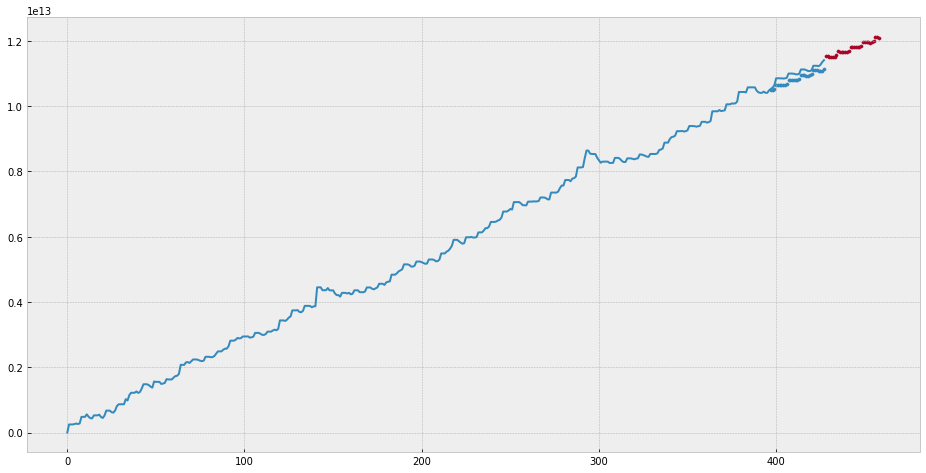

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(train_df['kas_kantor'].values)
plt.scatter(y_val.index, y_kk_val_pred, s=10)
plt.scatter((y_val.index+31)[-31:], y_kk_pred, s=10)
plt.show()

### kas_echannel

#### kas_echannel simple regression

##### Train

In [ ]:
X = acc_train_df.index.values
y = acc_train_df['kas_echannel_acc'].values

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.35)

X_train = X_train.reshape(-1, 1)
X_val = X_val.reshape(-1, 1)

y_train = y_train.reshape(-1, 1)
y_val = y_val.reshape(-1, 1)

scl_kk = MinMaxScaler(feature_range=(0.1, 1))
y_train = scl_kk.fit_transform(y_train).ravel()
y_val = scl_kk.transform(y_val).ravel()

In [ ]:
# train_size = 0.75
# N = len(X)
# train_idx = int(N * train_size // 1)

# X_train = X[:train_idx].reshape(-1, 1)
# X_val = X[train_idx:].reshape(-1, 1)

# y_train = y[:train_idx].reshape(-1, 1)
# y_val = y[train_idx:].reshape(-1, 1)

# scl_kk = StandardScaler()
# y_train = scl_kk.fit_transform(y_train).ravel()
# y_val = scl_kk.transform(y_val).ravel()

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor

In [ ]:
lr = LinearRegression()
svr = SVR()
rf = RandomForestRegressor()
knr = KNeighborsRegressor(n_neighbors=5)

In [ ]:
lr.fit(X_train, y_train)
svr.fit(X_train, y_train)
rf.fit(X_train, y_train)
knr.fit(X_train, y_train)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                    weights='uniform')

##### Evaluation

In [ ]:
y_val_lr_pred = lr.predict(X_val)
y_val_svr_pred = svr.predict(X_val)
y_val_rf_pred = rf.predict(X_val)
y_val_knr_pred = knr.predict(X_val)

In [ ]:
print(f'RMSLE lr: {np.sqrt(msle(y_val, y_val_lr_pred).numpy())}')
print(f'RMSLE svr: {np.sqrt(msle(y_val, y_val_svr_pred).numpy())}')
print(f'RMSLE rf: {np.sqrt(msle(y_val, y_val_rf_pred).numpy())}')
print(f'RMSLE knr: {np.sqrt(msle(y_val, y_val_knr_pred).numpy())}')

RMSLE lr: 0.006644550033040441
RMSLE svr: 0.040211527086897195
RMSLE rf: 0.0012572918716020735
RMSLE knr: 0.0017374136874526345


In [ ]:
def plot_result(y_val, y_val_pred, title):
    plt.figure(figsize=(16, 8))
    plt.title(title)
    plt.plot(y_val)
    plt.plot(y_val_pred)
    plt.show()

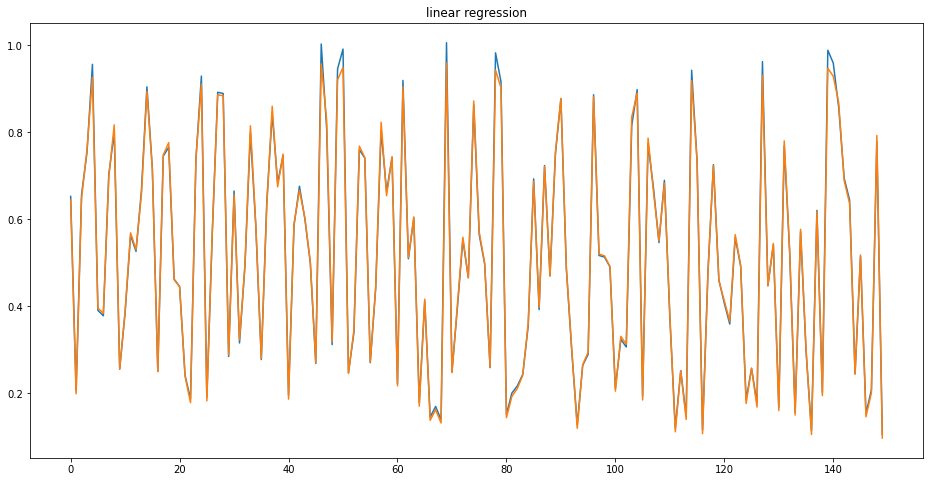

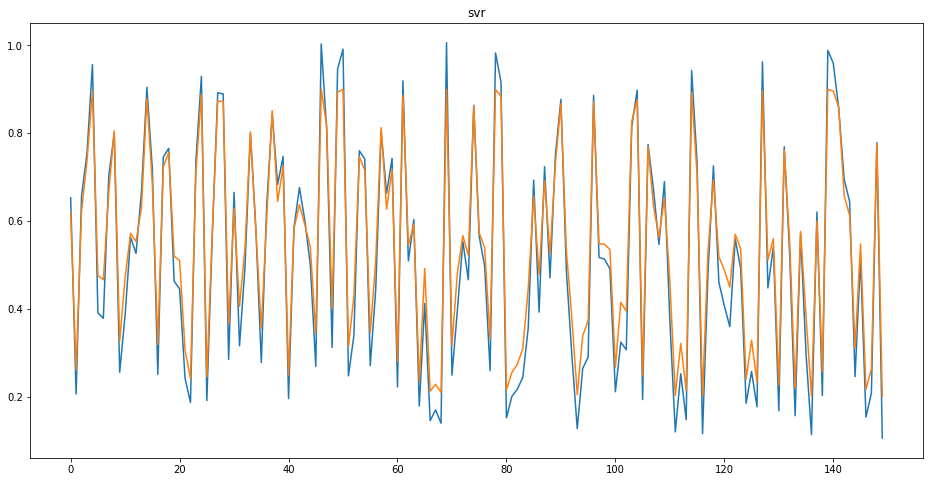

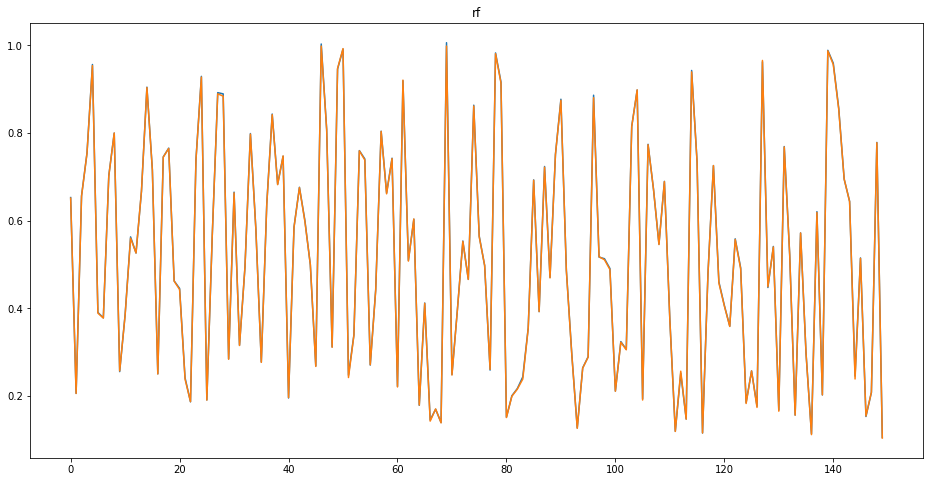

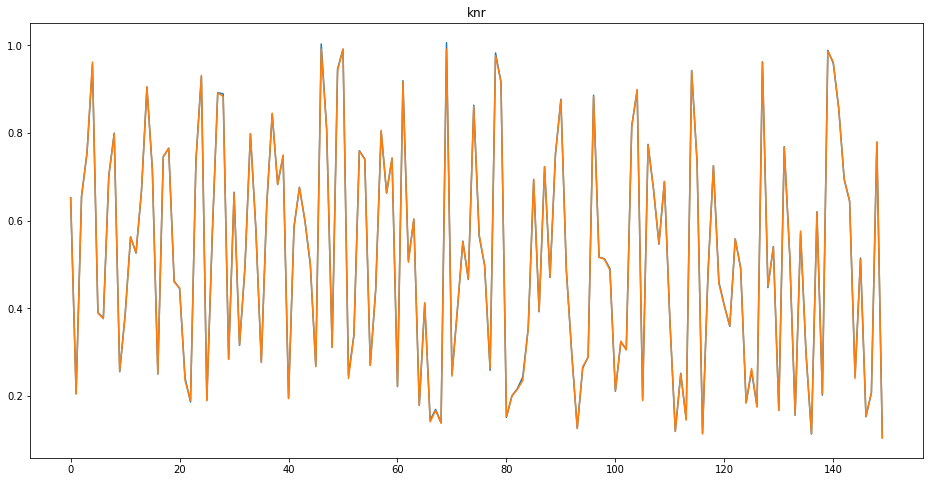

In [ ]:
plot_result(y_val, y_val_lr_pred, 'linear regression')
plot_result(y_val, y_val_svr_pred, 'svr')
plot_result(y_val, y_val_rf_pred, 'rf')
plot_result(y_val, y_val_knr_pred, 'knr')

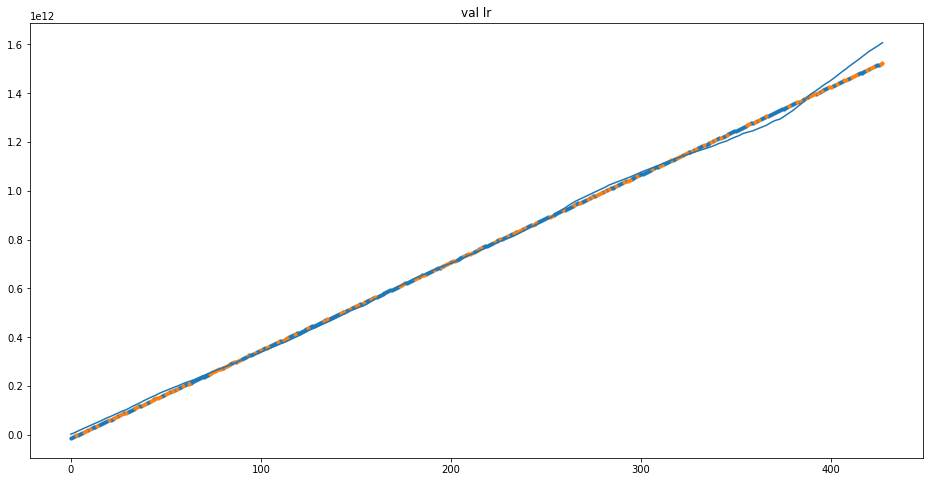

In [ ]:
plt.figure(figsize=(16, 8))
plt.title('val lr')
plt.plot(X, y)
plt.scatter(X_train, scl_kk.inverse_transform(lr.predict(X_train).reshape(-1, 1)), s=10)
plt.scatter(X_val, scl_kk.inverse_transform(y_val_lr_pred.reshape(-1, 1)), s=10)
plt.show()

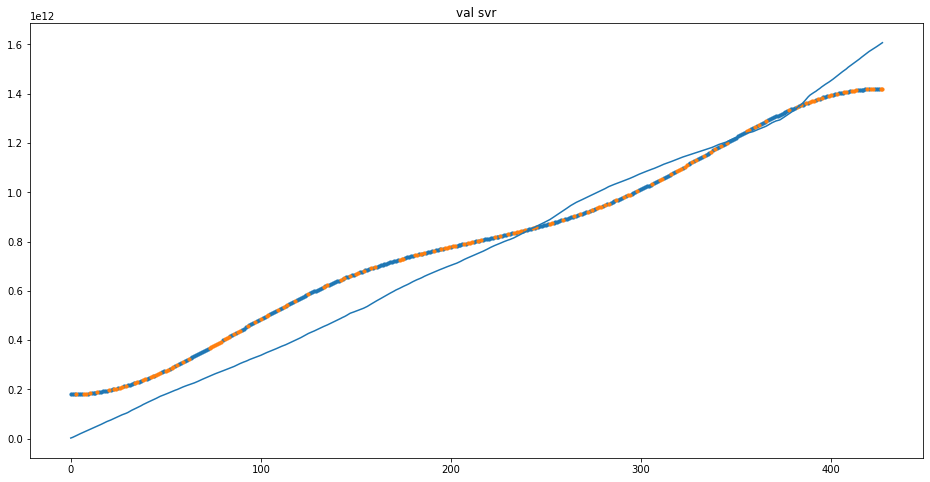

In [ ]:
plt.figure(figsize=(16, 8))
plt.title('val svr')
plt.plot(X, y)
plt.scatter(X_train, scl_kk.inverse_transform(svr.predict(X_train).reshape(-1, 1)), s=10)
plt.scatter(X_val, scl_kk.inverse_transform(y_val_svr_pred.reshape(-1, 1)), s=10)
plt.show()

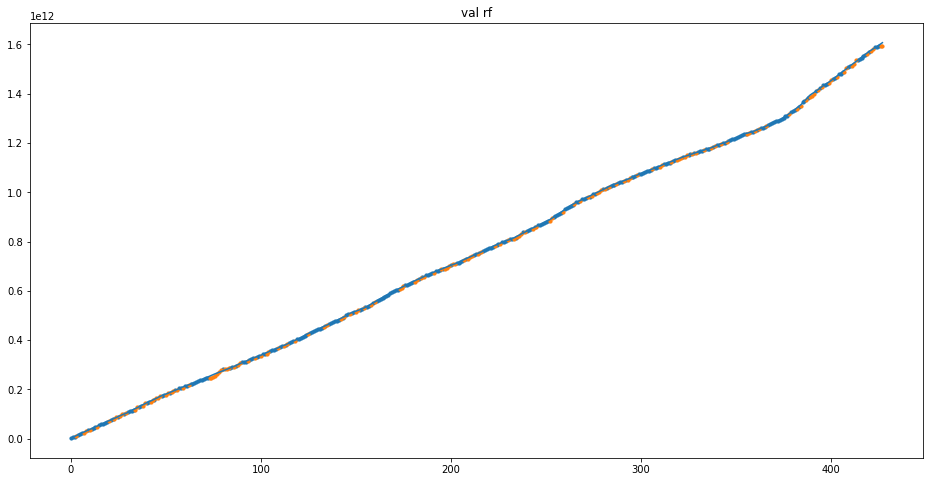

In [ ]:
plt.figure(figsize=(16, 8))
plt.title('val rf')
plt.plot(X, y)
plt.scatter(X_train, scl_kk.inverse_transform(rf.predict(X_train).reshape(-1, 1)), s=10)
plt.scatter(X_val, scl_kk.inverse_transform(y_val_rf_pred.reshape(-1, 1)), s=10)
plt.show()

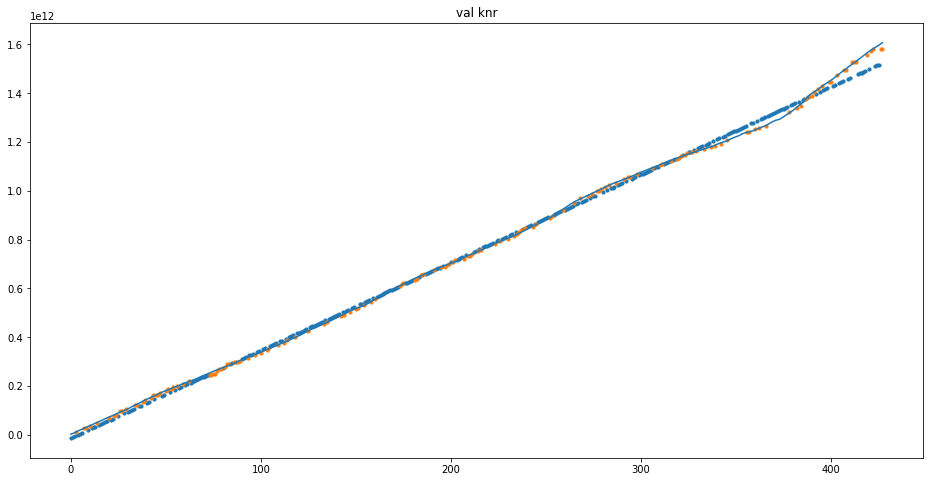

In [ ]:
plt.figure(figsize=(16, 8))
plt.title('val knr')
plt.plot(X, y)
plt.scatter(X_train, scl_kk.inverse_transform(lr.predict(X_train).reshape(-1, 1)), s=10)
plt.scatter(X_val, scl_kk.inverse_transform(y_val_knr_pred.reshape(-1, 1)), s=10)
plt.show()

In [ ]:
val_period = 31
y_real_val = train_df['kas_echannel'][-val_period:]
y_real_lr_acc_val = scl_kk.inverse_transform(knr.predict(X[-val_period:].reshape(-1, 1)).reshape(-1, 1))
y_real_lr_val = y_real_lr_acc_val - scl_kk.inverse_transform(knr.predict(X[-(val_period+1):-1].reshape(-1, 1)).reshape(-1, 1))

In [ ]:
y_real_val

397    5.209300e+09
398    4.667400e+09
399    5.145950e+09
400    5.357000e+09
401    5.621450e+09
402    6.167500e+09
403    5.877750e+09
404    6.535700e+09
405    5.999650e+09
406    5.905900e+09
407    5.385650e+09
408    5.677550e+09
409    6.922550e+09
410    5.744700e+09
411    5.714400e+09
412    5.410100e+09
413    5.704950e+09
414    5.453500e+09
415    5.864850e+09
416    6.474700e+09
417    5.835250e+09
418    6.127250e+09
419    5.919100e+09
420    5.757750e+09
421    4.802000e+09
422    4.843000e+09
423    5.085800e+09
424    4.994300e+09
425    5.181900e+09
426    5.419050e+09
427    5.271900e+09
Name: kas_echannel, dtype: float64

In [ ]:
y_real_lr_val

array([[ 9.81966000e+09],
       [ 0.00000000e+00],
       [ 8.81336000e+09],
       [ 0.00000000e+00],
       [ 8.91641000e+09],
       [ 9.07448000e+09],
       [ 9.32218000e+09],
       [ 4.88281250e-04],
       [ 9.69445000e+09],
       [ 9.60989000e+09],
       [ 0.00000000e+00],
       [ 4.88281250e-04],
       [ 1.15837900e+10],
       [ 1.15568300e+10],
       [ 1.16705900e+10],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 9.24049000e+09],
       [ 9.31700000e+09],
       [ 0.00000000e+00],
       [ 7.19578000e+09],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 1.76418600e+10],
       [ 0.00000000e+00],
       [ 8.54222000e+09],
       [-2.44140625e-04],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00],
       [ 0.00000000e+00]])

##### Prediction

In [ ]:
X_pred = np.array([i+X[-1] for i in range(1, 32)]).reshape(-1, 1)
y_lr_pred = scl_kk.inverse_transform(lr.predict(X_pred).reshape(-1, 1))
y_svr_pred = scl_kk.inverse_transform(svr.predict(X_pred).reshape(-1, 1))
y_rf_pred = scl_kk.inverse_transform(rf.predict(X_pred).reshape(-1, 1))
y_knr_pred = scl_kk.inverse_transform(knr.predict(X_pred).reshape(-1, 1))

In [ ]:
def plot_prediction(y_pred, title):
    plt.figure(figsize=(16, 8))
    plt.title(title)
    plt.plot(X, y)
    plt.scatter(X_pred, y_pred, s=10)
    plt.show()

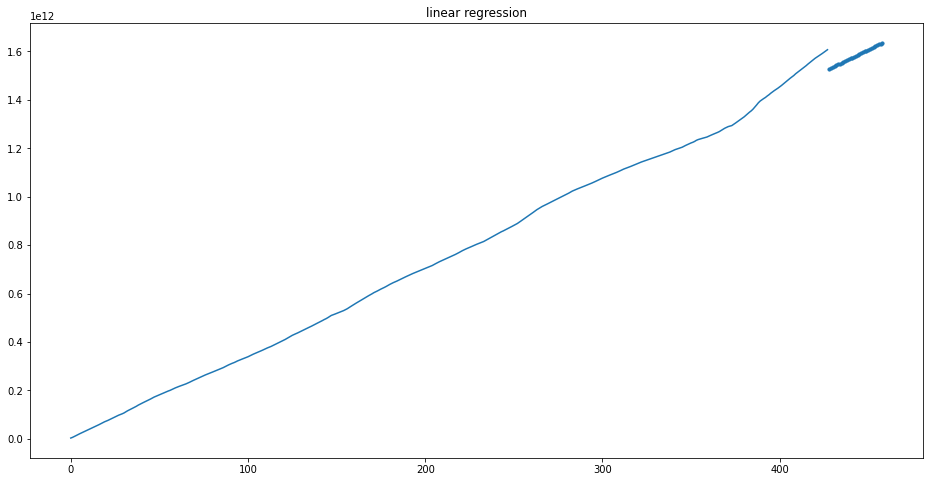

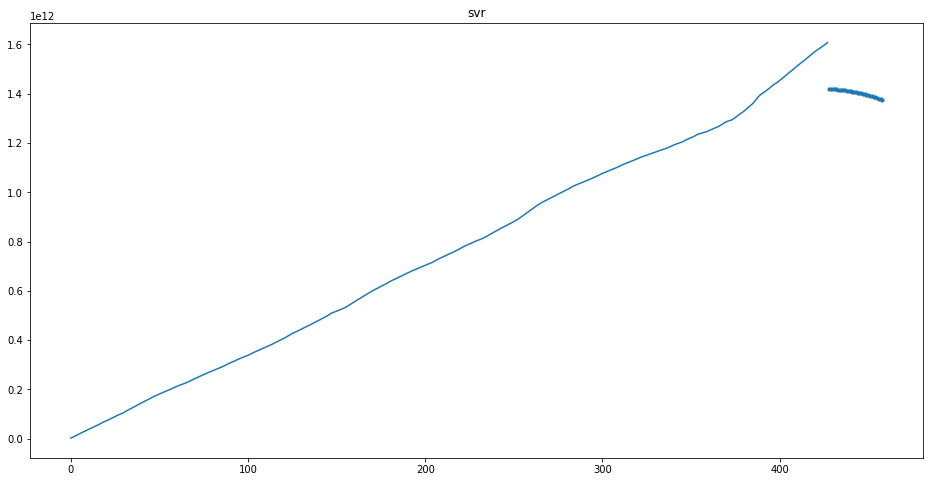

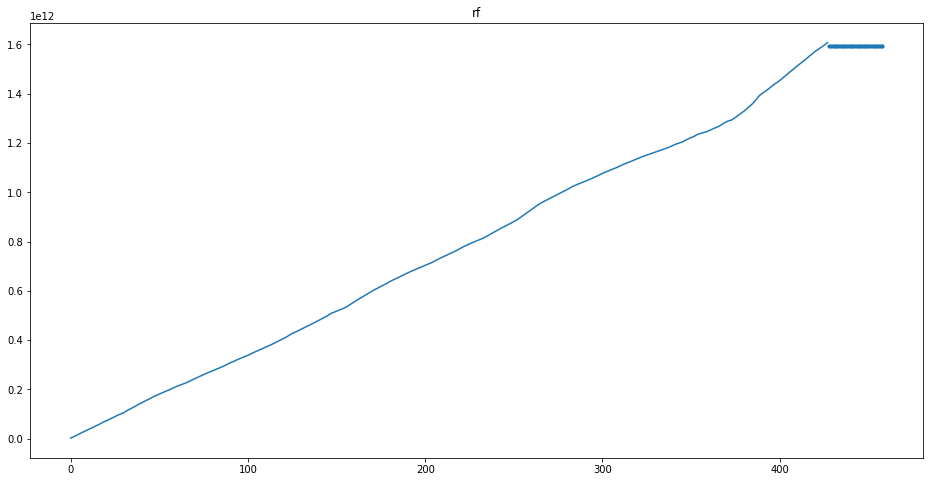

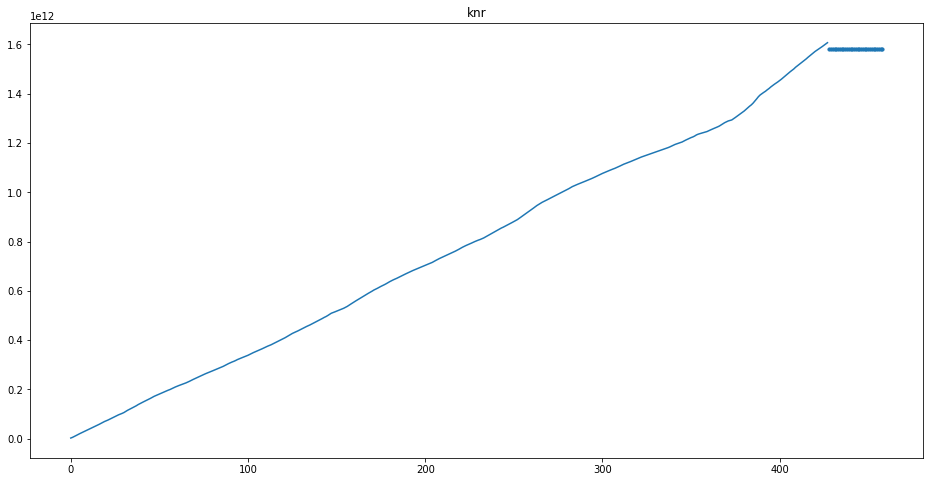

In [ ]:
plot_prediction(y_lr_pred, 'linear regression')
plot_prediction(y_svr_pred, 'svr')
plot_prediction(y_rf_pred, 'rf')
plot_prediction(y_knr_pred, 'knr')

#### kas_echannel diff

##### Feature Selection

In [ ]:
features = ['kas_echannel_diff']

In [ ]:
feat_diff_df = train_diff_df[1:].reset_index()

In [ ]:
feat_data = feat_diff_df[features].values

##### Normalize Data

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, Normalizer

In [ ]:
# train_size = 0.75
# train_idx = int(N * 0.75 // 1)
train_idx = N - 31

scl = MinMaxScaler()
# scl = Normalizer(norm='l2')
scl.fit(feat_data[:train_idx])
feat_data = scl.transform(feat_data)

##### Generate data

In [ ]:
N = len(feat_data)
T = 14

X = []
y = []

for i in range(T, N):
    X.append(feat_data[i-T:i])
    y.append(feat_data[i])

X = np.array(X)
y = np.array(y)

In [ ]:
print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

X shape: (413, 14, 1)
y shape: (413, 1)


##### Train Test Split

In [ ]:
X_train = X[:train_idx]
X_val = X[train_idx:]
y_train = y[:train_idx]
y_val = y[train_idx:]

print(f'X train shape: {X_train.shape}')
print(f'y train shape: {y_train.shape}')
print(f'X val shape: {X_val.shape}')
print(f'y val shape: {y_val.shape}')

X train shape: (396, 14, 1)
y train shape: (396, 1)
X val shape: (17, 14, 1)
y val shape: (17, 1)


##### Transformers

In [ ]:
# https://www.kaggle.com/shujian/transformer-with-lstm

import random, os, sys
import numpy as np
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.callbacks import *
from tensorflow.keras.initializers import *
import tensorflow as tf
from tensorflow.python.keras.layers import Layer
from keras import backend as K

try:
    from dataloader import TokenList, pad_to_longest
    # for transformer
except: pass



embed_size = T

class LayerNormalization(Layer):
    def __init__(self, eps=1e-6, **kwargs):
        self.eps = eps
        super(LayerNormalization, self).__init__(**kwargs)

    def get_config(self):

        config = super().get_config().copy()
        config.update({
            'eps': self.eps
        })
        return config

    def build(self, input_shape):
        self.gamma = self.add_weight(name='gamma', shape=input_shape[-1:],
                                     initializer=Ones(), trainable=True)
        self.beta = self.add_weight(name='beta', shape=input_shape[-1:],
                                    initializer=Zeros(), trainable=True)
        super(LayerNormalization, self).build(input_shape)
    def call(self, x):
        mean = K.mean(x, axis=-1, keepdims=True)
        std = K.std(x, axis=-1, keepdims=True)
        return self.gamma * (x - mean) / (std + self.eps) + self.beta
    def compute_output_shape(self, input_shape):
        return input_shape

class ScaledDotProductAttention():
    def __init__(self, d_model, attn_dropout=0.1):
        self.temper = np.sqrt(d_model)
        self.dropout = Dropout(attn_dropout)
    def __call__(self, q, k, v, mask):
        attn = Lambda(lambda x:K.batch_dot(x[0],x[1],axes=[2,2])/self.temper)([q, k])
        if mask is not None:
            mmask = Lambda(lambda x:(-1e+10)*(1-x))(mask)
            attn = Add()([attn, mmask])
        attn = Activation('softmax')(attn)
        attn = self.dropout(attn)
        output = Lambda(lambda x:K.batch_dot(x[0], x[1]))([attn, v])
        return output, attn

class MultiHeadAttention():
    # mode 0 - big martixes, faster; mode 1 - more clear implementation
    def __init__(self, n_head, d_model, d_k, d_v, dropout, mode=0, use_norm=True):
        self.mode = mode
        self.n_head = n_head
        self.d_k = d_k
        self.d_v = d_v
        self.dropout = dropout
        if mode == 0:
            self.qs_layer = Dense(n_head*d_k, use_bias=False)
            self.ks_layer = Dense(n_head*d_k, use_bias=False)
            self.vs_layer = Dense(n_head*d_v, use_bias=False)
        elif mode == 1:
            self.qs_layers = []
            self.ks_layers = []
            self.vs_layers = []
            for _ in range(n_head):
                self.qs_layers.append(TimeDistributed(Dense(d_k, use_bias=False)))
                self.ks_layers.append(TimeDistributed(Dense(d_k, use_bias=False)))
                self.vs_layers.append(TimeDistributed(Dense(d_v, use_bias=False)))
        self.attention = ScaledDotProductAttention(d_model)
        self.layer_norm = LayerNormalization() if use_norm else None
        self.w_o = TimeDistributed(Dense(d_model))

    def __call__(self, q, k, v, mask=None):
        d_k, d_v = self.d_k, self.d_v
        n_head = self.n_head

        if self.mode == 0:
            qs = self.qs_layer(q)  # [batch_size, len_q, n_head*d_k]
            ks = self.ks_layer(k)
            vs = self.vs_layer(v)

            def reshape1(x):
                s = tf.shape(x)   # [batch_size, len_q, n_head * d_k]
                x = tf.reshape(x, [s[0], s[1], n_head, d_k])
                x = tf.transpose(x, [2, 0, 1, 3])
                x = tf.reshape(x, [-1, s[1], d_k])  # [n_head * batch_size, len_q, d_k]
                return x
            qs = Lambda(reshape1)(qs)
            ks = Lambda(reshape1)(ks)
            vs = Lambda(reshape1)(vs)

            if mask is not None:
                mask = Lambda(lambda x:K.repeat_elements(x, n_head, 0))(mask)
            head, attn = self.attention(qs, ks, vs, mask=mask)

            def reshape2(x):
                s = tf.shape(x)   # [n_head * batch_size, len_v, d_v]
                x = tf.reshape(x, [n_head, -1, s[1], s[2]])
                x = tf.transpose(x, [1, 2, 0, 3])
                x = tf.reshape(x, [-1, s[1], n_head*d_v])  # [batch_size, len_v, n_head * d_v]
                return x
            head = Lambda(reshape2)(head)
        elif self.mode == 1:
            heads = []; attns = []
            for i in range(n_head):
                qs = self.qs_layers[i](q)
                ks = self.ks_layers[i](k)
                vs = self.vs_layers[i](v)
                head, attn = self.attention(qs, ks, vs, mask)
                heads.append(head); attns.append(attn)
            head = Concatenate()(heads) if n_head > 1 else heads[0]
            attn = Concatenate()(attns) if n_head > 1 else attns[0]

        outputs = self.w_o(head)
        outputs = Dropout(self.dropout)(outputs)
        if not self.layer_norm: return outputs, attn
        # outputs = Add()([outputs, q]) # sl: fix
        return self.layer_norm(outputs), attn

class PositionwiseFeedForward():
    def __init__(self, d_hid, d_inner_hid, dropout=0.1):
        self.w_1 = Conv1D(d_inner_hid, 1, activation='relu')
        self.w_2 = Conv1D(d_hid, 1)
        self.layer_norm = LayerNormalization()
        self.dropout = Dropout(dropout)
    def __call__(self, x):
        output = self.w_1(x)
        output = self.w_2(output)
        output = self.dropout(output)
        output = Add()([output, x])
        return self.layer_norm(output)

class EncoderLayer():
    def __init__(self, d_model, d_inner_hid, n_head, d_k, d_v, dropout=0.1):
        self.self_att_layer = MultiHeadAttention(n_head, d_model, d_k, d_v, dropout=dropout)
        self.pos_ffn_layer  = PositionwiseFeedForward(d_model, d_inner_hid, dropout=dropout)
    def __call__(self, enc_input, mask=None):
        output, slf_attn = self.self_att_layer(enc_input, enc_input, enc_input, mask=mask)
        output = self.pos_ffn_layer(output)
        return output, slf_attn


def GetPosEncodingMatrix(max_len, d_emb):
    pos_enc = np.array([
        [pos / np.power(10000, 2 * (j // 2) / d_emb) for j in range(d_emb)]
        if pos != 0 else np.zeros(d_emb)
            for pos in range(max_len)
            ])
    pos_enc[1:, 0::2] = np.sin(pos_enc[1:, 0::2]) # dim 2i
    pos_enc[1:, 1::2] = np.cos(pos_enc[1:, 1::2]) # dim 2i+1
    return pos_enc

def GetPadMask(q, k):
    ones = K.expand_dims(K.ones_like(q, 'float32'), -1)
    mask = K.cast(K.expand_dims(K.not_equal(k, 0), 1), 'float32')
    mask = K.batch_dot(ones, mask, axes=[2,1])
    return mask

def GetSubMask(s):
    len_s = tf.shape(s)[1]
    bs = tf.shape(s)[:1]
    mask = K.cumsum(tf.eye(len_s, batch_shape=bs), 1)
    return mask

class Transformer():
    def __init__(self, len_limit, embedding_matrix, d_model=embed_size, \
              d_inner_hid=512, n_head=10, d_k=64, d_v=64, layers=2, dropout=0.1, \
              share_word_emb=False, **kwargs):
        self.name = 'Transformer'
        self.len_limit = len_limit
        self.src_loc_info = False # True # sl: fix later
        self.d_model = d_model
        self.decode_model = None
        d_emb = d_model

        pos_emb = Embedding(len_limit, d_emb, trainable=False, \
                            weights=[GetPosEncodingMatrix(len_limit, d_emb)])

        i_word_emb = Embedding(max_features, d_emb, weights=[embedding_matrix]) # Add Kaggle provided embedding here

        self.encoder = Encoder(d_model, d_inner_hid, n_head, d_k, d_v, layers, dropout, \
                               word_emb=i_word_emb, pos_emb=pos_emb)


    def get_pos_seq(self, x):
        mask = K.cast(K.not_equal(x, 0), 'int32')
        pos = K.cumsum(K.ones_like(x, 'int32'), 1)
        return pos * mask

    def compile(self, active_layers=999):
        src_seq_input = Input(shape=(None, ))
        x = Embedding(max_features, embed_size, weights=[embedding_matrix])(src_seq_input)

        # LSTM before attention layers
        x = Bidirectional(LSTM(128, return_sequences=True))(x)
        x = Bidirectional(LSTM(64, return_sequences=True))(x)

        x, slf_attn = MultiHeadAttention(n_head=3, d_model=300, d_k=64, d_v=64, dropout=0.1)(x, x, x)

        avg_pool = GlobalAveragePooling1D()(x)
        max_pool = GlobalMaxPooling1D()(x)
        conc = concatenate([avg_pool, max_pool])
        conc = Dense(64, activation="relu")(conc)
        x = Dense(1, activation="sigmoid")(conc)


        self.model = Model(inputs=src_seq_input, outputs=x)
        self.model.compile(optimizer = 'adam', loss = Adam(lr=0.001), metrics=['accuracy'])

In [ ]:
def build_model():
    inp = Input(shape = (T, 1))

    # LSTM before attention layers
    x = Bidirectional(LSTM(128, return_sequences=True))(inp)
    x = Bidirectional(LSTM(64, return_sequences=True))(x)

    x, slf_attn = MultiHeadAttention(n_head=3, d_model=300, d_k=64, d_v=64, dropout=0.1)(x, x, x)

    avg_pool = GlobalAveragePooling1D()(x)
    max_pool = GlobalMaxPooling1D()(x)
    conc = concatenate([avg_pool, max_pool])
    conc = Dense(64, activation="relu")(conc)
    x = Dense(1)(conc)

    model = Model(inputs = inp, outputs = x)
    model.compile(
        loss = 'mse',
        #optimizer = Adam(lr = config["lr"], decay = config["lr_d"]),
        optimizer = Adam(lr=0.001))

    # Save entire model to a HDF5 file
    #model.save('my_model.h5')

    return model

##### Model Train

###### Non NN Model

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import TimeSeriesSplit, cross_val_score

In [ ]:
rfd_params = {
    'bootstrap': [True],
    'max_depth': [70],
    'max_features': [2, 3],
    'min_samples_leaf': [5],
    'min_samples_split': [12, 14, 16],
    'n_estimators': [300, 400]
}

xgbd_params = {
    'learning_rate': [0.03],
    'max_depth': [2],
    'min_child_weight': [5],
    'silent': [1],
    'subsample': [0.4, 0.45],
    'colsample_bytree': [0.55, 0.6, 0.65],
    'n_estimators': [110, 125, 150]
}

lgbmd_params = {
    'learning_rate': [0.1, 0.15, 0.2],
    'boosting_type': ['dart', 'gbdt'],
    'sub_feature': [0.8, 0.9, 1],
    'num_leaves': [3, 4, 5],
    'min_data': [6, 7, 8],
    'max_depth': [2, 3, 4],
    'n_estimators':[30, 40, 50, 80]
} #initialize parameters

tscv = TimeSeriesSplit(n_splits=5)

In [ ]:
rfd = RandomForestRegressor()
gbmd = GradientBoostingRegressor()
xgbd = XGBRegressor()
lgbmd = LGBMRegressor()
gsrfd = RandomForestRegressor(bootstrap= True,
 max_depth= 110,
 max_features= 3,
 min_samples_leaf= 3,
 min_samples_split= 8,
 n_estimators= 100)

gsxgbd = XGBRegressor(colsample_bytree= 0.7,
 learning_rate= 0.05,
 max_depth= 5,
 min_child_weight= 3,
 n_estimators= 650,
 silent= 1,
 subsample= 0.6)

gslgbmd = LGBMRegressor(boosting_type= 'gbdt',
 learning_rate= 0.1,
 max_depth= 5,
 min_data= 100,
 n_estimators= 50,
 num_leaves= 5,
 sub_feature= 1)

In [ ]:
gsrfd = GridSearchCV(rfd, rfd_params, cv=tscv, scoring=rmsle_scorer)
gsrfd.fit(X_train.reshape(-1, T), y_train.reshape(-1, ))
gsrfd_best = gsrfd.best_params_
gsrfd.best_params_

{'bootstrap': True,
 'max_depth': 70,
 'max_features': 3,
 'min_samples_leaf': 5,
 'min_samples_split': 14,
 'n_estimators': 300}

In [ ]:
gsxgbd = GridSearchCV(xgbd, xgbd_params, cv=tscv, scoring=rmsle_scorer)
gsxgbd.fit(X_train.reshape(-1, T), y_train.reshape(-1, ))
gsxgbd_best = gsxgbd.best_params_
gsxgbd.best_params_

{'colsample_bytree': 0.55,
 'learning_rate': 0.03,
 'max_depth': 2,
 'min_child_weight': 5,
 'n_estimators': 110,
 'silent': 1,
 'subsample': 0.45}

In [ ]:
gslgbmd = GridSearchCV(lgbmd, lgbmd_params, cv=tscv, scoring=rmsle_scorer)
gslgbmd.fit(X_train.reshape(-1, T), y_train.reshape(-1, ))
gslgbmd_best = gslgbmd.best_params_
gslgbmd.best_params_

{'boosting_type': 'gbdt',
 'learning_rate': 0.1,
 'max_depth': 2,
 'min_data': 6,
 'n_estimators': 30,
 'num_leaves': 3,
 'sub_feature': 0.8}

In [ ]:
rfd.fit(X_train.reshape(-1, T), y_train.reshape(-1, ))
gbmd.fit(X_train.reshape(-1, T), y_train.reshape(-1, ))
xgbd.fit(X_train.reshape(-1, T), y_train.reshape(-1, ))
lgbmd.fit(X_train.reshape(-1, T), y_train.reshape(-1, ))

[09:45:31] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.


LGBMRegressor(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
              importance_type='split', learning_rate=0.1, max_depth=-1,
              min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
              n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
              random_state=None, reg_alpha=0.0, reg_lambda=0.0, silent=True,
              subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

In [ ]:
def val_prediction(model):
    t_pred = y_val.shape[0]
    y_val_pred = np.zeros(y_val.shape)

    X_val_pred = X_val[0].copy()

    for i in range(t_pred):
        y_val_pred[i] = model.predict(X_val_pred.reshape(-1, T))
        X_val_pred[:-1] = X_val_pred[1:]
        X_val_pred[-1][:-1] = X_val_pred[-1][1:]
        X_val_pred[-1][-1] = y_val_pred[i]

    return y_val_pred

In [ ]:
rfd_val_pred = val_prediction(rfd)
gbmd_val_pred = val_prediction(gbmd)
xgbd_val_pred = val_prediction(xgbd)
lgbmd_val_pred = val_prediction(lgbmd)

gsrfd_val_pred = val_prediction(gsrfd)
gsxgbd_val_pred = val_prediction(gsxgbd)
gslgbmd_val_pred = val_prediction(gslgbmd)

In [ ]:
print(f'RMSLE rf: {np.sqrt(msle(y_val, rfd_val_pred).numpy())}')
print(f'RMSLE gbm: {np.sqrt(msle(y_val, gbmd_val_pred).numpy())}')
print(f'RMSLE xgb: {np.sqrt(msle(y_val, xgbd_val_pred).numpy())}')
print(f'RMSLE lgbm: {np.sqrt(msle(y_val, lgbmd_val_pred).numpy())}')
print(f'RMSLE gsrf: {np.sqrt(msle(y_val, gsrfd_val_pred).numpy())}')
print(f'RMSLE gsxgb: {np.sqrt(msle(y_val, gsxgbd_val_pred).numpy())}')
print(f'RMSLE gslgbm: {np.sqrt(msle(y_val, gslgbmd_val_pred).numpy())}')

RMSLE rf: 0.08803997066881426
RMSLE gbm: 0.09622077203188889
RMSLE xgb: 0.10315765257670294
RMSLE lgbm: 0.07851808719664981
RMSLE gsrf: 0.08369150217377942
RMSLE gsxgb: 0.08097572962014707
RMSLE gslgbm: 0.0825596294378724


In [ ]:
# kas_echannel
def plot_val(y_val, y_val_pred):
    plt.figure(figsize=(16, 8))
    plt.plot(y_val)
    plt.plot(y_val_pred)
    plt.show()

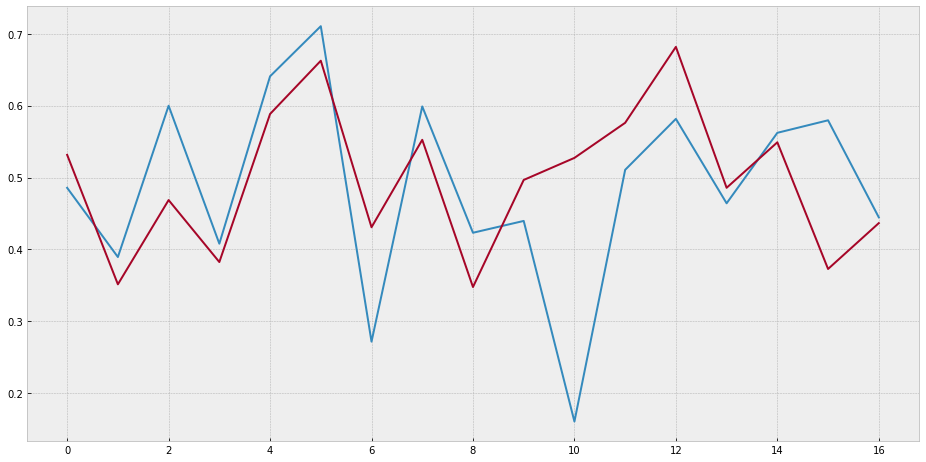

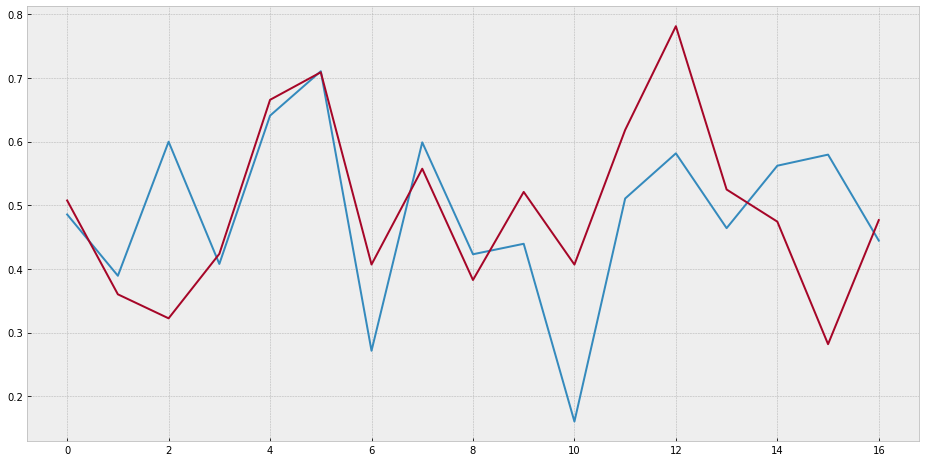

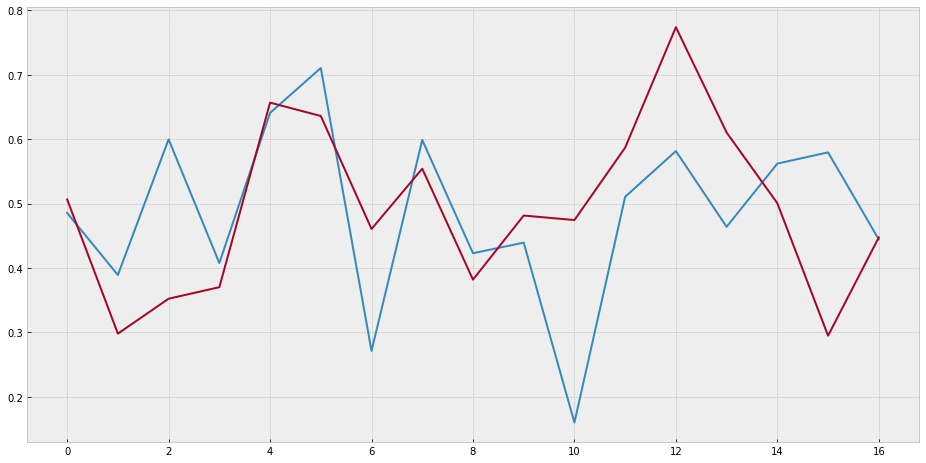

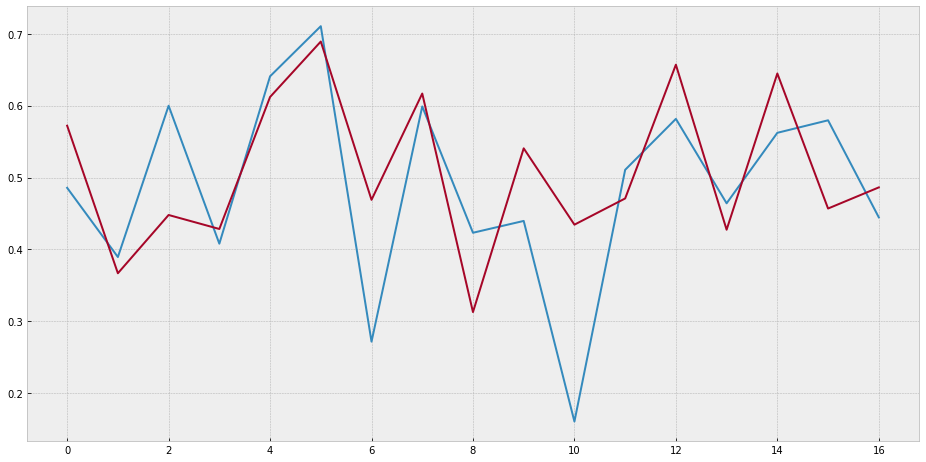

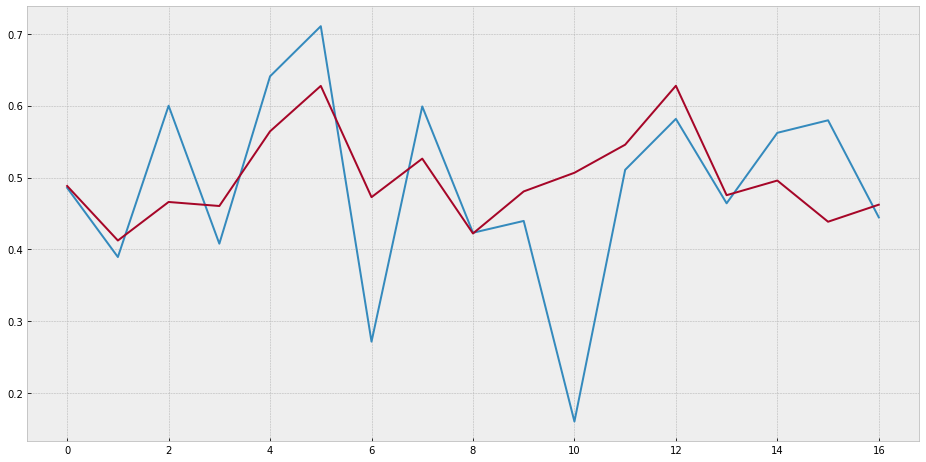

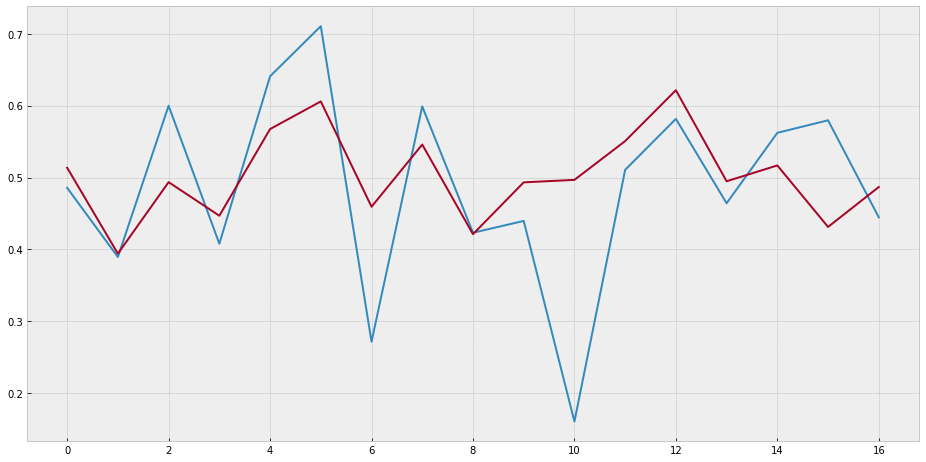

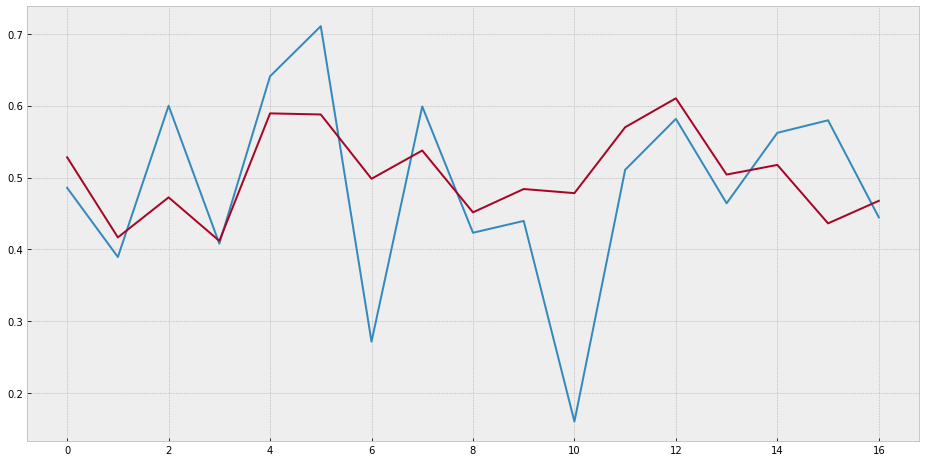

In [ ]:
plot_val(y_val, rfd_val_pred)
plot_val(y_val, gbmd_val_pred)
plot_val(y_val, xgbd_val_pred)
plot_val(y_val, lgbmd_val_pred)
plot_val(y_val, gsrfd_val_pred)
plot_val(y_val, gsxgbd_val_pred)
plot_val(y_val, gslgbmd_val_pred)

In [ ]:
rfd_real_val_pred = scl.inverse_transform(rfd_val_pred)
gbmd_real_val_pred = scl.inverse_transform(gbmd_val_pred)
xgbd_real_val_pred = scl.inverse_transform(xgbd_val_pred)
lgbmd_real_val_pred = scl.inverse_transform(lgbmd_val_pred)

gsrfd_real_val_pred = scl.inverse_transform(gsrfd_val_pred)
gsxgbd_real_val_pred = scl.inverse_transform(gsxgbd_val_pred)
gslgbmd_real_val_pred = scl.inverse_transform(gslgbmd_val_pred)

In [ ]:
def plot_real_val(model, y_val_pred):
    idx_val = np.array([i for i in range(N-len(y_val), N)])
    idx_train = np.array([i for i in range(T, N-len(y_val))])
    plt.figure(figsize=(16, 8))
    plt.plot(feat_diff_df[features].values)
    plt.plot(idx_train, scl.inverse_transform(model.predict(X_train.reshape(-1, T)).reshape(-1, 1)))
    plt.plot(idx_val, y_val_pred)
    plt.show()

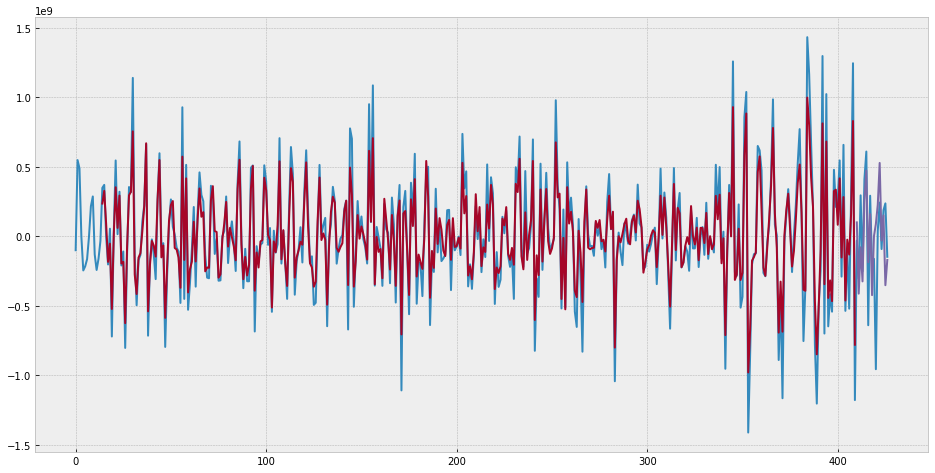

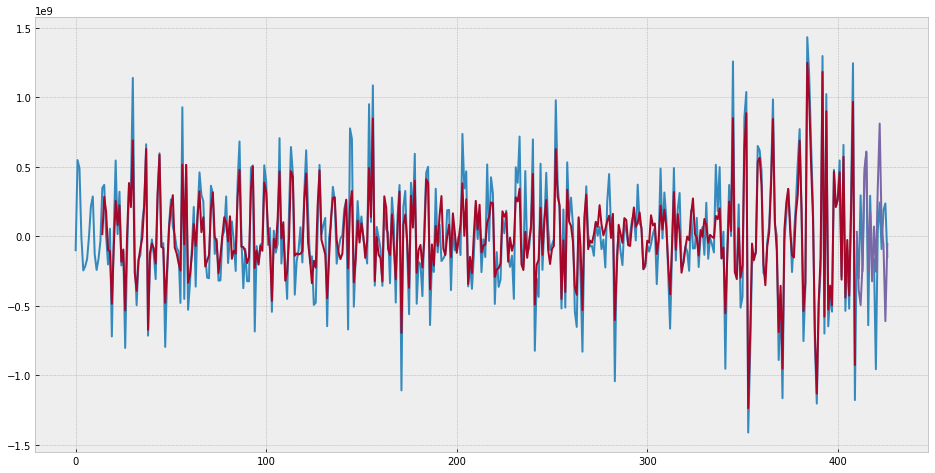

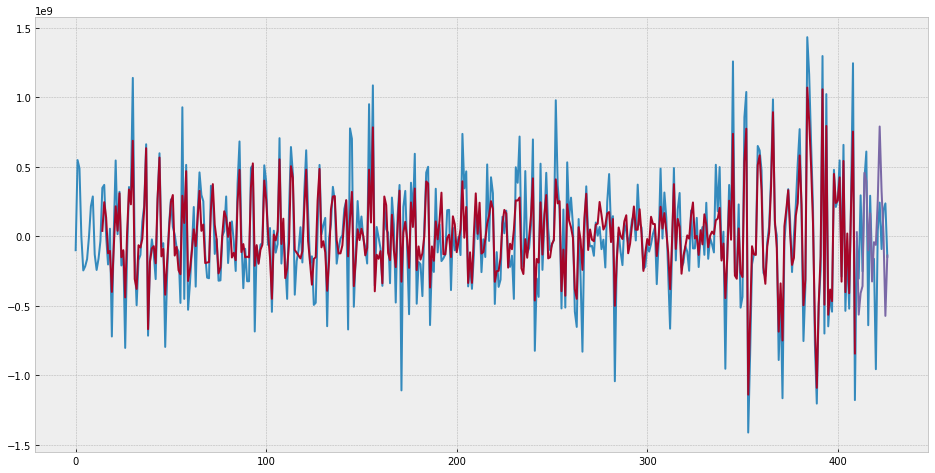

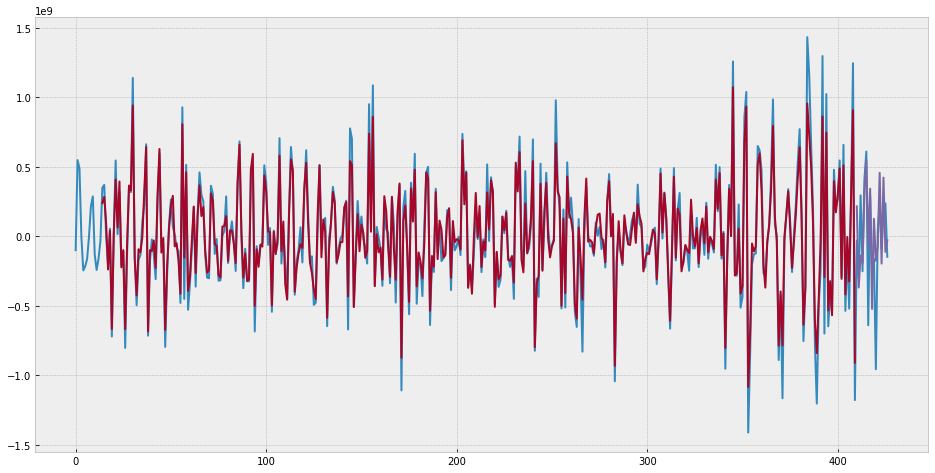

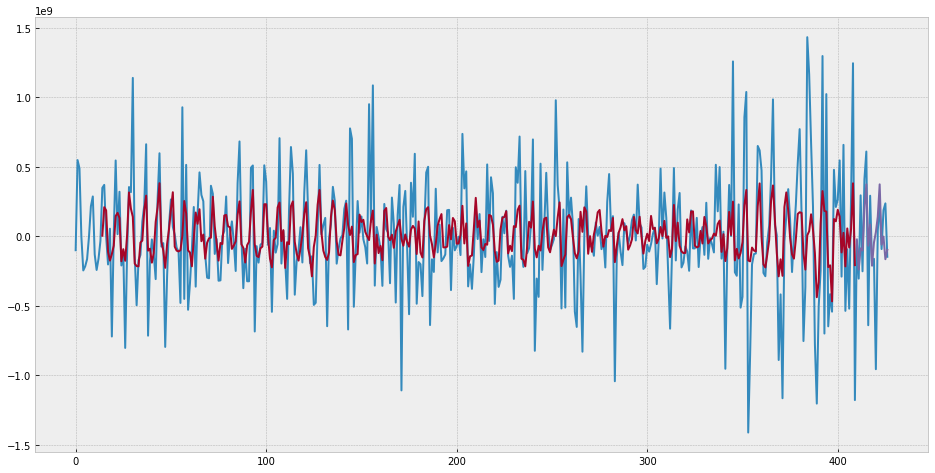

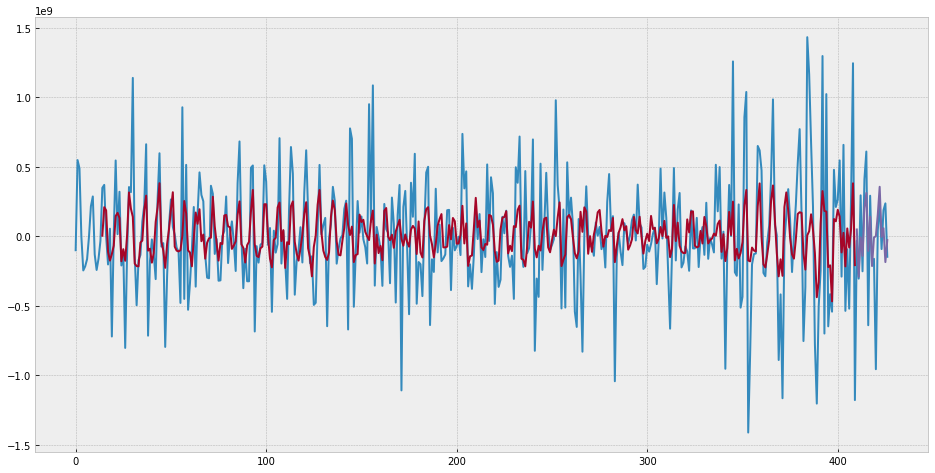

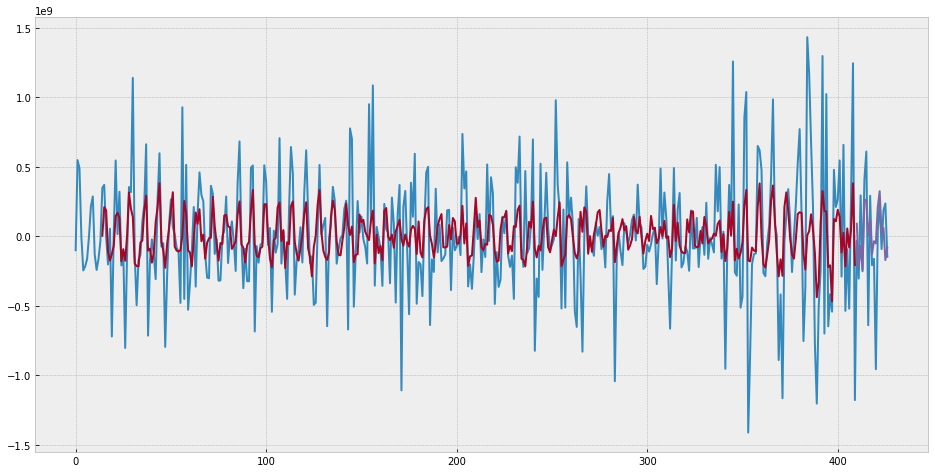

In [ ]:
plot_real_val(rfd, rfd_real_val_pred)
plot_real_val(gbmd, gbmd_real_val_pred)
plot_real_val(xgbd, xgbd_real_val_pred)
plot_real_val(lgbmd, lgbmd_real_val_pred)
plot_real_val(gslgbmd, gsrfd_real_val_pred)
plot_real_val(gslgbmd, gsxgbd_real_val_pred)
plot_real_val(gslgbmd, gslgbmd_real_val_pred)

In [ ]:
tscv = TimeSeriesSplit(n_splits=15)

cv_gbm = GradientBoostingRegressor()
cv_xgb = XGBRegressor().set_params(**gsxgbd_best)
cv_rf = RandomForestRegressor().set_params(**gsrfd_best)
cv_lgbm = LGBMRegressor().set_params(**gslgbmd_best)

scv_r_gbm = cross_val_score(cv_gbm, X_train.reshape(-1, T), y_train.reshape(-1, ), cv=tscv, verbose=True, scoring=rmsle_scorer, n_jobs=-1)
scv_r_xgb = cross_val_score(cv_xgb, X_train.reshape(-1, T), y_train.reshape(-1, ), cv=tscv, verbose=True, scoring=rmsle_scorer, n_jobs=-1)
scv_r_rf = cross_val_score(cv_rf, X_train.reshape(-1, T), y_train.reshape(-1, ), cv=tscv, verbose=True, scoring=rmsle_scorer, n_jobs=-1)
scv_r_lgbm = cross_val_score(cv_lgbm, X_train.reshape(-1, T), y_train.reshape(-1, ), cv=tscv, verbose=True, scoring=rmsle_scorer, n_jobs=-1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:    1.2s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:    0.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:    5.3s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  15 out of  15 | elapsed:    0.1s finished


In [ ]:
print("GBM Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_gbm.mean()*100, scv_r_gbm.std()*100))
print("XGB Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_xgb.mean()*100, scv_r_xgb.std()*100))
print("Random Forest Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_rf.mean()*100, scv_r_rf.std()*100))
print("LGBM Mean roc: %.2f%%  Standard Deviation %.2f%%" % (scv_r_lgbm.mean()*100, scv_r_lgbm.std()*100))

GBM Mean roc: -9.24%  Standard Deviation 2.92%
XGB Mean roc: -8.76%  Standard Deviation 2.97%
Random Forest Mean roc: -8.68%  Standard Deviation 2.96%
LGBM Mean roc: -8.82%  Standard Deviation 2.94%


In [ ]:
def make_predictions(model):
    t_pred = 31
    X_diff_pred = X[-1]
    y_diff_pred = np.zeros(t_pred)
    for i in range(t_pred):
        y_diff_pred[i] = model.predict(X_diff_pred.reshape(-1, T))
        X_diff_pred[:-1] = X_diff_pred[1:]
        X_diff_pred[-1][:-1] = X_diff_pred[-1][1:]
        X_diff_pred[-1][-1] = y_diff_pred[i]

    y_diff_pred = scl.inverse_transform(y_diff_pred.reshape(-1, 1))
    y_pred = np.zeros(t_pred)
    X_pred = train_df['kas_echannel'].values[-1]
    for i in range(t_pred):
        y_pred[i] = X_pred + y_diff_pred[i]
        X_pred = y_pred[i]

    return y_pred

In [ ]:
def plot_predictions(y_pred):
    t_pred = 31
    idx_pred = [i+train_df.index[-1] for i in range(t_pred)]
    plt.figure(figsize=(16, 8))
    plt.plot(train_df['kas_echannel'].values)
    plt.plot(idx_pred, y_pred)
    plt.show()

In [ ]:
rfd_pred = make_predictions(rfd)
gbmd_pred = make_predictions(gbmd)
xgbd_pred = make_predictions(xgbd)
lgbmd_pred = make_predictions(lgbmd)

gsrfd_pred = make_predictions(gsrfd)
gsxgbd_pred = make_predictions(gsxgbd)
gslgbmd_pred = make_predictions(gslgbmd)

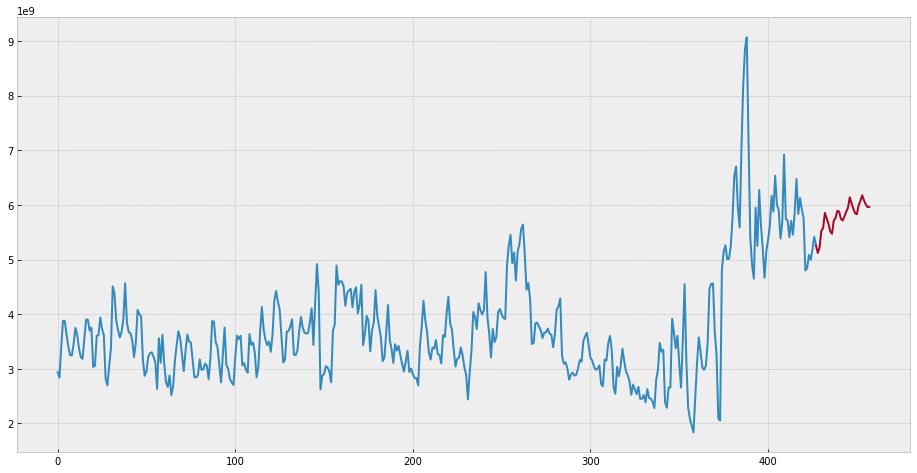

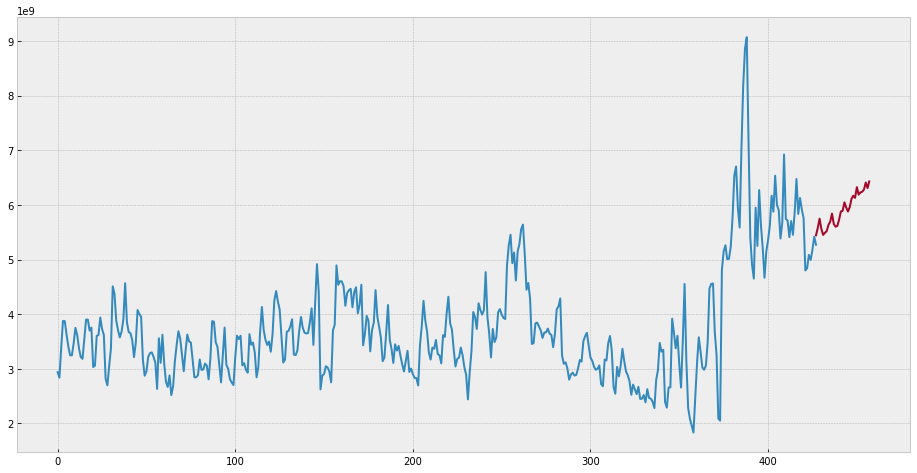

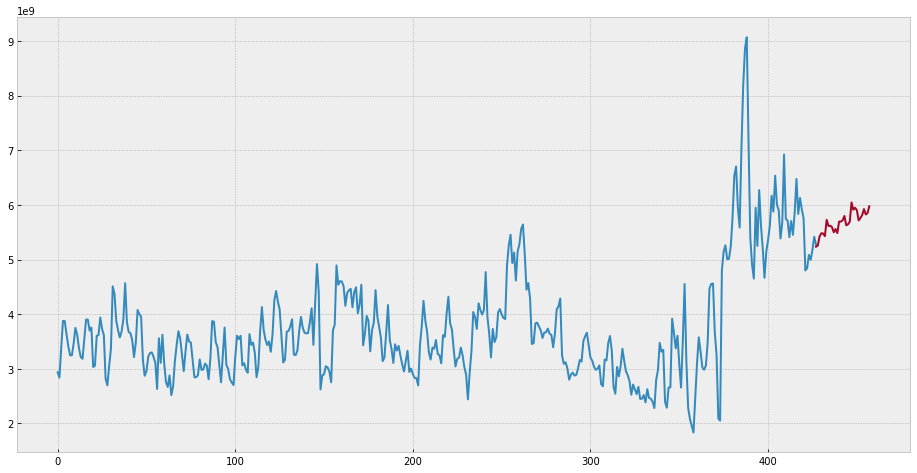

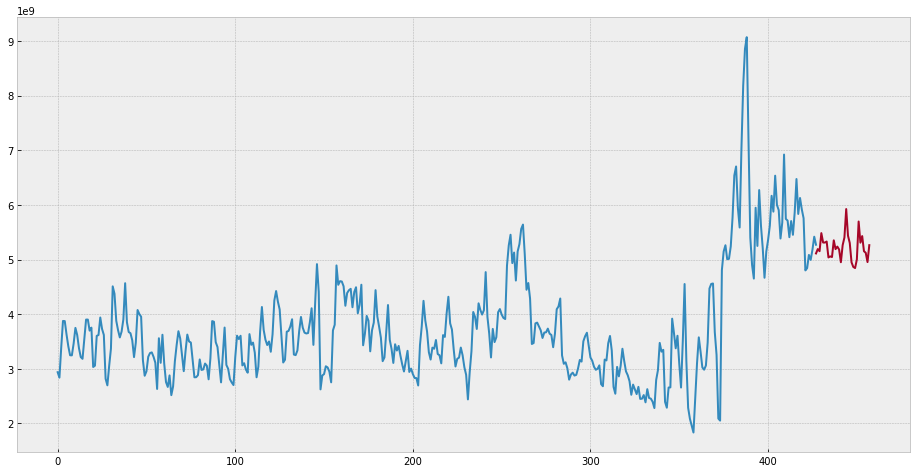

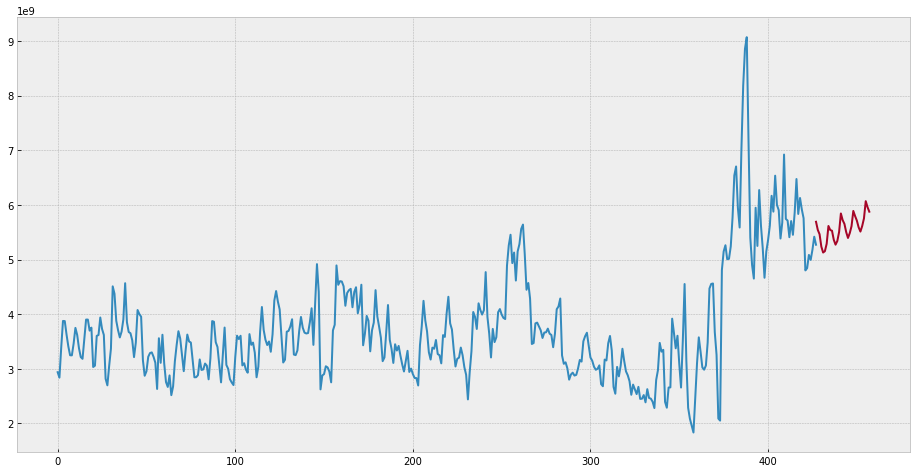

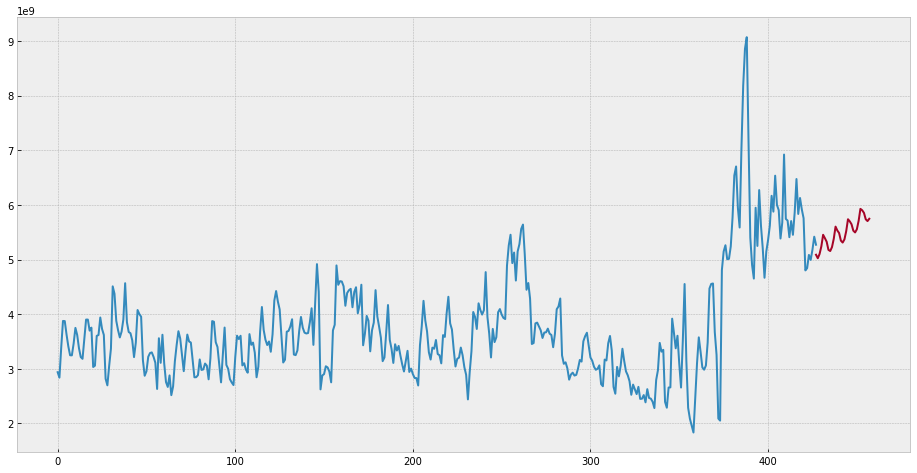

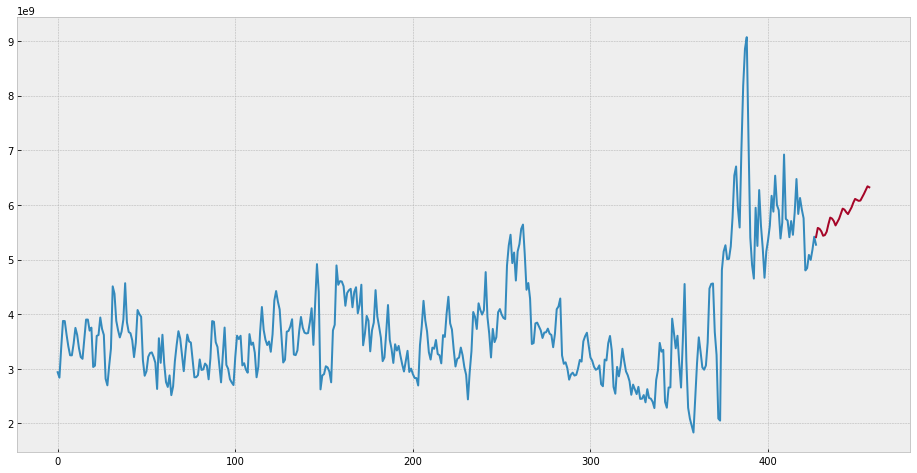

In [ ]:
plot_predictions(rfd_pred)
plot_predictions(gbmd_pred)
plot_predictions(xgbd_pred)
plot_predictions(lgbmd_pred)
plot_predictions(gsrfd_pred)
plot_predictions(gsxgbd_pred)
plot_predictions(gslgbmd_pred)

###### NN Model

In [ ]:
# i = Input(shape=X_train.shape[1:])
# x = Bidirectional(LSTM(50, activation='relu'))(i)
# x = Bidirectional(LSTM(50, activation='relu'))(i)
# x = LSTM(20)(i)
# x = Dense(1)(x)

mke = build_model()
# mke = Model(i, x)
mke.summary()

Model: "model_17"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_18 (InputLayer)           [(None, 14, 1)]      0                                            
__________________________________________________________________________________________________
bidirectional_21 (Bidirectional (None, 14, 256)      133120      input_18[0][0]                   
__________________________________________________________________________________________________
bidirectional_22 (Bidirectional (None, 14, 128)      164352      bidirectional_21[0][0]           
__________________________________________________________________________________________________
dense_57 (Dense)                (None, 14, 192)      24576       bidirectional_22[0][0]           
___________________________________________________________________________________________

In [ ]:
# mke.compile(
#     loss=root_mean_squared_log_error,
#     # loss=tf.keras.losses.MeanSquaredLogarithmicError(),
#     optimizer=Adam(lr=0.001)
# )

In [ ]:
r = mke.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=10)

Epoch 1/10
13/13 [==============================] - 10s 240ms/step - loss: 7.8066 - val_loss: 0.9882
Epoch 2/10
13/13 [==============================] - 1s 72ms/step - loss: 0.2360 - val_loss: 0.1979
Epoch 3/10
13/13 [==============================] - 1s 71ms/step - loss: 0.0545 - val_loss: 0.0746
Epoch 4/10
13/13 [==============================] - 1s 75ms/step - loss: 0.0392 - val_loss: 0.0511
Epoch 5/10
13/13 [==============================] - 1s 73ms/step - loss: 0.0359 - val_loss: 0.0394
Epoch 6/10
13/13 [==============================] - 1s 71ms/step - loss: 0.0318 - val_loss: 0.0107
Epoch 7/10
13/13 [==============================] - 1s 72ms/step - loss: 0.0287 - val_loss: 0.0235
Epoch 8/10
13/13 [==============================] - 1s 69ms/step - loss: 0.0239 - val_loss: 0.0111
Epoch 9/10
13/13 [==============================] - 1s 75ms/step - loss: 0.0212 - val_loss: 0.0126
Epoch 10/10
13/13 [==============================] - 1s 70ms/step - loss: 0.0208 - val_loss: 0.0093


##### Evaluation

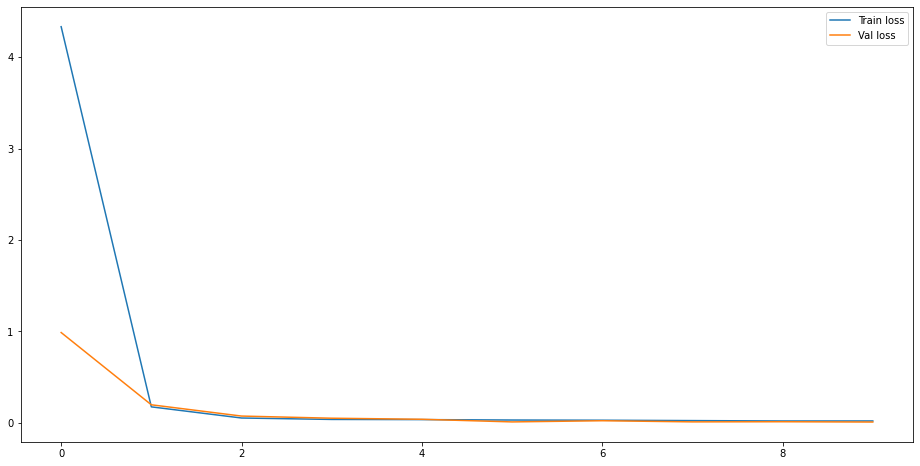

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(r.history['loss'], label='Train loss')
plt.plot(r.history['val_loss'], label='Val loss')
plt.legend()
plt.show()

In [ ]:
t_pred = y_val.shape[0]
y_val_pred = np.zeros(y_val.shape)

X_val_pred = X_val[0].copy()

for i in range(t_pred):
    y_val_pred[i] = mke.predict(X_val_pred.reshape(-1, T, 1))
    X_val_pred[:-1] = X_val_pred[1:]
    X_val_pred[-1][:-1] = X_val_pred[-1][1:]
    X_val_pred[-1][-1] = y_val_pred[i]

In [ ]:
# y_val_pred[y_val_pred<0] = 0
y_val_pred

array([[0.34929013],
       [0.34809208],
       [0.34731343],
       [0.34839034],
       [0.34921372],
       [0.3502728 ],
       [0.35169736],
       [0.35185921],
       [0.35342386],
       [0.35295412],
       [0.35341221],
       [0.35350776],
       [0.35523468],
       [0.35793763],
       [0.35603815],
       [0.35599047],
       [0.35591891]])

In [ ]:
print(f'RMSLE: {np.sqrt(msle(y_val, y_val_pred).numpy())}')

RMSLE: 0.06879855833413566


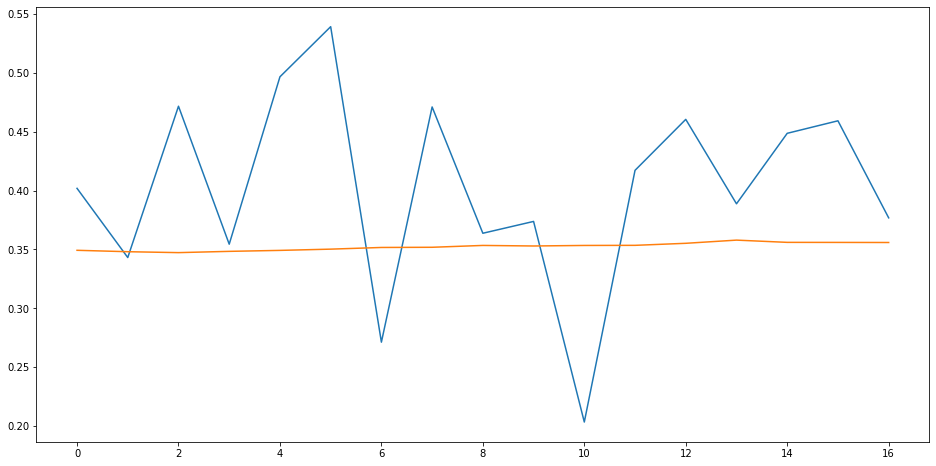

In [ ]:
# kas_echannel
plt.figure(figsize=(16, 8))
plt.plot(y_val)
plt.plot(y_val_pred)
plt.show()

In [ ]:
y_val_pred = scl.inverse_transform(y_val_pred)
y_val_pred

array([[-2.75670660e+08],
       [-2.81253888e+08],
       [-2.84882570e+08],
       [-2.79863914e+08],
       [-2.76026764e+08],
       [-2.71091163e+08],
       [-2.64452399e+08],
       [-2.63698108e+08],
       [-2.56406439e+08],
       [-2.58595565e+08],
       [-2.56460744e+08],
       [-2.56015475e+08],
       [-2.47967571e+08],
       [-2.35371141e+08],
       [-2.44223197e+08],
       [-2.44445415e+08],
       [-2.44778881e+08]])

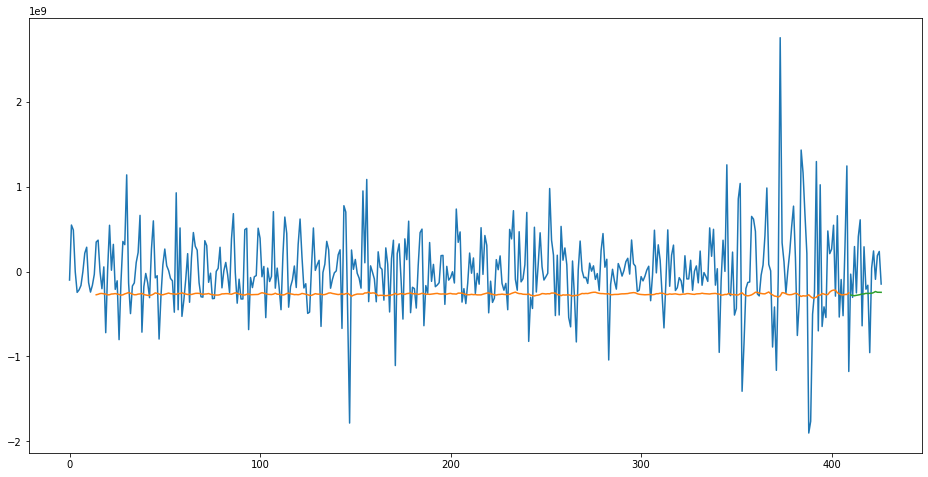

In [ ]:
idx_val = np.array([i for i in range(N-len(y_val), N)])
idx_train = np.array([i for i in range(T, N-len(y_val))])
plt.figure(figsize=(16, 8))
plt.plot(feat_diff_df[features].values)
plt.plot(idx_train, scl.inverse_transform(mke.predict(X_train)))
plt.plot(idx_val, y_val_pred)
plt.show()

In [ ]:
y_val_ke = train_df['kas_echannel'][-(len(y_val)):].values.reshape(-1, 1)
# y_val_ke_pred = train_df['kas_echannel'][N-len(y_val):N].values.reshape(-1, 1) + y_val_pred
y_val_ke_pred = np.zeros(len(y_val_ke))
for i in range(len(y_val_ke)):
    if i == 0:
        y_val_ke_pred[i] = y_val_ke[i] + y_val_pred[i]
    else:
        y_val_ke_pred[i] = y_val_ke_pred[i-1] + y_val_pred[i]

In [ ]:
print(f'RMSLE: {np.sqrt(msle(y_val_ke, y_val_ke_pred).numpy())}')

RMSLE: 0.7409589939869217


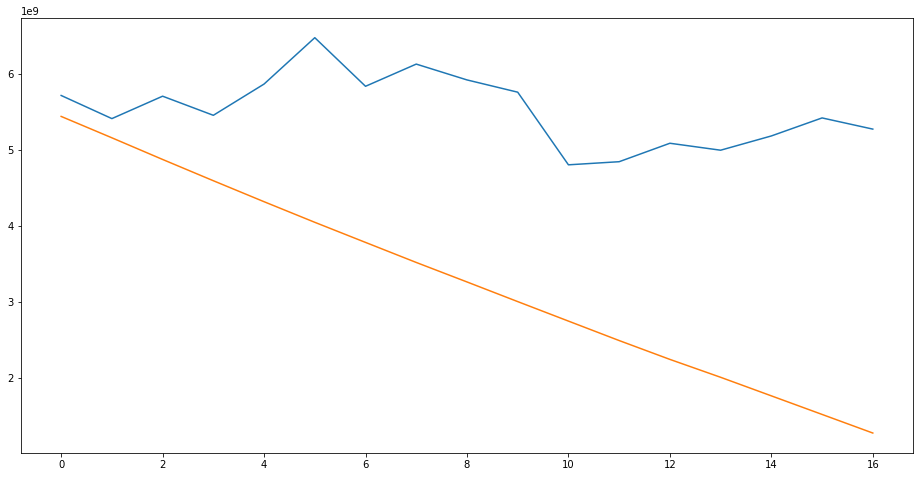

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(y_val_ke)
plt.plot(y_val_ke_pred)
plt.show()

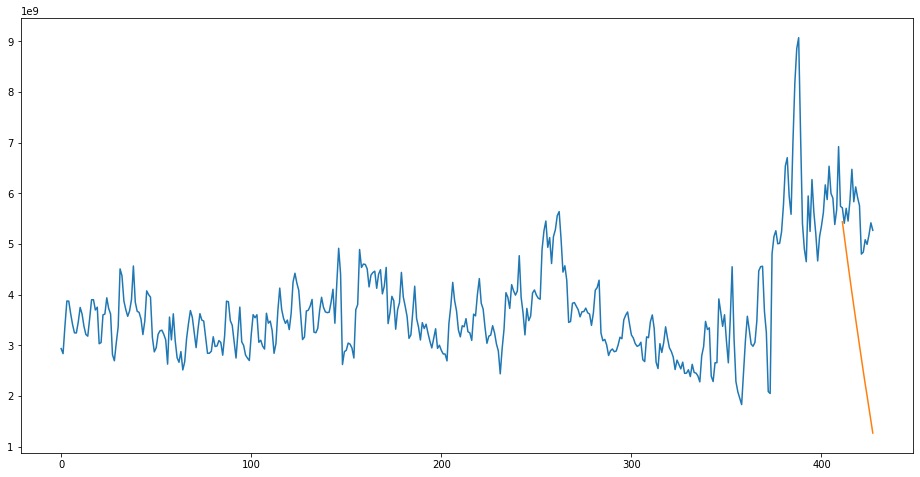

In [ ]:
idx_val = np.array([i for i in range(len(train_df)-len(y_val_ke), len(train_df))])
idx_train = np.array([i for i in range(T, len(train_df)-len(y_val_ke))])
plt.figure(figsize=(16, 8))
plt.plot(train_df['kas_echannel'].values)
plt.plot(idx_val, y_val_ke_pred)
plt.show()

##### Prediction

In [ ]:
t_pred = 31
X_diff_pred = X[-1]
y_diff_pred = np.zeros(t_pred)
for i in range(t_pred):
    y_diff_pred[i] = mke.predict(X_diff_pred.reshape(-1, T, 1))
    X_diff_pred[:-1] = X_diff_pred[1:]
    X_diff_pred[-1][:-1] = X_diff_pred[-1][1:]
    X_diff_pred[-1][-1] = y_diff_pred[i]

y_diff_pred = scl.inverse_transform(y_diff_pred.reshape(-1, 1))
y_pred = np.zeros(t_pred)
X_pred = train_df['kas_echannel'].values[-1]
for i in range(t_pred):
    y_pred[i] = X_pred + y_diff_pred[i]
    X_pred = y_pred[i]

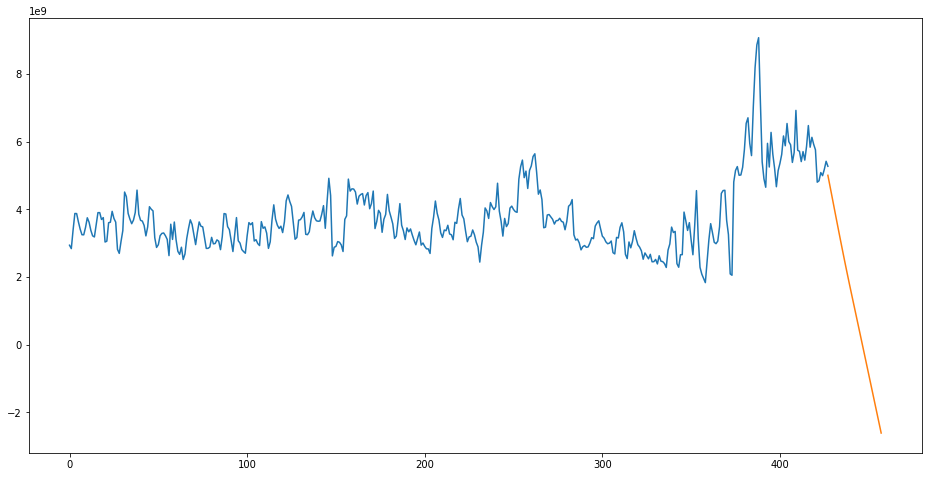

In [ ]:
idx_pred = [i+train_df.index[-1] for i in range(t_pred)]
plt.figure(figsize=(16, 8))
plt.plot(train_df['kas_echannel'].values)
plt.plot(idx_pred, y_pred)
plt.show()

#### kas_echannel direct

##### Feature Selection

In [ ]:
features = ['kas_echannel']

In [ ]:
feat_data = train_df[features].values

##### Normalize Data

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [ ]:
# train_size = 0.75
# train_idx = int(N * 0.75 // 1)
train_idx = N - 31

scl = MinMaxScaler()
scl.fit(feat_data[:train_idx])
feat_data = scl.transform(feat_data)

##### Generate data

In [ ]:
N = len(feat_data)
T = 7

X = []
y = []

for i in range(T, N):
    X.append(feat_data[i-T:i])
    y.append(feat_data[i])

X = np.array(X)
y = np.array(y)

In [ ]:
print(f'X shape: {X.shape}')
print(f'y shape: {y.shape}')

X shape: (421, 7, 1)
y shape: (421, 1)


##### Train Test Split

In [ ]:
X_train = X[:train_idx]
X_val = X[train_idx:]
y_train = y[:train_idx]
y_val = y[train_idx:]

print(f'X train shape: {X_train.shape}')
print(f'y train shape: {y_train.shape}')
print(f'X val shape: {X_val.shape}')
print(f'y val shape: {y_val.shape}')

X train shape: (396, 7, 1)
y train shape: (396, 1)
X val shape: (25, 7, 1)
y val shape: (25, 1)


##### Model Train

In [ ]:
mke = build_model()

In [ ]:
i = Input(shape=X_train.shape[1:])
x = Bidirectional(LSTM(50, activation='relu'))(i)
x = Bidirectional(LSTM(50, activation='relu'))(i)
x = Dense(1)(x)

mke = Model(i, x)
mke.summary()

Model: "model_15"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_16 (InputLayer)        [(None, 7, 1)]            0         
_________________________________________________________________
bidirectional_20 (Bidirectio (None, 100)               20800     
_________________________________________________________________
dense_53 (Dense)             (None, 1)                 101       
Total params: 20,901
Trainable params: 20,901
Non-trainable params: 0
_________________________________________________________________


In [ ]:
mke.compile(
    loss='mse',
    # loss=tf.keras.losses.MeanSquaredLogarithmicError(),
    optimizer=Adam(lr=0.001)
)

In [ ]:
r = mke.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=20)

Epoch 1/20
13/13 [==============================] - 3s 38ms/step - loss: 0.0562 - val_loss: 0.1093
Epoch 2/20
13/13 [==============================] - 0s 10ms/step - loss: 0.0186 - val_loss: 0.0132
Epoch 3/20
13/13 [==============================] - 0s 9ms/step - loss: 0.0113 - val_loss: 0.0158
Epoch 4/20
13/13 [==============================] - 0s 10ms/step - loss: 0.0090 - val_loss: 0.0209
Epoch 5/20
13/13 [==============================] - 0s 10ms/step - loss: 0.0080 - val_loss: 0.0162
Epoch 6/20
13/13 [==============================] - 0s 10ms/step - loss: 0.0076 - val_loss: 0.0118
Epoch 7/20
13/13 [==============================] - 0s 10ms/step - loss: 0.0079 - val_loss: 0.0123
Epoch 8/20
13/13 [==============================] - 0s 9ms/step - loss: 0.0084 - val_loss: 0.0097
Epoch 9/20
13/13 [==============================] - 0s 10ms/step - loss: 0.0082 - val_loss: 0.0084
Epoch 10/20
13/13 [==============================] - 0s 11ms/step - loss: 0.0074 - val_loss: 0.0078
Epoch 11/20

##### Evaluation

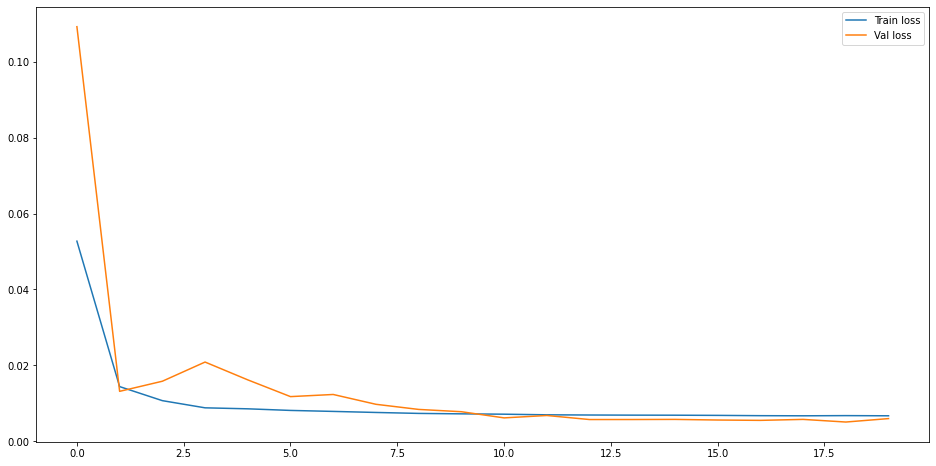

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(r.history['loss'], label='Train loss')
plt.plot(r.history['val_loss'], label='Val loss')
plt.legend()
plt.show()

In [ ]:
t_pred = y_val.shape[0]
y_val_pred = np.zeros(y_val.shape)

X_val_pred = X_val.copy()

for i in range(t_pred):
    y_val_pred[i] = mke.predict(X_val_pred[i].reshape(-1, T, 1))
    X_val_pred[0:-1] = X_val_pred[1:]
    X_val_pred[-1] = y_val_pred[i]

In [ ]:
# y_val_pred[y_val_pred<0] = 0
y_val_pred

array([[0.46018693],
       [0.49775133],
       [0.52876735],
       [0.52069169],
       [0.53656715],
       [0.50888628],
       [0.50272983],
       [0.50783539],
       [0.51866359],
       [0.52452219],
       [0.4799045 ],
       [0.44132119],
       [0.42349109],
       [0.45998162],
       [0.48172277],
       [0.47050023],
       [0.46950445],
       [0.48536259],
       [0.40776691],
       [0.42483523],
       [0.43454537],
       [0.44836947],
       [0.39285684],
       [0.41418985],
       [0.38325554]])

In [ ]:
print(f'RMSLE: {np.sqrt(msle(y_val, y_val_pred).numpy())}')

RMSLE: 0.05709607656375874


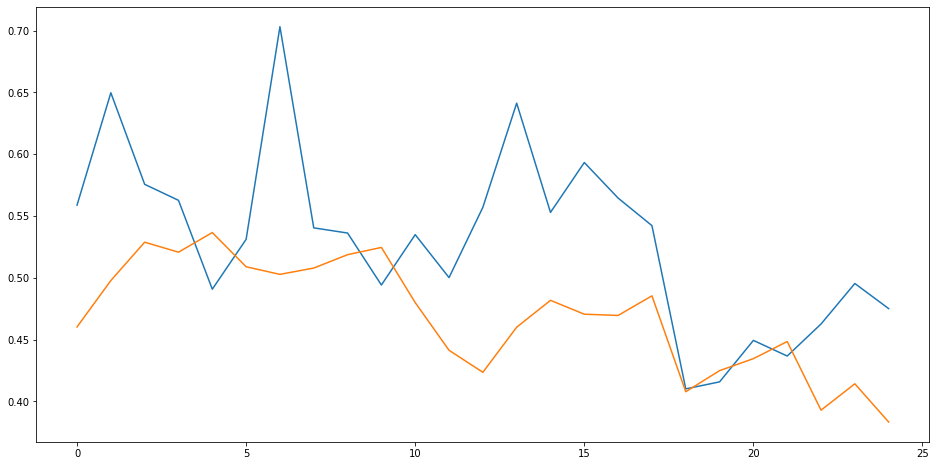

In [ ]:
# kas_echannel
plt.figure(figsize=(16, 8))
plt.plot(y_val)
plt.plot(y_val_pred)
plt.show()

In [ ]:
y_val_pred = scl.inverse_transform(y_val_pred)

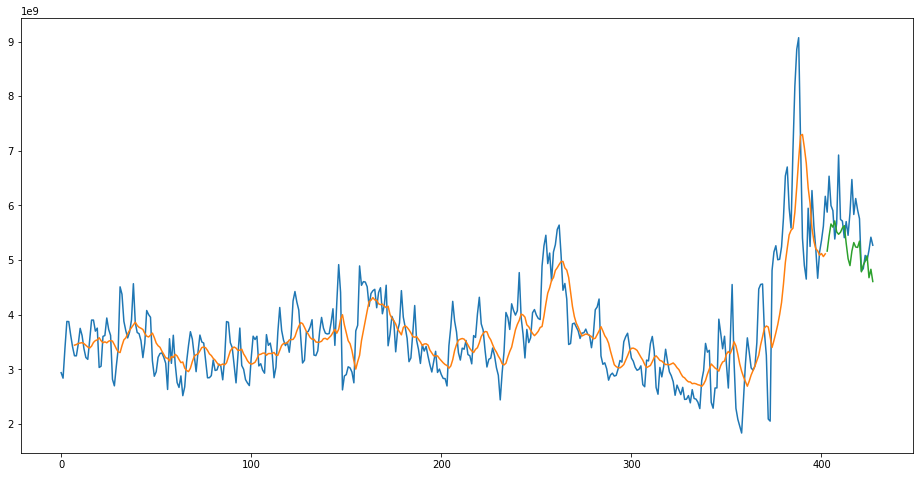

In [ ]:
idx_val = np.array([i for i in range(N-len(y_val), N)])
idx_train = np.array([i for i in range(T, N-len(y_val))])
plt.figure(figsize=(16, 8))
plt.plot(train_df[features].values)
plt.plot(idx_train, scl.inverse_transform(mke.predict(X_train)))
plt.plot(idx_val, y_val_pred)
plt.show()

In [ ]:
print(f'RMSLE: {np.sqrt(msle(scl.inverse_transform(y_val), y_val_pred).numpy())}')

RMSLE: 0.1117512375605199


##### Prediction

In [ ]:
t_pred = 31
y_pred = np.zeros(t_pred)
X_pred = X[-1].reshape(-1, T, 1)
for i in range(t_pred):
    y_pred[i] = mke.predict(X_pred)
    X_pred[:-1] = X_pred[1:]
    X_pred[-1][:-1] = X_pred[-1][1:]
    X_pred[-1][-1] = y_pred[i]

y_pred = scl.inverse_transform(y_pred.reshape(-1, 1))

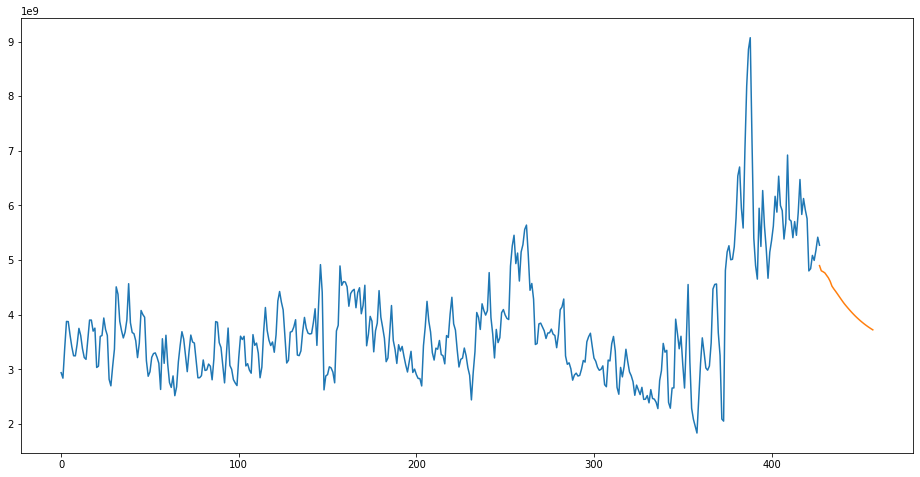

In [ ]:
idx_pred = [i+train_df.index[-1] for i in range(t_pred)]
plt.figure(figsize=(16, 8))
plt.plot(train_df['kas_echannel'].values)
plt.plot(idx_pred, y_pred)
plt.show()

#### kas_echannel log fbprophet

In [ ]:
from fbprophet import Prophet

In [ ]:
log_train_df = pd.DataFrame()
log_train_df['kas_echannel'] = np.log(train_df['kas_echannel'])
log_train_df['periode'] = train_df['periode']

In [ ]:
val_period = 45
log_ke_train_df = log_train_df.reset_index(drop=True)[:-val_period].rename(columns={'periode': 'ds', 'kas_echannel':'y'})
scl = MinMaxScaler()
log_ke_train_df['y'] = scl.fit_transform(log_ke_train_df['y'].values.reshape(-1, 1))
y_val = log_train_df['kas_echannel'][-val_period:]

##### Train

In [ ]:
m = Prophet(daily_seasonality=True)

In [ ]:
m.fit(log_ke_train_df)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Forecast

In [ ]:
future = m.make_future_dataframe(periods=val_period + 31)
forecast = m.predict(future)

##### Evaluation

In [ ]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2019-07-31,0.392430,0.186501,0.511643,0.392430,0.392430,-0.042133,-0.042133,-0.042133,-0.042133,-0.042133,-0.042133,0.0,0.0,0.0,0.350298
1,2019-08-01,0.392466,0.172231,0.506281,0.392466,0.392466,-0.042299,-0.042299,-0.042299,-0.042299,-0.042299,-0.042299,0.0,0.0,0.0,0.350166
2,2019-08-02,0.392501,0.230429,0.549912,0.392501,0.392501,-0.005378,-0.005378,-0.005378,-0.005378,-0.005378,-0.005378,0.0,0.0,0.0,0.387122
3,2019-08-03,0.392536,0.305824,0.629317,0.392536,0.392536,0.070707,0.070707,0.070707,0.070707,0.070707,0.070707,0.0,0.0,0.0,0.463243
4,2019-08-04,0.392571,0.256896,0.595089,0.392571,0.392571,0.038265,0.038265,0.038265,0.038265,0.038265,0.038265,0.0,0.0,0.0,0.430835
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
454,2020-10-27,0.556663,0.374351,0.696038,0.551610,0.561458,-0.025505,-0.025505,-0.025505,-0.025505,-0.025505,-0.025505,0.0,0.0,0.0,0.531158
455,2020-10-28,0.557784,0.345990,0.669713,0.552572,0.562688,-0.042133,-0.042133,-0.042133,-0.042133,-0.042133,-0.042133,0.0,0.0,0.0,0.515651
456,2020-10-29,0.558905,0.359660,0.694272,0.553583,0.563974,-0.042299,-0.042299,-0.042299,-0.042299,-0.042299,-0.042299,0.0,0.0,0.0,0.516606
457,2020-10-30,0.560025,0.405908,0.705936,0.554595,0.565245,-0.005378,-0.005378,-0.005378,-0.005378,-0.005378,-0.005378,0.0,0.0,0.0,0.554647


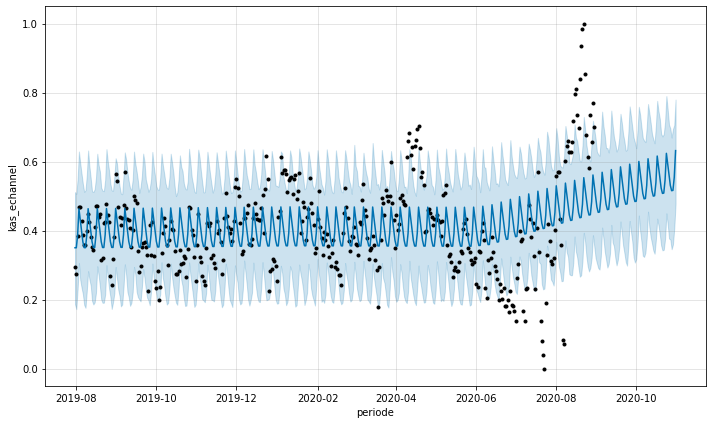

In [ ]:
figure = m.plot(forecast, xlabel='periode', ylabel='kas_echannel')

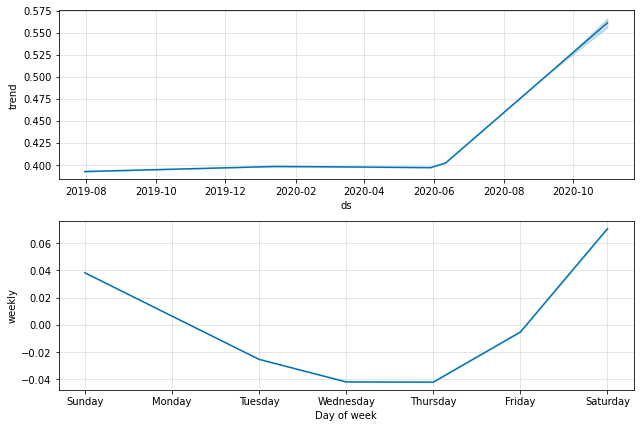

In [ ]:
f = m.plot_components(forecast)

In [ ]:
y_val_pred = scl.inverse_transform(forecast['yhat'][-(val_period+31):-31].values.reshape(-1, 1))

In [ ]:
print(f'RMSLE val: {root_mean_squared_log_error(np.exp(y_val.values), np.exp(y_val_pred))}')

RMSLE val: 0.14023504870215447


##### Prediction

In [ ]:
y_pred = np.exp(scl.inverse_transform(forecast['yhat'][-31:].values.reshape(-1, 1)))
y_pred

array([[3.98420178e+09],
       [4.23394524e+09],
       [4.78997233e+09],
       [4.55609710e+09],
       [4.33725763e+09],
       [4.12939904e+09],
       [4.02832112e+09],
       [4.03446898e+09],
       [4.28736336e+09],
       [4.85040563e+09],
       [4.61357969e+09],
       [4.39197919e+09],
       [4.18149813e+09],
       [4.07914495e+09],
       [4.08537037e+09],
       [4.34145543e+09],
       [4.91160139e+09],
       [4.67178751e+09],
       [4.44739116e+09],
       [4.23425454e+09],
       [4.13061001e+09],
       [4.13691397e+09],
       [4.39622996e+09],
       [4.97356924e+09],
       [4.73072972e+09],
       [4.50350225e+09],
       [4.28767656e+09],
       [4.18272438e+09],
       [4.18910788e+09],
       [4.45169556e+09],
       [5.03631892e+09]])

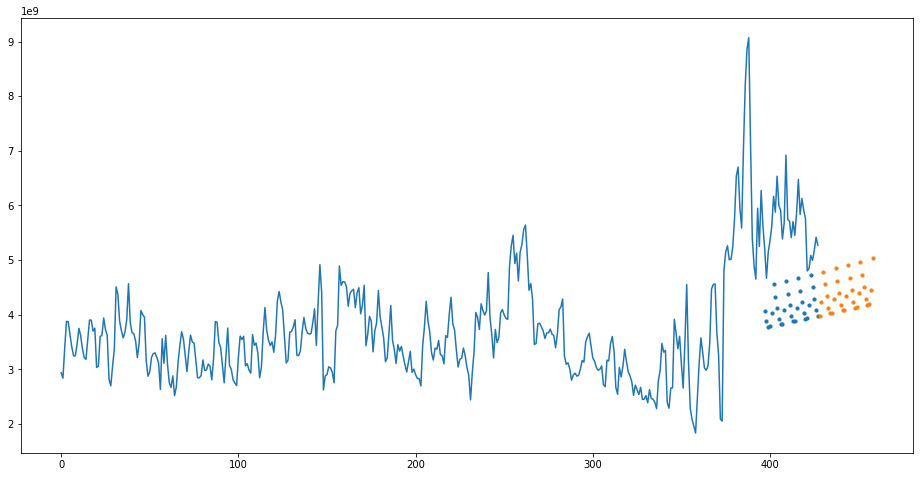

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(train_df['kas_echannel'].values)
plt.scatter(y_val.index, np.exp(y_val_pred), s=10)
plt.scatter(y_val.index+31, y_pred, s=10)
plt.show()

#### kas_echannel fbprophet

In [ ]:
from fbprophet import Prophet

In [ ]:
val_period = 45
train_ke_pr_df = train_df.reset_index(drop=True)[:-val_period].rename(columns={'periode': 'ds', 'kas_echannel':'y'})
scl = MinMaxScaler()
train_ke_pr_df['y'] = scl.fit_transform(train_ke_pr_df['y'].values.reshape(-1, 1))
y_val = train_df['kas_echannel'][-val_period:]

##### Train

In [ ]:
m = Prophet(daily_seasonality=True)

In [ ]:
m.fit(train_ke_pr_df)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


Forecast

In [ ]:
future = m.make_future_dataframe(periods=val_period + 31)
forecast = m.predict(future)

##### Evaluation

In [ ]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,weekly,weekly_lower,weekly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2019-07-31,0.245328,0.099727,0.447214,0.245328,0.245328,0.028981,0.028981,0.028981,0.075443,0.075443,0.075443,-0.046462,-0.046462,-0.046462,0.0,0.0,0.0,0.274309
1,2019-08-01,0.245538,0.093296,0.440450,0.245538,0.245538,0.024357,0.024357,0.024357,0.075443,0.075443,0.075443,-0.051086,-0.051086,-0.051086,0.0,0.0,0.0,0.269895
2,2019-08-02,0.245749,0.134453,0.486855,0.245749,0.245749,0.066420,0.066420,0.066420,0.075443,0.075443,0.075443,-0.009023,-0.009023,-0.009023,0.0,0.0,0.0,0.312168
3,2019-08-03,0.245959,0.218451,0.574339,0.245959,0.245959,0.157479,0.157479,0.157479,0.075443,0.075443,0.075443,0.082036,0.082036,0.082036,0.0,0.0,0.0,0.403438
4,2019-08-04,0.246169,0.203842,0.546389,0.246169,0.246169,0.120884,0.120884,0.120884,0.075443,0.075443,0.075443,0.045441,0.045441,0.045441,0.0,0.0,0.0,0.367054
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
454,2020-10-27,0.241433,0.132544,0.465367,0.239031,0.243772,0.048663,0.048663,0.048663,0.075443,0.075443,0.075443,-0.026780,-0.026780,-0.026780,0.0,0.0,0.0,0.290096
455,2020-10-28,0.241247,0.092040,0.449957,0.238801,0.243653,0.028981,0.028981,0.028981,0.075443,0.075443,0.075443,-0.046462,-0.046462,-0.046462,0.0,0.0,0.0,0.270228
456,2020-10-29,0.241062,0.090964,0.425911,0.238555,0.243534,0.024357,0.024357,0.024357,0.075443,0.075443,0.075443,-0.051086,-0.051086,-0.051086,0.0,0.0,0.0,0.265419
457,2020-10-30,0.240876,0.144146,0.469233,0.238323,0.243392,0.066420,0.066420,0.066420,0.075443,0.075443,0.075443,-0.009023,-0.009023,-0.009023,0.0,0.0,0.0,0.307296


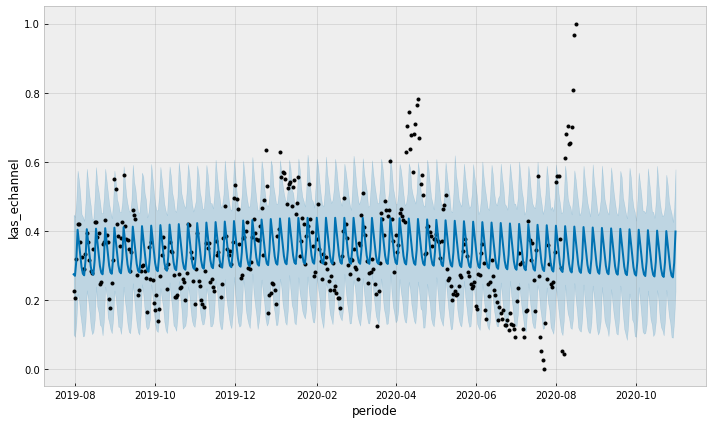

In [ ]:
figure = m.plot(forecast, xlabel='periode', ylabel='kas_echannel')

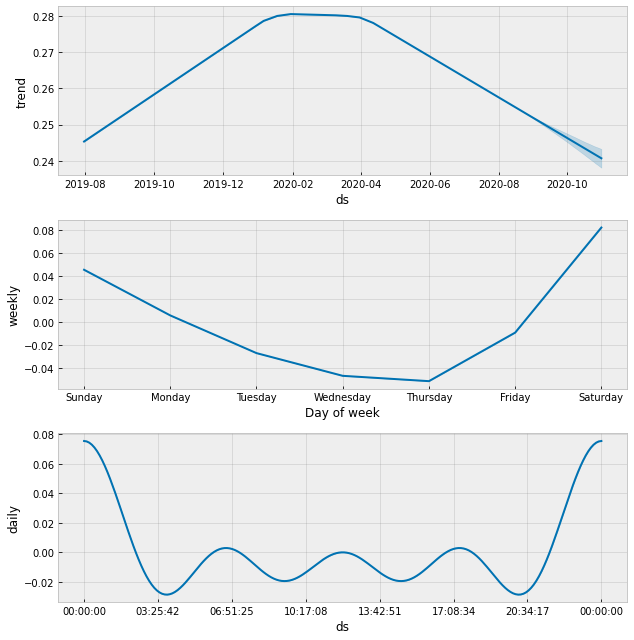

In [ ]:
f = m.plot_components(forecast)

In [ ]:
y_val_pred = scl.inverse_transform(forecast['yhat'][-(val_period+31):-31].values.reshape(-1, 1))

In [ ]:
print(f'RMSLE val: {root_mean_squared_log_error(y_val.values, y_val_pred)}')

RMSLE val: 0.24106343159100307


##### Prediction

In [ ]:
y_pred = scl.inverse_transform(forecast['yhat'][-31:].values.reshape(-1, 1))
y_pred

array([[3.15235515e+09],
       [3.35627319e+09],
       [3.79877307e+09],
       [3.61967613e+09],
       [3.42611357e+09],
       [3.26619833e+09],
       [3.16945522e+09],
       [3.14603659e+09],
       [3.34995463e+09],
       [3.79245451e+09],
       [3.61335757e+09],
       [3.41979501e+09],
       [3.25987977e+09],
       [3.16313666e+09],
       [3.13971803e+09],
       [3.34363607e+09],
       [3.78613595e+09],
       [3.60703901e+09],
       [3.41347645e+09],
       [3.25356121e+09],
       [3.15681810e+09],
       [3.13339947e+09],
       [3.33731751e+09],
       [3.77981739e+09],
       [3.60072045e+09],
       [3.40715789e+09],
       [3.24724265e+09],
       [3.15049954e+09],
       [3.12708091e+09],
       [3.33099895e+09],
       [3.77349883e+09]])

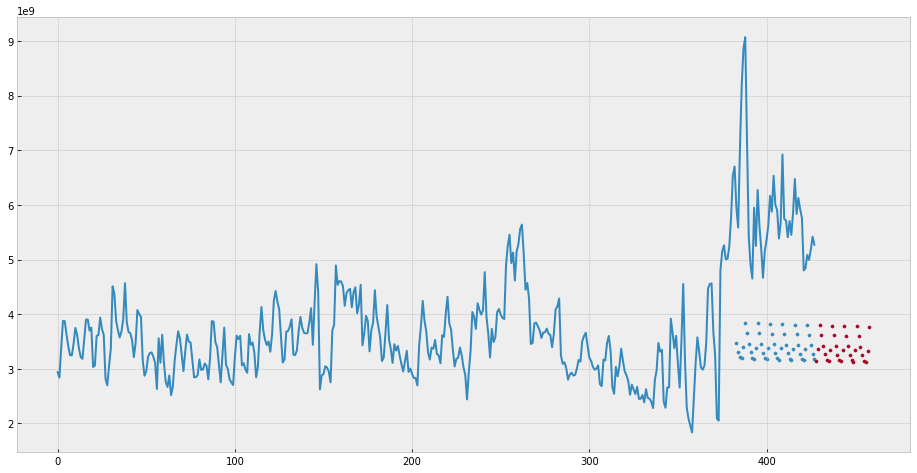

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(train_df['kas_echannel'].values)
plt.scatter(y_val.index, y_val_pred, s=10)
plt.scatter((y_val.index+31)[-31:], y_pred, s=10)
plt.show()

#### kas_echannel diff fbprophet

In [ ]:
from fbprophet import Prophet
from fbprophet.diagnostics import cross_validation, performance_metrics

In [ ]:
val_period = 31
train_diff_ke_pr_df = train_diff_df.reset_index(drop=True)[:-val_period].rename(columns={'periode': 'ds', 'kas_echannel_diff':'y'})
scl = MinMaxScaler()
train_diff_ke_pr_df['y'] = scl.fit_transform(train_diff_ke_pr_df['y'].values.reshape(-1, 1))
y_val = train_diff_df['kas_echannel_diff'][-val_period:]

In [ ]:
n_train = int(len(train_diff_ke_pr_df) * 0.8)
n_train

317

##### Train

In [ ]:
m = Prophet(seasonality_mode='additive', weekly_seasonality=True)

In [ ]:
m.fit(train_diff_ke_pr_df)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [ ]:
df_cv = cross_validation(m, initial=f'{n_train} days', period=f'{val_period} days', horizon=f'{val_period*2} days')
df_p = performance_metrics(df_cv)
df_p.head()

INFO:fbprophet:Making 1 forecasts with cutoffs between 2020-06-29 00:00:00 and 2020-06-29 00:00:00


INFO:fbprophet:Skipping MAPE because y close to 0


,horizon,mse,rmse,mae,mdape,coverage
0,6 days,0.002521,0.050211,0.031013,0.033902,0.833333
1,7 days,0.002691,0.051878,0.034113,0.045522,0.833333
2,8 days,0.007729,0.087914,0.062093,0.078727,0.666667
3,9 days,0.005495,0.074126,0.043462,0.045522,0.833333
4,10 days,0.006693,0.081810,0.057235,0.078727,0.833333


In [ ]:
df_cv.head()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2020-06-30,0.378087,0.300026,0.460656,0.396234,2020-06-29
1,2020-07-01,0.389677,0.294195,0.471487,0.383595,2020-06-29
2,2020-07-02,0.403044,0.321417,0.489853,0.518899,2020-06-29
3,2020-07-03,0.444892,0.364214,0.531811,0.447079,2020-06-29
4,2020-07-04,0.479729,0.391068,0.562965,0.515305,2020-06-29


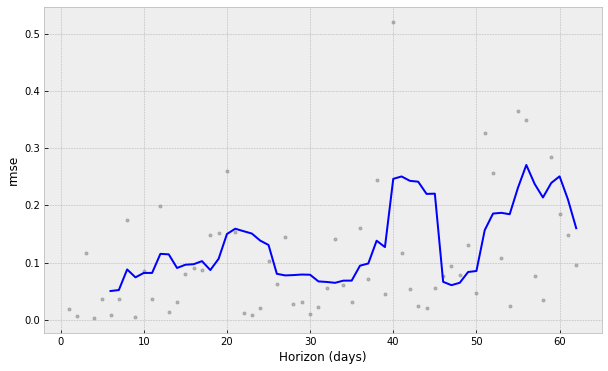

In [ ]:
from fbprophet.plot import plot_cross_validation_metric
fig = plot_cross_validation_metric(df_cv, metric='rmse')

In [ ]:
import itertools

param_grid = {
    'changepoint_prior_scale': [0.005, 0.01, 0.05],
    'seasonality_prior_scale': [0.8, 1.0, 2.0],
    'holidays_prior_scale': [0.001, 0.01, 0.1,],
    'changepoint_range': [0.65, 0.7, 0.8],
    'seasonality_mode': ['additive', 'multiplicative']
}

# Generate all combinations of parameters
all_params = [dict(zip(param_grid.keys(), v)) for v in itertools.product(*param_grid.values())]
rmses = []  # Store the RMSEs for each params here

# Use cross validation to evaluate all parameters
for params in all_params:
    m = Prophet(**params).fit(train_diff_ke_pr_df)  # Fit model with given params
    df_cv = cross_validation(m, initial=f'{n_train} days', period=f'{val_period} days', horizon=f'{val_period*2} days', parallel='processes')
    df_p = performance_metrics(df_cv, rolling_window=1)
    rmses.append(df_p['rmse'].values[0])

best_params = all_params[np.argmin(rmses)]
print(best_params)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2020-06-29 00:00:00 and 2020-06-29 00:00:00
INFO:fbprophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f63bfc43a90>
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:fbprophet:Making 1 forecasts with cutoffs between 2020-06-29 00:00:00 and 2020-06-29 00:00:00
INFO:fbprophet:Applying in parallel with <concurrent.futures.process.ProcessPoolExecutor object at 0x7f63c041f780>
INFO:fbprophet:Skipping MAPE because y close to 0
INFO:fbprophet:Disabling yearly seasonality. Run prophet wit

{'changepoint_prior_scale': 0.01, 'seasonality_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'changepoint_range': 0.65, 'seasonality_mode': 'multiplicative'}


In [ ]:
# {'changepoint_prior_scale': 0.01,
# 'seasonality_prior_scale': 2.0,
# 'holidays_prior_scale': 0.001,
# 'changepoint_range': 0.7,
# 'seasonality_mode': 'multiplicative'}

In [ ]:
m = Prophet(**best_params)
m.fit(train_diff_ke_pr_df)

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Forecast

##### Evaluation

In [ ]:
future = m.make_future_dataframe(periods=val_period+31)
forecast = m.predict(future)

In [ ]:
forecast

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,weekly,weekly_lower,weekly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat
0,2019-07-31,0.411699,0.291268,0.498178,0.411699,0.411699,-0.038358,-0.038358,-0.038358,-0.038358,-0.038358,-0.038358,0.0,0.0,0.0,0.395907
1,2019-08-01,0.411693,0.311946,0.523651,0.411693,0.411693,0.008241,0.008241,0.008241,0.008241,0.008241,0.008241,0.0,0.0,0.0,0.415085
2,2019-08-02,0.411686,0.355474,0.561966,0.411686,0.411686,0.100728,0.100728,0.100728,0.100728,0.100728,0.100728,0.0,0.0,0.0,0.453155
3,2019-08-03,0.411680,0.403332,0.612755,0.411680,0.411680,0.233028,0.233028,0.233028,0.233028,0.233028,0.233028,0.0,0.0,0.0,0.507613
4,2019-08-04,0.411674,0.266324,0.462154,0.411674,0.411674,-0.116398,-0.116398,-0.116398,-0.116398,-0.116398,-0.116398,0.0,0.0,0.0,0.363756
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
454,2020-10-27,0.408796,0.269481,0.478405,0.408796,0.408796,-0.091713,-0.091713,-0.091713,-0.091713,-0.091713,-0.091713,0.0,0.0,0.0,0.371304
455,2020-10-28,0.408789,0.285965,0.496287,0.408789,0.408789,-0.038358,-0.038358,-0.038358,-0.038358,-0.038358,-0.038358,0.0,0.0,0.0,0.393109
456,2020-10-29,0.408783,0.308373,0.513872,0.408783,0.408783,0.008241,0.008241,0.008241,0.008241,0.008241,0.008241,0.0,0.0,0.0,0.412152
457,2020-10-30,0.408777,0.341849,0.551114,0.408777,0.408777,0.100728,0.100728,0.100728,0.100728,0.100728,0.100728,0.0,0.0,0.0,0.449952


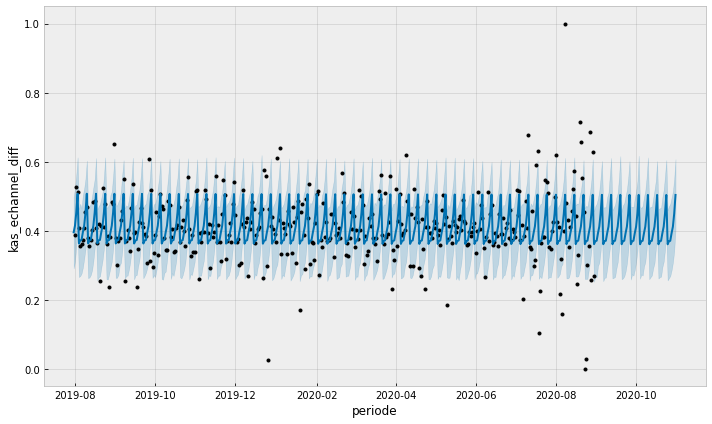

In [ ]:
figure = m.plot(forecast, xlabel='periode', ylabel='kas_echannel_diff')

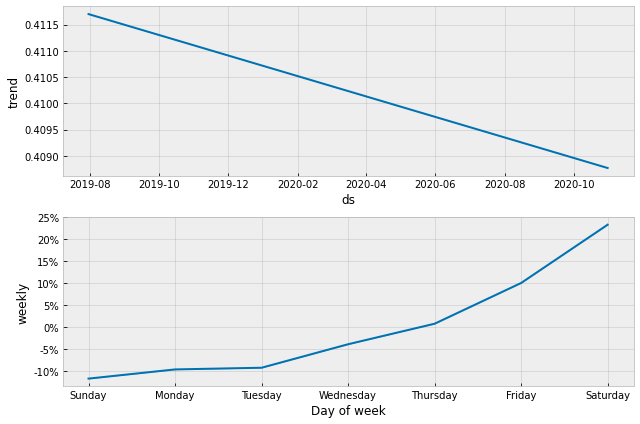

In [ ]:
f = m.plot_components(forecast)

In [ ]:
# y_forecast = (0.51*forecast['yhat_upper'][1:] + 0.49*forecast['yhat_lower'][1:]).reset_index(drop=True)
y_forecast = forecast['yhat'][1:].reset_index(drop=True)
y_val_scaled_pred = y_forecast[-(val_period+31):-31].values.reshape(-1, 1)
y_val_pred = scl.inverse_transform(y_val_scaled_pred)
print(f'RMSLE scaled val: {root_mean_squared_log_error(scl.transform(y_val.values.reshape(-1, 1)), y_val_scaled_pred)}')
print(f'RMSLE val: {root_mean_squared_log_error(y_val.values, y_val_pred)}')

RMSLE scaled val: 0.028040197371957797
RMSLE val: nan


In [ ]:
X_val = train_df['kas_echannel'].values[-(val_period+1)]
y_ke_val_pred = np.zeros(len(y_val_pred))
for i in range(len(y_val_pred)):
    y_ke_val_pred[i] = X_val + y_val_pred[i]
    X_val = y_ke_val_pred[i]
y_ke_val_pred

array([5.44658722e+09, 5.27502208e+09, 5.20516393e+09, 5.22412647e+09,
       5.41940149e+09, 5.86689148e+09, 5.64812600e+09, 5.46912453e+09,
       5.29736990e+09, 5.22731113e+09, 5.24606333e+09, 5.44110871e+09,
       5.88834147e+09, 5.66939165e+09, 5.49020149e+09, 5.31825737e+09,
       5.24799797e+09, 5.26653983e+09, 5.46135558e+09, 5.90833110e+09,
       5.68919694e+09, 5.50981809e+09, 5.33768448e+09, 5.26722447e+09,
       5.28555598e+09, 5.48014210e+09, 5.92686038e+09, 5.70754188e+09,
       5.52797433e+09, 5.35565124e+09, 5.28499060e+09])

In [ ]:
train_df['kas_echannel'].values[-val_period:]

array([5.20930e+09, 4.66740e+09, 5.14595e+09, 5.35700e+09, 5.62145e+09,
       6.16750e+09, 5.87775e+09, 6.53570e+09, 5.99965e+09, 5.90590e+09,
       5.38565e+09, 5.67755e+09, 6.92255e+09, 5.74470e+09, 5.71440e+09,
       5.41010e+09, 5.70495e+09, 5.45350e+09, 5.86485e+09, 6.47470e+09,
       5.83525e+09, 6.12725e+09, 5.91910e+09, 5.75775e+09, 4.80200e+09,
       4.84300e+09, 5.08580e+09, 4.99430e+09, 5.18190e+09, 5.41905e+09,
       5.27190e+09])

In [ ]:
print(f"RMSLE val: {root_mean_squared_log_error(train_df['kas_echannel'].values[-val_period:], y_ke_val_pred)}")

RMSLE val: 0.038075054846899326


##### Prediction

In [ ]:
y_scaled_pred = y_forecast[-31:].values.reshape(-1, 1)
y_pred = scl.inverse_transform(y_scaled_pred)
y_pred

array([[ 1.81211755e+07],
       [ 1.94356477e+08],
       [ 4.46461048e+08],
       [-2.19502837e+08],
       [-1.79756243e+08],
       [-1.72512583e+08],
       [-7.08612563e+07],
       [ 1.79108341e+07],
       [ 1.94126841e+08],
       [ 4.46203811e+08],
       [-2.19687176e+08],
       [-1.79944936e+08],
       [-1.72702072e+08],
       [-7.10618762e+07],
       [ 1.77004928e+07],
       [ 1.93897205e+08],
       [ 4.45946575e+08],
       [-2.19871515e+08],
       [-1.80133629e+08],
       [-1.72891561e+08],
       [-7.12624960e+07],
       [ 1.74901514e+07],
       [ 1.93667569e+08],
       [ 4.45689338e+08],
       [-2.20055854e+08],
       [-1.80322321e+08],
       [-1.73081049e+08],
       [-7.14631159e+07],
       [ 1.72798101e+07],
       [ 1.93437933e+08],
       [ 4.45432101e+08]])

In [ ]:
X_pred = train_df['kas_echannel'].values[-1]
y_ke_pred = np.zeros(len(y_pred))
for i in range(len(y_pred)):
    y_ke_pred[i] = X_pred + y_pred[i]
    X_pred = y_ke_pred[i]
y_ke_pred

array([5.29002118e+09, 5.48437765e+09, 5.93083870e+09, 5.71133586e+09,
       5.53157962e+09, 5.35906704e+09, 5.28820578e+09, 5.30611662e+09,
       5.50024346e+09, 5.94644727e+09, 5.72676009e+09, 5.54681516e+09,
       5.37411309e+09, 5.30305121e+09, 5.32075170e+09, 5.51464891e+09,
       5.96059548e+09, 5.74072397e+09, 5.56059034e+09, 5.38769878e+09,
       5.31643628e+09, 5.33392643e+09, 5.52759400e+09, 5.97328334e+09,
       5.75322749e+09, 5.57290516e+09, 5.39982411e+09, 5.32836100e+09,
       5.34564081e+09, 5.53907874e+09, 5.98451084e+09])

In [ ]:
(y_val.index+31)[-31:]

RangeIndex(start=428, stop=459, step=1)

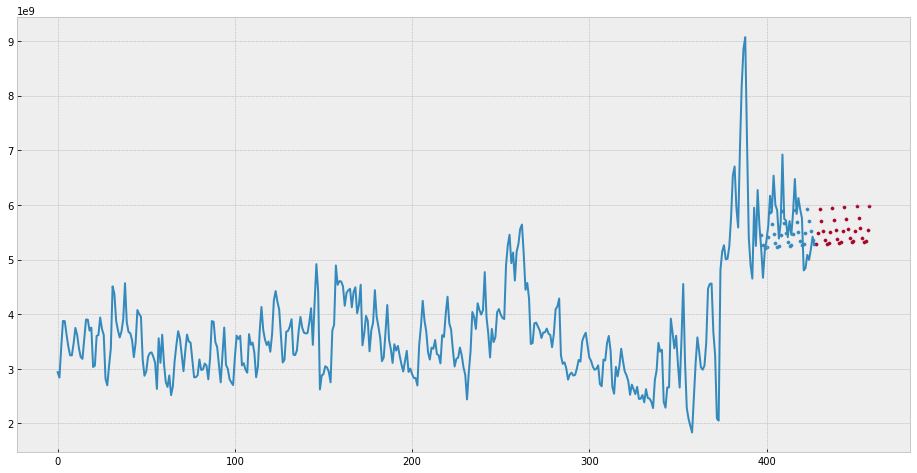

In [ ]:
plt.figure(figsize=(16, 8))
plt.plot(train_df['kas_echannel'].values)
plt.scatter(y_val.index, y_ke_val_pred, s=10)
plt.scatter((y_val.index+31)[-31:], y_ke_pred, s=10)
plt.show()

### Prediction

In [ ]:
y_lr_pred = pd.read_csv('bri_co (1).csv')['value'][:31]
y_lr_pred

0     1.138980e+13
1     1.141627e+13
2     1.144274e+13
3     1.146921e+13
4     1.149568e+13
5     1.152215e+13
6     1.154862e+13
7     1.157509e+13
8     1.160156e+13
9     1.162803e+13
10    1.165450e+13
11    1.168097e+13
12    1.170744e+13
13    1.173391e+13
14    1.176037e+13
15    1.178684e+13
16    1.181331e+13
17    1.183978e+13
18    1.186625e+13
19    1.189272e+13
20    1.191919e+13
21    1.194566e+13
22    1.197213e+13
23    1.199860e+13
24    1.202507e+13
25    1.205154e+13
26    1.207801e+13
27    1.210448e+13
28    1.213095e+13
29    1.215742e+13
30    1.218389e+13
Name: value, dtype: float64

#### Predictions Analysis

In [ ]:
# 50% public data and using kas_kantor bri_co (1).csv
subm = {
    # 'bri_co.csv': 0.11617,
    # 'bri_co (1).csv': 0.09651,
    # 'bri_co_lgbmd.csv': 0.10682,
    # 'bri_co_rfd.csv': 0.09520,
    # 'bri_co_lgbmd_3.csv': 0.11629,
    # 'bri_co_gslgbmd.csv': 0.10308,
    # 'bri_co_kkgsrfd_pred.csv': 0.09104,
    # 'bri_co_gsrfd.csv': 0.10201,
    'bri_co_kkgsrfd_gsxgbd.csv': 0.08749,
    'bri_co_kklgbmd.csv': 0.09215,
    # 'bri_co_kkgsrfd_fbprophet_diff.csv': 0.06805,
    # 'bri_co_kkgsrfd_fbprophet_diff (1).csv': 0.06771,
    # 'bri_co_kkgsrfd_fbprophet_diff (2).csv': 0.06413,
    # 'bri_co_kkgsrfd_fbprophet_diff_avg.csv': 0.06356,
    # 'bri_co_kkgsrfd_fbprophet_diff_avg (1).csv': 0.06404,
    # 'bri_co_kkgsrfd_fbprophet_diff_avg (2).csv': 0.07348,
    # 'bri_co_kkgsrfd_fbprophet_diff_avg (3).csv': 0.05436,
    # 'bri_co_kkgsrfd_fbprophet_diff_avg (6).csv': 0.05046,
    # 'bri_co_kkgsrfd_fbprophet_diff_avg (8).csv': 0.05005,
    # 'bri_co_kkgsrfd_fbprophet_diff_avg (9).csv': 0.05002,
    # 'bri_co_kkgsrfd_fbprophet_diff_ext.csv': 0.04846,
    'bri_co_kkgsrfd_fbprophet_diff_ext (1).csv': 0.04713,
    # 'bri_co_kkgsrfd_fbprophet_diff_ext (2).csv': 0.04736,
}

##### kas_kantor

In [ ]:
# kkrfd_pred = kk_make_predictions(kkrfd)
# kkgbmd_pred = kk_make_predictions(kkgbmd)
# kkxgbd_pred = kk_make_predictions(kkxgbd)
# kklgbmd_pred = kk_make_predictions(kklgbmd)

# kkgsrfd_pred = kk_make_predictions(kkgsrfd)
# kkgsxgbd_pred = kk_make_predictions(kkgsxgbd)
# kkgslgbmd_pred = kk_make_predictions(kkgslgbmd)

# mkkd_pred = kk_make_predictions(mkkd)

In [ ]:
wk1 = 0.25
wk2 = 0.75
y_kk_pred_avg = wk1 * pd.read_csv('bri_co_kklgbmd.csv')['value'].values[:31] + wk2 * pd.read_csv('bri_co_kkgsrfd_fbprophet_diff_ext (1).csv')['value'].values[:31]

In [ ]:
wke1 = 0.75
wke2 = 0.25
y_kk_pred_ext = (-wke2 * pd.read_csv('bri_co_kklgbmd.csv')['value'].values[:31] + pd.read_csv('bri_co_kkgsrfd_fbprophet_diff_ext (1).csv')['value'].values[:31]) / wke1

In [ ]:
y_kk_pred_comb = y_kk_pred_avg.copy()
y_kk_pred_comb[:18] = y_kk_pred_ext[:18]

In [ ]:
f_grad = 3
y_kk_pred_grad = y_kk_pred.copy()
y_kk_pred_grad -= y_kk_pred[0]
y_kk_pred_grad *= f_grad
# y_kk_pred_grad[1:] += y_kk_pred[0] * 0.01
y_kk_pred_grad += y_kk_pred[0]

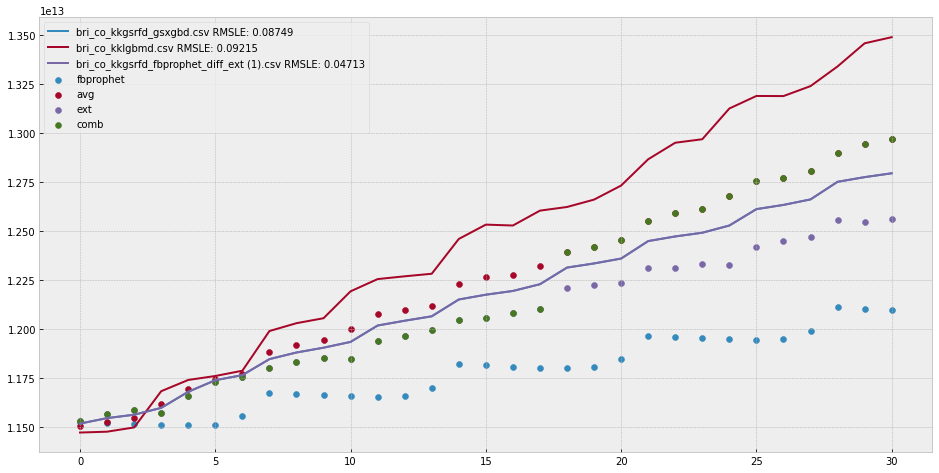

In [ ]:
plt.figure(figsize=(16, 8))
t_pred = 31
x_idx_pred = [i for i in range(t_pred)]
for d in subm.keys():
    if d != 'bri_co (2).csv':
        # plt.scatter(x_idx_pred, pd.read_csv(d)['value'].values[31:], label=f'{d} RMSLE: {subm[d]}')
        plt.plot(pd.read_csv(d)['value'].values[:31], label=f'{d} RMSLE: {subm[d]}')

# plt.plot(kkrfd_pred, label='rfd')
# plt.plot(kkgbmd_pred, label='gbmd')
# plt.plot(kkxgbd_pred, label='xgbd')
# plt.plot(kklgbmd_pred, label='lgbmd')
# plt.plot(kkgsrfd_pred, label='gsrfd')
# plt.plot(kkgsxgbd_pred, label='gsxgbd')
# plt.plot(kkgslgbmd_pred, label='gslgbmd')

# plt.scatter(x_idx_pred, kkrfd_pred, label='rfd')
# plt.scatter(x_idx_pred, kkgbmd_pred, label='gbmd')
# plt.scatter(x_idx_pred, kkxgbd_pred, label='xgbd')
# plt.scatter(x_idx_pred, kklgbmd_pred, label='lgbmd')
# plt.scatter(x_idx_pred, kkgsrfd_pred, label='gsrfd')
# plt.scatter(x_idx_pred, kkgsxgbd_pred, label='gsxgbd')
# plt.scatter(x_idx_pred, kkgslgbmd_pred, label='gslgbmd')
# plt.scatter(x_idx_pred, mkkd_pred, label='mkkd')
plt.scatter(x_idx_pred, y_kk_pred, label='fbprophet')
# plt.scatter(x_idx_pred, y_kk_pred_grad, label='fbprophet_grad')
plt.scatter(x_idx_pred, y_kk_pred_avg, label='avg')
plt.scatter(x_idx_pred, y_kk_pred_ext, label='ext')
plt.scatter(x_idx_pred, y_kk_pred_comb, label='comb')
plt.legend()
plt.show()

In [ ]:
# use best model
y_all_pred = np.append(y_kk_pred_grad, pd.read_csv('bri_co_kkgsrfd_fbprophet_diff_ext (1).csv')['value'].values[31:])

pred_df = pd.DataFrame({
    'index': [i for i in range(len(y_all_pred))],
    'value': y_all_pred
})
filename = 'bri_co_kkgrad_fbprophet_diff_ext (1).csv'
pred_df.to_csv(filename, index=False)

from google.colab import files
files.download(filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

##### kas_echannel

In [ ]:
# rfd_pred = make_predictions(rfd)
# gbmd_pred = make_predictions(gbmd)
# xgbd_pred = make_predictions(xgbd)
# lgbmd_pred = make_predictions(lgbmd)

# gsrfd_pred = make_predictions(gsrfd)
# gsxgbd_pred = make_predictions(gsxgbd)
# gslgbmd_pred = make_predictions(gslgbmd)

In [ ]:
y_fbprophet_avg = pd.read_csv('bri_co_kkgsrfd_fbprophet_diff_avg (9).csv')['value'].values[31:]

In [ ]:
w1 = 0.5
w2 = 0.5

In [ ]:
# y_fbprophet_avg = w1 * pd.read_csv('bri_co_kkgsrfd_fbprophet_diff_avg (6).csv')['value'].values[31:] + w2 * pd.read_csv('bri_co_kkgsrfd_gsxgbd.csv')['value'].values[31:]

In [ ]:
y_fbprophet_ext = y_fbprophet_avg.copy()
y_fbprophet_ext[:-9] = (y_fbprophet_avg[:-9] - w2 * pd.read_csv('bri_co_kkgsrfd_fbprophet_diff (2).csv')['value'].values[31:-9]) / w1
y_fbprophet_ext[-15:-8] = pd.read_csv('bri_co_kkgsrfd_fbprophet_diff_ext (1).csv')['value'].values[-15:-8]

In [ ]:
# y_fbprophet_avg = np.zeros(31)
y_fbprophet_avg[-29:-22] = pd.read_csv('bri_co_kkgsrfd_fbprophet_diff_avg (2).csv')['value'].values[-29:-22]
# y_fbprophet_avg[-8:] = pd.read_csv('bri_co_kkgsrfd_fbprophet_diff.csv')['value'].values[-8:]
y_fbprophet_avg

array([5.30270666e+09, 5.48210489e+09, 5.89580296e+09, 5.68747205e+09,
       5.50920678e+09, 5.32865754e+09, 5.25052193e+09, 5.29036128e+09,
       5.47785693e+09, 5.77979682e+09, 5.56028641e+09, 5.37033452e+09,
       5.17819398e+09, 5.08921485e+09, 5.11858150e+09, 5.29653972e+09,
       5.68377421e+09, 5.46354379e+09, 5.27287189e+09, 5.08001135e+09,
       4.99031222e+09, 5.01895886e+09, 5.19619708e+09, 6.06987473e+09,
       5.94678573e+09, 5.82521886e+09, 5.70425500e+09, 5.68561307e+09,
       5.77711828e+09, 5.93776536e+09, 6.14596418e+09])

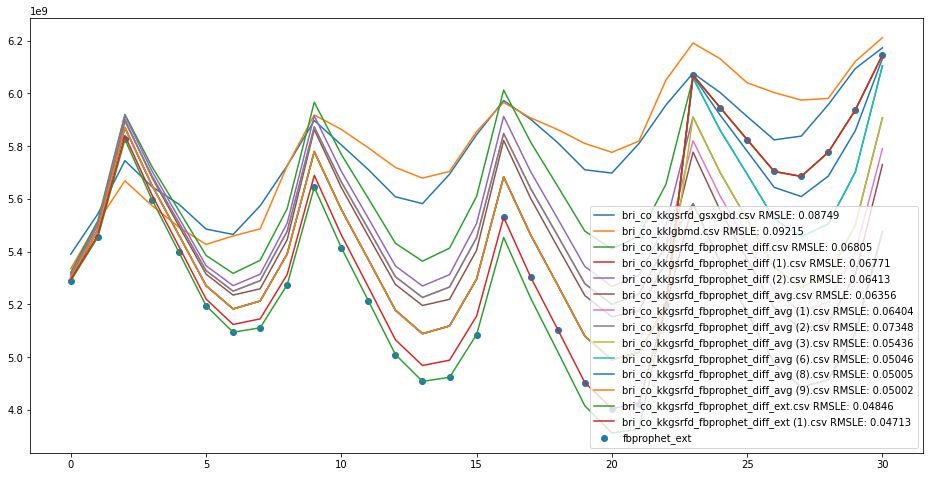

In [ ]:
plt.figure(figsize=(16, 8))
t_pred = 31
x_idx_pred = [i for i in range(t_pred)]
for d in subm.keys():
    # plt.scatter(x_idx_pred, pd.read_csv(d)['value'].values[31:], label=f'{d} RMSLE: {subm[d]}')
    plt.plot(pd.read_csv(d)['value'].values[31:], label=f'{d} RMSLE: {subm[d]}')

# plt.plot(rfd_pred, label='rfd')
# plt.plot(gbmd_pred, label='gbmd')
# plt.plot(xgbd_pred, label='xgbd')
# plt.plot(lgbmd_pred, label='lgbmd')
# plt.plot(gsrfd_pred, label='gsrfd')
# plt.plot(gsxgbd_pred, label='gsxgbd')
# plt.plot(gslgbmd_pred, label='gslgbmd')

# plt.scatter(x_idx_pred, rfd_pred, label='rfd')
# plt.scatter(x_idx_pred, gbmd_pred, label='gbmd')
# plt.scatter(x_idx_pred, xgbd_pred, label='xgbd')
# plt.scatter(x_idx_pred, lgbmd_pred, label='lgbmd')
# plt.scatter(x_idx_pred, pd.read_csv('bri_co_lgbmd_2.csv')['value'].values[31:], label=f'lgbmd_2')
# plt.scatter(x_idx_pred, gsrfd_pred, label='gsrfd')
# plt.scatter(x_idx_pred, gsxgbd_pred, label='gsxgbd')
# plt.scatter(x_idx_pred, gslgbmd_pred, label='gslgbmd')
# plt.scatter(x_idx_pred, y_ke_pred, label='fbprophet')
# plt.scatter(x_idx_pred, y_fbprophet_avg, label='fbprophet_avg')
plt.scatter(x_idx_pred, y_fbprophet_ext, label='fbprophet_ext')
# plt.scatter(x_idx_pred, pd.read_csv('bri_co_gsrfd.csv')['value'].values[31:], label=f'gsrfd_2')
# plt.scatter(x_idx_pred, pd.read_csv('bri_co_gslgbmd.csv')['value'].values[31:], label=f'gslgbmd_2')
plt.legend()
plt.show()

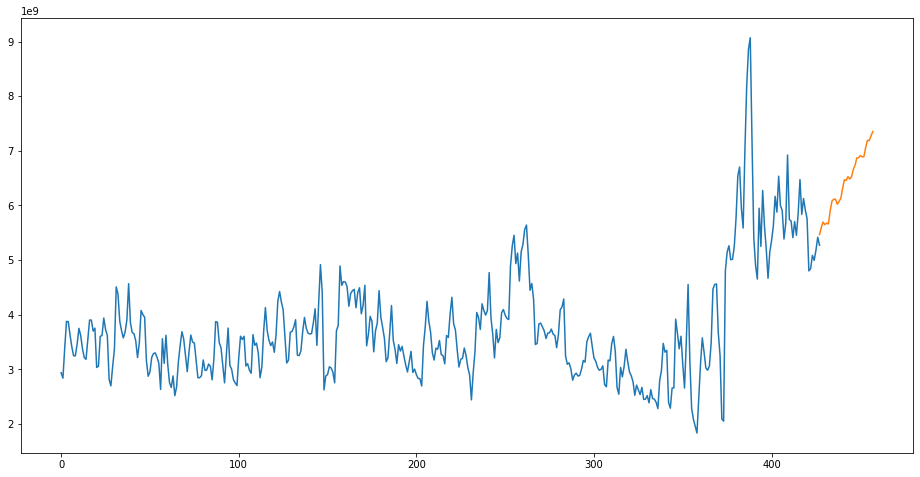

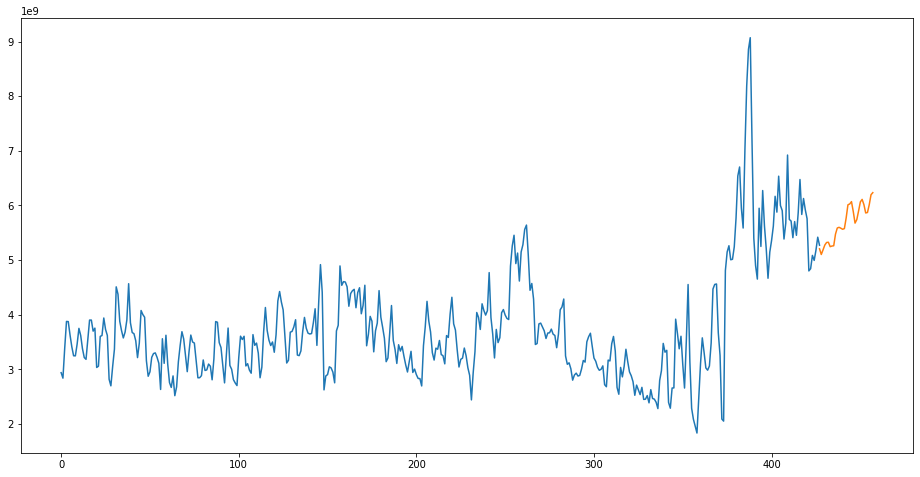

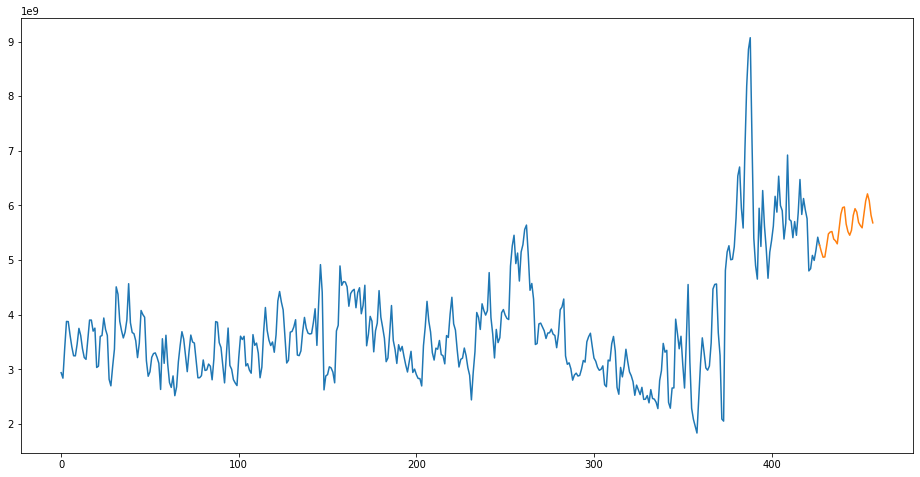

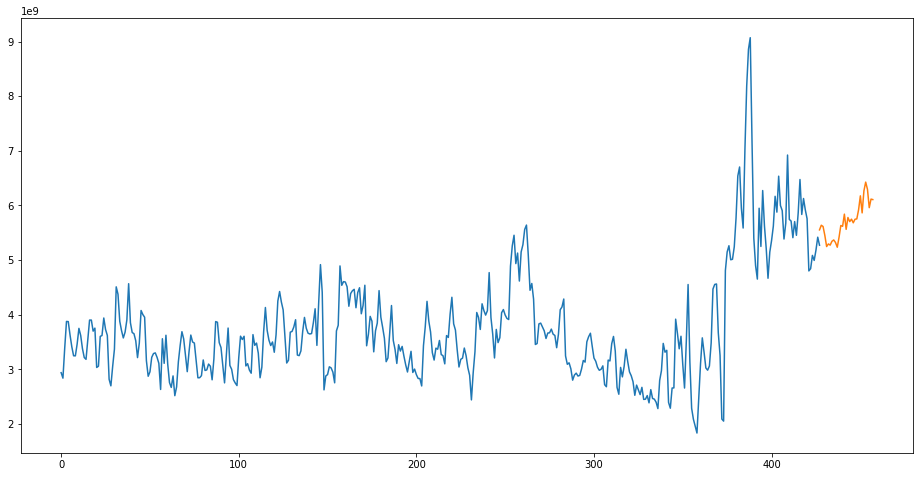

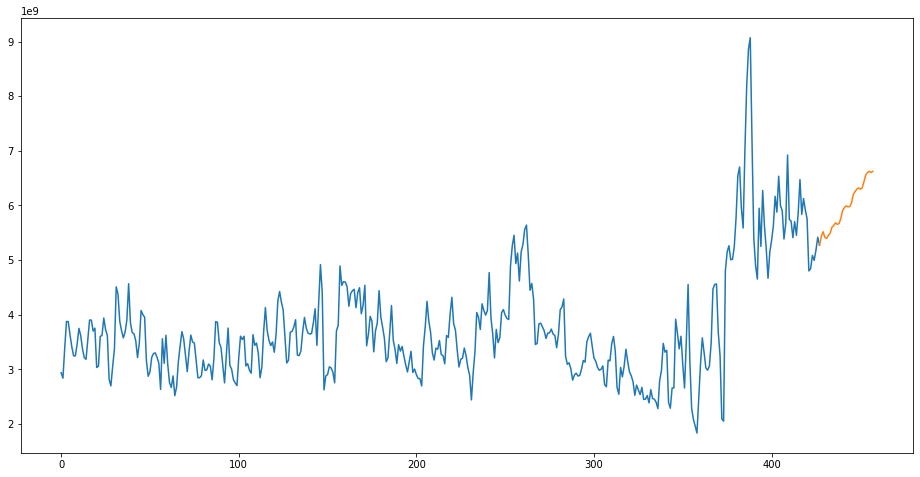

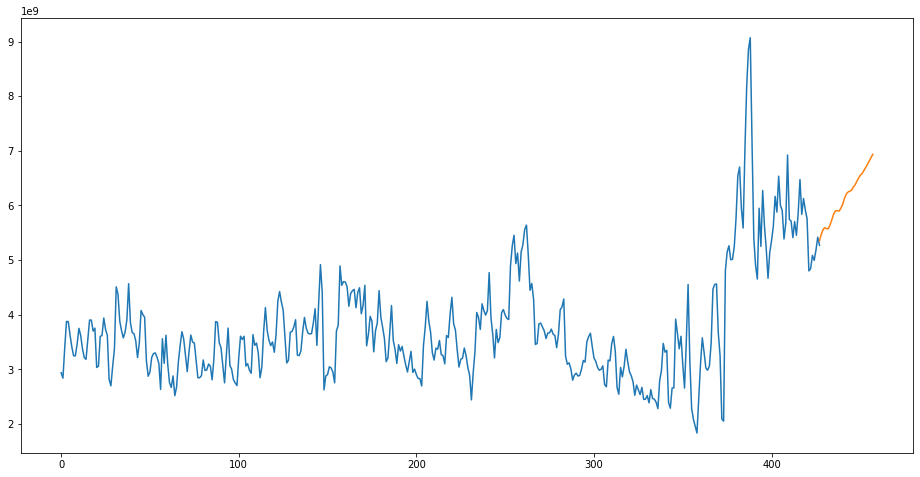

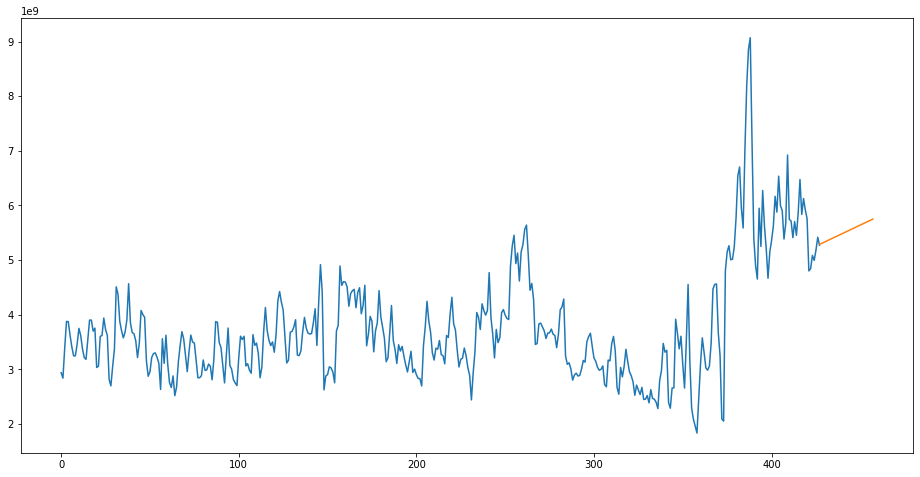

In [ ]:
plot_predictions(rfd_pred)
plot_predictions(gbmd_pred)
plot_predictions(xgbd_pred)
plot_predictions(lgbmd_pred)
plot_predictions(gsrfd_pred)
plot_predictions(gsxgbd_pred)
plot_predictions(gslgbmd_pred)

In [ ]:
# use best model
y_all_pred = np.append(pd.read_csv('bri_co_kkgsrfd_pred.csv')['value'].values[:31], y_fbprophet_ext)

pred_df = pd.DataFrame({
    'index': [i for i in range(len(y_all_pred))],
    'value': y_all_pred
})
filename = 'bri_co_kkgsrfd_fbprophet_diff_ext.csv'
pred_df.to_csv(filename, index=False)

from google.colab import files
files.download(filename)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:

rmsle(np.array([1e9]).reshape(-1, 1), np.array([1.07e9]).reshape(-1, 1))

array([0.06765865])